In [1]:
%load_ext autoreload
%autoreload 2

import sys
import os
import time

import matplotlib.pyplot as plt
%matplotlib inline
import numpy as np

sys.path.append(os.path.join(os.environ['REPO_DIR'], 'utilities'))
from utilities2015 import *
from registration_utilities import *
from annotation_utilities import *
from metadata import *
from data_manager import *

/usr/local/lib/python2.7/dist-packages/matplotlib/__init__.py:1357: UserWarning:  This call to matplotlib.use() has no effect
because the backend has already been chosen;
matplotlib.use() must be called *before* pylab, matplotlib.pyplot,
or matplotlib.backends is imported for the first time.

  warnings.warn(_use_error_msg)


Setting environment for Local Macbook Pro


In [2]:
stack_fixed = 'MD595'
stack_moving = 'atlasV5'
# stack_moving = 'atlasV3'

In [8]:
# classifier_setting = 38
# warp_setting = 15
detector_id = 15
warp_setting = 15

In [5]:
registration_settings

,upstream_warp_id,transform_type,terminate_thresh,grad_computation_sample_number,grid_search_sample_number,std_tx_um,std_ty_um,std_tz_um,std_theta_xy_degree,surround_weight,regularization_weight,comment,max_iter_num
warp_id,,,,,,,,,,,,,
1,None,affine,0.000010,100000.0,1000.0,2000.0,2000.0,2000.0,30.0,0,NaN,NaN,NaN
2,1,rigid,0.000010,100000.0,10000.0,100.0,100.0,100.0,30.0,0,NaN,NaN,NaN
4,1,rigid,0.000001,100000.0,10000.0,100.0,100.0,100.0,10.0,0,0.000001,NaN,NaN
5,1,rigid,0.000001,100000.0,10000.0,100.0,100.0,100.0,30.0,inverse,0.000000,NaN,NaN
6,1,affine,0.000010,100000.0,10000.0,100.0,100.0,100.0,30.0,-0.5,0.000000,NaN,NaN
7,None,rigid,0.000001,100000.0,1000.0,50.0,50.0,50.0,10.0,0,NaN,NaN,NaN
8,None,rigid,0.000001,100000.0,10000.0,200.0,200.0,200.0,30.0,inverse,0.000000,align mid-sagittal planes,NaN
9,8,rigid,0.000001,100000.0,10000.0,2000.0,2000.0,2000.0,30.0,NaN,NaN,global registration given mid-sagittal planes ...,NaN
10,None,rigid,0.000010,100000.0,1000.0,100.0,100.0,100.0,30.0,0,NaN,NaN,NaN


In [9]:
warp_properties = registration_settings.loc[warp_setting]
print warp_properties

upstream_warp_setting = warp_properties['upstream_warp_id']
if upstream_warp_setting == 'None':
    upstream_warp_setting = None
transform_type = warp_properties['transform_type']
terminate_thresh = warp_properties['terminate_thresh']
grad_computation_sample_number = int(warp_properties['grad_computation_sample_number'])
if not np.isnan(warp_properties['grid_search_sample_number']):
    grid_search_sample_number = int(warp_properties['grid_search_sample_number'])
std_tx_um = warp_properties['std_tx_um']
std_ty_um = warp_properties['std_ty_um']
std_tz_um = warp_properties['std_tz_um']
std_tx = std_tx_um/(XY_PIXEL_DISTANCE_LOSSLESS*32)
std_ty = std_ty_um/(XY_PIXEL_DISTANCE_LOSSLESS*32)
std_tz = std_tz_um/(XY_PIXEL_DISTANCE_LOSSLESS*32)
std_theta_xy = np.deg2rad(warp_properties['std_theta_xy_degree'])
if not np.isnan(warp_properties['max_iter_num']):
    max_iter_num = int(warp_properties['max_iter_num'])

surround_weight = warp_properties['surround_weight']
if isinstance(surround_weight, float) or isinstance(surround_weight, int):
    surround_weight = float(surround_weight)
    include_surround = surround_weight != 0 and not np.isnan(surround_weight)
elif isinstance(surround_weight, str):
    surround_weight = str(surround_weight)
    # Setting surround_weight as inverse is very important. Using -1 often gives false peaks.
    include_surround = True

upstream_warp_id                       13
transform_type                    bspline
terminate_thresh                    1e-05
grad_computation_sample_number     100000
grid_search_sample_number            1000
std_tx_um                            2000
std_ty_um                            2000
std_tz_um                            2000
std_theta_xy_degree                    30
surround_weight                       -1.
regularization_weight                 NaN
comment                               NaN
max_iter_num                          NaN
Name: 15, dtype: object


In [10]:
MAX_ITER_NUM = 1000
HISTORY_LEN = 10
MAX_GRID_SEARCH_ITER_NUM = 30

lr1 = 10
lr2 = 0.1

In [11]:
volume_moving, structure_to_label_moving, label_to_structure_moving = \
DataManager.load_original_volume_all_known_structures(stack=stack_moving, sided=True, volume_type='score', 
                                                      include_surround=include_surround)
print volume_moving[1].shape

Prior structure/index map not found. Generating a new one.
Volume shape: (356, 427, 375)


(356, 427, 375)


In [8]:
# volume_moving, structure_to_label_moving, label_to_structure_moving = \
# DataManager.load_original_volume_all_known_structures(stack=stack_moving, sided=True, volume_type='score', 
#                                                       include_surround=include_surround)

# print volume_moving[1].shape

In [9]:
volume_fixed, structure_to_label_fixed, label_to_structure_fixed = \
DataManager.load_original_volume_all_known_structures(stack=stack_fixed, classifier_setting=classifier_setting, 
                                                   sided=False, volume_type='score')

print volume_fixed[1].shape

File does not exist: /shared/CSHL_volumes/MD635/MD635_down32_annotationVolume/MD635_down32_annotationVolume_nameToLabel.txt
Prior structure/index map not found. Generating a new one.


rm -rf /shared/CSHL_volumes/MD635/MD635_down32_scoreVolume_clf_38/score_volumes/MD635_down32_scoreVolume_clf_38_outerContour.bp && mkdir -p /shared/CSHL_volumes/MD635/MD635_down32_scoreVolume_clf_38/score_volumes
aws s3 cp s3://mousebrainatlas-data/CSHL_volumes/MD635/MD635_down32_scoreVolume_clf_38/score_volumes/MD635_down32_scoreVolume_clf_38_outerContour.bp /shared/CSHL_volumes/MD635/MD635_down32_scoreVolume_clf_38/score_volumes/MD635_down32_scoreVolume_clf_38_outerContour.bp


File does not exist: /shared/CSHL_volumes/MD635/MD635_down32_scoreVolume_clf_38/score_volumes/MD635_down32_scoreVolume_clf_38_outerContour.bp
Score volume for outerContour does not exist.


rm -rf /shared/CSHL_volumes/MD635/MD635_down32_scoreVolume_clf_38/score_volumes/MD635_down32_scoreVolume_clf_38_sp5.bp && mkdir -p /shared/CSHL_volumes/MD635/MD635_down32_scoreVolume_clf_38/score_volumes
aws s3 cp s3://mousebrainatlas-data/CSHL_volumes/MD635/MD635_down32_scoreVolume_clf_38/score_volumes/MD635_down32_scoreVolume_clf_38_sp5.bp /shared/CSHL_volumes/MD635/MD635_down32_scoreVolume_clf_38/score_volumes/MD635_down32_scoreVolume_clf_38_sp5.bp
(448, 685, 397)


File does not exist: /shared/CSHL_volumes/MD635/MD635_down32_scoreVolume_clf_38/score_volumes/MD635_down32_scoreVolume_clf_38_sp5.bp
Score volume for sp5 does not exist.
Volume shape: (448, 685, 397)


In [81]:
structure_subset = ['7N_L', '7N_R', '12N', '5N_L','5N_R','Pn_L', 'Pn_R', 'SNR_L', 'SNR_R', 
                    'VLL_L', 'VLL_R', '7n_L', '7n_R', 'Tz_L', 'Tz_R', 
                    'VCA_L', 'VCA_R', 'VCP_L', 'VCP_R', 'Sp5C_L', 'Sp5C_R']
# structure_subset = ['7n_R']

In [82]:
if include_surround:
    structure_subset = structure_subset + [convert_to_surround_name(s, margin=200) for s in structure_subset]

In [83]:
label_mapping_m2f = {label_m: structure_to_label_fixed[convert_to_original_name(name_m)] 
                     for label_m, name_m in label_to_structure_moving.iteritems()
                     if name_m in structure_subset}

In [84]:
if surround_weight == 'inverse':
    volume_moving_structure_sizes = {l: np.count_nonzero(vol > 0) for l, vol in volume_moving.iteritems()}
    label_weights_m = {label_m: -volume_moving_structure_sizes[structure_to_label_moving[convert_to_nonsurround_name(name_m)]]
                       /float(volume_moving_structure_sizes[label_m])
                       if is_surround_label(name_m) else 1. \
                       for label_m, name_m in label_to_structure_moving.iteritems()}
elif isinstance(surround_weight, int) or isinstance(surround_weight, float):
    label_weights_m = {label_m: surround_weight if is_surround_label(name_m) else 1. \
                   for label_m, name_m in label_to_structure_moving.iteritems()}
else:
    sys.stderr.write("surround_weight %s is not recognized. Using the default.\n" % surround_weight)

# Compute registration

In [85]:
from registration_utilities import *

In [86]:
aligner = Aligner4(volume_fixed, volume_moving, labelIndexMap_m2f=label_mapping_m2f, nz_thresh=.3)

Label weights not set, default to 1 for all structures.
Regularization weights not set, default to 0.


In [87]:
aligner.set_centroid(centroid_m='volume_centroid', centroid_f='centroid_m')

m: [ 342.5  224.   198.5] f: [ 342.5  224.   198.5]


In [88]:
gradient_filepath_map_f = \
{ind_f: DataManager.get_volume_gradient_filepath_template(\
                                                          stack=stack_fixed, structure=label_to_structure_fixed[ind_f],
                                                          classifier_setting=classifier_setting)
 for ind_m, ind_f in label_mapping_m2f.iteritems()}

In [89]:
aligner.load_gradient(gradient_filepath_map_f=gradient_filepath_map_f) # 120s-170 = 2 mins

set([2, 5, 7, 8, 16, 21, 22, 25, 26, 27, 28])


load gradient 2: 7.527465 seconds
load gradient 5: 7.966299 seconds
load gradient 7: 6.945174 seconds
load gradient 8: 8.911668 seconds
load gradient 16: 4.650771 seconds
load gradient 21: 4.440001 seconds


rm -rf /shared/CSHL_volumes/MD635/MD635_down32_scoreVolume_clf_38/score_volume_gradients/MD635_down32_scoreVolume_clf_38_Sp5C_gx.bp && mkdir -p /shared/CSHL_volumes/MD635/MD635_down32_scoreVolume_clf_38/score_volume_gradients
aws s3 cp s3://mousebrainatlas-data/CSHL_volumes/MD635/MD635_down32_scoreVolume_clf_38/score_volume_gradients/MD635_down32_scoreVolume_clf_38_Sp5C_gx.bp /shared/CSHL_volumes/MD635/MD635_down32_scoreVolume_clf_38/score_volume_gradients/MD635_down32_scoreVolume_clf_38_Sp5C_gx.bp
rm -rf /shared/CSHL_volumes/MD635/MD635_down32_scoreVolume_clf_38/score_volume_gradients/MD635_down32_scoreVolume_clf_38_Sp5C_gy.bp && mkdir -p /shared/CSHL_volumes/MD635/MD635_down32_scoreVolume_clf_38/score_volume_gradients
aws s3 cp s3://mousebrainatlas-data/CSHL_volumes/MD635/MD635_down32_scoreVolume_clf_38/score_volume_gradients/MD635_down32_scoreVolume_clf_38_Sp5C_gy.bp /shared/CSHL_volumes/MD635/MD635_down32_scoreVolume_clf_38/score_volume_gradients/MD635_down32_scoreVolume_clf_38_Sp5

load gradient 22: 9.273617 seconds
load gradient 25: 5.863494 seconds
load gradient 26: 6.153912 seconds
load gradient 27: 5.710836 seconds
load gradient 28: 5.281295 seconds
overall: 72.725807 seconds


In [90]:
aligner.set_label_weights(label_weights=label_weights_m)

In [91]:
aligner.set_bspline_grid_size(100.)

Compute NuPx/NvPy/NwPz: 2.06 seconds.
Compute every control point's contribution to every nonzero test point: 0.76 seconds.
Compute NuPx/NvPy/NwPz: 2.17 seconds.
Compute every control point's contribution to every nonzero test point: 0.76 seconds.
Compute NuPx/NvPy/NwPz: 10.60 seconds.
Compute every control point's contribution to every nonzero test point: 4.24 seconds.
Compute NuPx/NvPy/NwPz: 11.48 seconds.
Compute every control point's contribution to every nonzero test point: 4.20 seconds.
Compute NuPx/NvPy/NwPz: 3.89 seconds.
Compute every control point's contribution to every nonzero test point: 1.50 seconds.
Compute NuPx/NvPy/NwPz: 4.16 seconds.
Compute every control point's contribution to every nonzero test point: 1.52 seconds.
Compute NuPx/NvPy/NwPz: 1.52 seconds.
Compute every control point's contribution to every nonzero test point: 0.63 seconds.
Compute NuPx/NvPy/NwPz: 1.75 seconds.
Compute every control point's contribution to every nonzero test point: 0.62 seconds.
Comput

In [92]:
# For rigid, 
# grad_computation_sample_number = 1e5 is desired
# grid_search_iteration_number and grid_search_sample_number seem to be unimportant as well, set to 100
# lr1=10, lr2=.1 is best

# For affine, 
# lr2 = .001 is too slow; 0.1 rises faster than 0.01
# lr1 does not matter
# plateus around iteration 100, but keep rising afterwards.
# grad_computation_sample_number does not make a difference

# while True:

trial_num = 1

T_all_trials = []
scores_all_trials = []

for _ in range(trial_num):

#     try:
    T, scores = aligner.optimize(tf_type=transform_type, max_iter_num=1000, history_len=50, 
                                 terminate_thresh=terminate_thresh,
                                 grid_search_iteration_number=0,
                                 grid_search_sample_number=grid_search_sample_number,
                                 grid_search_eta=3.,
                                 grad_computation_sample_number=10000,
                                 lr1=30., lr2=None,
                                 std_tx=std_tx, std_ty=std_ty, std_tz=std_tz, std_theta_xy=std_theta_xy)

    T_all_trials.append(T)
    scores_all_trials.append(scores)
        
#     except Exception as e:
#         raise e
#         sys.stderr.write('%s\n' % e)


iteration 0
10000 samples
grad_min: -1.83, grad_max: 1.42
10000 samples
grad_min: -3.79, grad_max: 5.32
10000 samples
grad_min: -0.46, grad_max: 0.08
10000 samples
grad_min: -0.76, grad_max: 2.28
10000 samples
grad_min: -2.32, grad_max: 1.92
10000 samples
grad_min: -0.45, grad_max: 3.32
10000 samples
grad_min: -4.56, grad_max: 5.52
10000 samples
grad_min: -8.58, grad_max: 10.55
10000 samples
grad_min: -0.06, grad_max: 0.00
10000 samples
grad_min: -3.58, grad_max: 0.71
10000 samples
grad_min: -0.04, grad_max: 0.01
10000 samples
grad_min: -4.03, grad_max: 0.00
10000 samples
grad_min: -4.73, grad_max: 0.36
10000 samples
grad_min: -3.99, grad_max: 1.14
10000 samples
grad_min: -2.47, grad_max: 3.64
10000 samples
grad_min: -0.00, grad_max: 10.73
10000 samples
grad_min: -0.54, grad_max: 0.27
10000 samples
grad_min: -2.36, grad_max: 0.01
10000 samples
grad_min: -0.22, grad_max: 0.30
10000 samples
grad_min: -0.46, grad_max: 0.56
10000 samples
grad_min: -0.63, grad_max: 0.90
min: -30.00, max: 3

10000 samples
grad_min: -1.89, grad_max: 0.27
min: -100.00, max: 95.52
step: 2.63 seconds
score: 0.467847

iteration 8
10000 samples
grad_min: -1.39, grad_max: 0.66
10000 samples
grad_min: -0.02, grad_max: 13.80
10000 samples
grad_min: -0.86, grad_max: 0.34
10000 samples
grad_min: -0.65, grad_max: 1.50
10000 samples
grad_min: -3.22, grad_max: 1.75
10000 samples
grad_min: -0.00, grad_max: 7.11
10000 samples
grad_min: -0.60, grad_max: 3.05
10000 samples
grad_min: -0.70, grad_max: 11.74
10000 samples
grad_min: -0.06, grad_max: 0.00
10000 samples
grad_min: -0.01, grad_max: 7.42
10000 samples
grad_min: -0.03, grad_max: 0.03
10000 samples
grad_min: -0.53, grad_max: 8.83
10000 samples
grad_min: -6.51, grad_max: 6.68
10000 samples
grad_min: -5.24, grad_max: 6.62
10000 samples
grad_min: -1.67, grad_max: 13.64
10000 samples
grad_min: -1.49, grad_max: 17.16
10000 samples
grad_min: -0.44, grad_max: 0.88
10000 samples
grad_min: -1.50, grad_max: 0.84
10000 samples
grad_min: -1.45, grad_max: 10.79
10

10000 samples
grad_min: -5.74, grad_max: 0.02
10000 samples
grad_min: -2.31, grad_max: 0.40
10000 samples
grad_min: -0.91, grad_max: 0.28
10000 samples
grad_min: -2.60, grad_max: 0.42
min: -100.00, max: 100.00
step: 2.63 seconds
score: 0.482658

iteration 16
10000 samples
grad_min: -1.22, grad_max: 0.74
10000 samples
grad_min: -1.67, grad_max: 11.84
10000 samples
grad_min: -0.75, grad_max: 0.50
10000 samples
grad_min: -1.84, grad_max: 2.31
10000 samples
grad_min: -0.67, grad_max: 1.72
10000 samples
grad_min: -0.02, grad_max: 8.43
10000 samples
grad_min: -1.01, grad_max: 2.54
10000 samples
grad_min: -8.02, grad_max: 17.74
10000 samples
grad_min: -0.05, grad_max: 0.02
10000 samples
grad_min: -0.01, grad_max: 7.03
10000 samples
grad_min: -0.02, grad_max: 0.02
10000 samples
grad_min: -4.22, grad_max: 9.94
10000 samples
grad_min: -3.93, grad_max: 2.72
10000 samples
grad_min: -2.24, grad_max: 2.20
10000 samples
grad_min: -0.00, grad_max: 5.10
10000 samples
grad_min: -0.00, grad_max: 7.77
100

grad_min: -1.19, grad_max: 9.65
10000 samples
grad_min: -1.58, grad_max: 18.87
10000 samples
grad_min: -0.50, grad_max: 1.03
10000 samples
grad_min: -5.83, grad_max: 3.63
10000 samples
grad_min: -0.90, grad_max: 8.17
10000 samples
grad_min: -0.17, grad_max: 0.48
10000 samples
grad_min: -0.72, grad_max: 0.84
min: -100.00, max: 100.00
step: 2.61 seconds
score: 0.504331

iteration 24
10000 samples
grad_min: -1.48, grad_max: 0.62
10000 samples
grad_min: -5.00, grad_max: 7.98
10000 samples
grad_min: -0.64, grad_max: 0.32
10000 samples
grad_min: -1.35, grad_max: 1.83
10000 samples
grad_min: -1.28, grad_max: 2.05
10000 samples
grad_min: -1.98, grad_max: 3.23
10000 samples
grad_min: -3.48, grad_max: 1.18
10000 samples
grad_min: -12.63, grad_max: 20.67
10000 samples
grad_min: -0.05, grad_max: 0.01
10000 samples
grad_min: -0.00, grad_max: 7.22
10000 samples
grad_min: -0.03, grad_max: 0.02
10000 samples
grad_min: -3.84, grad_max: 8.50
10000 samples
grad_min: -8.58, grad_max: 1.23
10000 samples
gr

grad_min: -5.48, grad_max: 4.96
10000 samples
grad_min: -5.70, grad_max: 6.00
10000 samples
grad_min: -0.57, grad_max: 6.14
10000 samples
grad_min: -2.34, grad_max: 17.27
10000 samples
grad_min: -0.36, grad_max: 0.20
10000 samples
grad_min: -4.82, grad_max: 7.03
10000 samples
grad_min: -2.30, grad_max: 6.68
10000 samples
grad_min: -0.36, grad_max: 0.62
10000 samples
grad_min: -1.13, grad_max: 0.75
min: -100.00, max: 100.00
step: 2.55 seconds
score: 0.519308

iteration 32
10000 samples
grad_min: -1.47, grad_max: 0.59
10000 samples
grad_min: -5.36, grad_max: 7.03
10000 samples
grad_min: -0.61, grad_max: 0.24
10000 samples
grad_min: -1.46, grad_max: 2.59
10000 samples
grad_min: -0.86, grad_max: 1.12
10000 samples
grad_min: -1.27, grad_max: 3.32
10000 samples
grad_min: -3.81, grad_max: 0.74
10000 samples
grad_min: -12.49, grad_max: 17.69
10000 samples
grad_min: -0.05, grad_max: 0.01
10000 samples
grad_min: -0.05, grad_max: 8.61
10000 samples
grad_min: -0.01, grad_max: 0.02
10000 samples
gr

grad_min: -0.03, grad_max: 0.02
10000 samples
grad_min: -6.85, grad_max: 0.54
10000 samples
grad_min: -4.19, grad_max: 3.07
10000 samples
grad_min: -3.95, grad_max: 4.81
10000 samples
grad_min: -0.21, grad_max: 4.04
10000 samples
grad_min: -0.62, grad_max: 13.18
10000 samples
grad_min: -0.48, grad_max: 0.44
10000 samples
grad_min: -3.80, grad_max: 4.60
10000 samples
grad_min: -0.85, grad_max: 2.57
10000 samples
grad_min: -0.56, grad_max: 0.40
10000 samples
grad_min: -1.11, grad_max: 0.41
min: -100.00, max: 100.00
step: 2.54 seconds
score: 0.530230

iteration 40
10000 samples
grad_min: -1.66, grad_max: 0.66
10000 samples
grad_min: -4.61, grad_max: 4.13
10000 samples
grad_min: -1.03, grad_max: 0.21
10000 samples
grad_min: -0.90, grad_max: 1.06
10000 samples
grad_min: -1.52, grad_max: 1.77
10000 samples
grad_min: -0.77, grad_max: 1.88
10000 samples
grad_min: -3.71, grad_max: 0.38
10000 samples
grad_min: -9.96, grad_max: 13.81
10000 samples
grad_min: -0.06, grad_max: 0.01
10000 samples
gra

10000 samples
grad_min: -0.05, grad_max: 0.02
10000 samples
grad_min: -0.76, grad_max: 2.44
10000 samples
grad_min: -0.02, grad_max: 0.02
10000 samples
grad_min: -4.43, grad_max: 0.36
10000 samples
grad_min: -3.85, grad_max: 3.06
10000 samples
grad_min: -4.59, grad_max: 5.19
10000 samples
grad_min: -1.00, grad_max: 3.49
10000 samples
grad_min: -1.59, grad_max: 12.29
10000 samples
grad_min: -0.64, grad_max: 0.66
10000 samples
grad_min: -4.67, grad_max: 2.53
10000 samples
grad_min: -0.95, grad_max: 3.99
10000 samples
grad_min: -0.84, grad_max: 0.42
10000 samples
grad_min: -1.30, grad_max: 0.58
min: -100.00, max: 100.00
step: 2.55 seconds
score: 0.530381

iteration 48
10000 samples
grad_min: -1.95, grad_max: 0.49
10000 samples
grad_min: -3.70, grad_max: 4.81
10000 samples
grad_min: -0.89, grad_max: 0.28
10000 samples
grad_min: -1.09, grad_max: 1.84
10000 samples
grad_min: -0.92, grad_max: 2.00
10000 samples
grad_min: -0.11, grad_max: 3.20
10000 samples
grad_min: -2.83, grad_max: 0.38
1000

10000 samples
grad_min: -0.45, grad_max: 3.85
10000 samples
grad_min: -1.73, grad_max: 0.59
10000 samples
grad_min: -7.75, grad_max: 5.43
10000 samples
grad_min: -0.05, grad_max: 0.02
10000 samples
grad_min: -0.05, grad_max: 5.06
10000 samples
grad_min: -0.01, grad_max: 0.02
10000 samples
grad_min: -10.42, grad_max: 0.39
10000 samples
grad_min: -3.88, grad_max: 2.63
10000 samples
grad_min: -3.59, grad_max: 3.56
10000 samples
grad_min: -1.06, grad_max: 3.21
10000 samples
grad_min: -1.55, grad_max: 10.80
10000 samples
grad_min: -0.50, grad_max: 0.73
10000 samples
grad_min: -4.28, grad_max: 2.73
10000 samples
grad_min: -0.81, grad_max: 3.84
10000 samples
grad_min: -0.59, grad_max: 0.30
10000 samples
grad_min: -1.00, grad_max: 0.48
min: -100.00, max: 100.00
step: 2.55 seconds
score: 0.532461

iteration 56
10000 samples
grad_min: -1.66, grad_max: 0.56
10000 samples
grad_min: -4.42, grad_max: 5.23
10000 samples
grad_min: -0.85, grad_max: 0.40
10000 samples
grad_min: -1.16, grad_max: 2.01
100

10000 samples
grad_min: -0.61, grad_max: 0.43
10000 samples
grad_min: -0.82, grad_max: 1.42
10000 samples
grad_min: -1.85, grad_max: 0.77
10000 samples
grad_min: -0.21, grad_max: 4.04
10000 samples
grad_min: -2.19, grad_max: 0.18
10000 samples
grad_min: -4.52, grad_max: 2.27
10000 samples
grad_min: -0.06, grad_max: 0.02
10000 samples
grad_min: -0.24, grad_max: 3.50
10000 samples
grad_min: -0.01, grad_max: 0.03
10000 samples
grad_min: -12.71, grad_max: 0.14
10000 samples
grad_min: -3.25, grad_max: 2.34
10000 samples
grad_min: -3.42, grad_max: 3.71
10000 samples
grad_min: -0.32, grad_max: 3.23
10000 samples
grad_min: -0.70, grad_max: 8.90
10000 samples
grad_min: -0.35, grad_max: 0.50
10000 samples
grad_min: -4.75, grad_max: 0.39
10000 samples
grad_min: -0.91, grad_max: 1.73
10000 samples
grad_min: -0.09, grad_max: 0.42
10000 samples
grad_min: -1.05, grad_max: 1.01
min: -100.00, max: 100.00
step: 2.53 seconds
score: 0.535624

iteration 64
10000 samples
grad_min: -1.59, grad_max: 0.15
1000

10000 samples
grad_min: -0.67, grad_max: 0.42
10000 samples
grad_min: -0.34, grad_max: 1.55
10000 samples
grad_min: -1.21, grad_max: 1.36
10000 samples
grad_min: -0.35, grad_max: 3.02
10000 samples
grad_min: -2.07, grad_max: 0.38
10000 samples
grad_min: -4.89, grad_max: 2.14
10000 samples
grad_min: -0.05, grad_max: 0.01
10000 samples
grad_min: -0.03, grad_max: 4.04
10000 samples
grad_min: -0.02, grad_max: 0.03
10000 samples
grad_min: -5.80, grad_max: 0.71
10000 samples
grad_min: -3.28, grad_max: 1.64
10000 samples
grad_min: -2.80, grad_max: 3.40
10000 samples
grad_min: -0.94, grad_max: 2.14
10000 samples
grad_min: -0.75, grad_max: 5.43
10000 samples
grad_min: -0.51, grad_max: 0.76
10000 samples
grad_min: -4.78, grad_max: 0.51
10000 samples
grad_min: -1.07, grad_max: 0.88
10000 samples
grad_min: -0.99, grad_max: 0.61
10000 samples
grad_min: -1.14, grad_max: 0.73
min: -100.00, max: 100.00
step: 2.55 seconds
score: 0.537191

iteration 72
10000 samples
grad_min: -1.51, grad_max: 0.56
10000

10000 samples
grad_min: -0.66, grad_max: 0.36
10000 samples
grad_min: -1.04, grad_max: 0.94
10000 samples
grad_min: -1.93, grad_max: 1.39
10000 samples
grad_min: -0.51, grad_max: 2.62
10000 samples
grad_min: -1.78, grad_max: 0.26
10000 samples
grad_min: -3.20, grad_max: 2.37
10000 samples
grad_min: -0.06, grad_max: 0.01
10000 samples
grad_min: -0.14, grad_max: 3.33
10000 samples
grad_min: -0.02, grad_max: 0.02
10000 samples
grad_min: -10.84, grad_max: 0.42
10000 samples
grad_min: -3.82, grad_max: 2.76
10000 samples
grad_min: -3.35, grad_max: 3.47
10000 samples
grad_min: -1.17, grad_max: 4.06
10000 samples
grad_min: -1.14, grad_max: 8.70
10000 samples
grad_min: -0.42, grad_max: 1.11
10000 samples
grad_min: -5.38, grad_max: 1.58
10000 samples
grad_min: -1.20, grad_max: 2.49
10000 samples
grad_min: -0.22, grad_max: 0.26
10000 samples
grad_min: -1.58, grad_max: 1.02
min: -100.00, max: 100.00
step: 2.54 seconds
score: 0.539208

iteration 80
10000 samples
grad_min: -1.61, grad_max: 0.30
1000

10000 samples
grad_min: -0.89, grad_max: 0.43
10000 samples
grad_min: -0.91, grad_max: 0.76
10000 samples
grad_min: -1.42, grad_max: 1.42
10000 samples
grad_min: -2.57, grad_max: 2.25
10000 samples
grad_min: -2.07, grad_max: 0.13
10000 samples
grad_min: -6.28, grad_max: 0.89
10000 samples
grad_min: -0.06, grad_max: 0.01
10000 samples
grad_min: -0.81, grad_max: 2.18
10000 samples
grad_min: -0.02, grad_max: 0.02
10000 samples
grad_min: -6.59, grad_max: 0.00
10000 samples
grad_min: -3.19, grad_max: 1.56
10000 samples
grad_min: -2.43, grad_max: 2.66
10000 samples
grad_min: -1.00, grad_max: 1.58
10000 samples
grad_min: -0.86, grad_max: 4.02
10000 samples
grad_min: -0.49, grad_max: 0.68
10000 samples
grad_min: -5.45, grad_max: 0.90
10000 samples
grad_min: -0.92, grad_max: 0.83
10000 samples
grad_min: -0.68, grad_max: 0.55
10000 samples
grad_min: -1.13, grad_max: 0.23
min: -100.00, max: 100.00
step: 2.53 seconds
score: 0.538786

iteration 88
10000 samples
grad_min: -1.68, grad_max: 0.41
10000

10000 samples
grad_min: -0.94, grad_max: 0.36
10000 samples
grad_min: -1.34, grad_max: 1.53
10000 samples
grad_min: -1.52, grad_max: 1.58
10000 samples
grad_min: -1.01, grad_max: 1.72
10000 samples
grad_min: -2.61, grad_max: 0.24
10000 samples
grad_min: -5.08, grad_max: 0.81
10000 samples
grad_min: -0.05, grad_max: 0.00
10000 samples
grad_min: -2.08, grad_max: 1.11
10000 samples
grad_min: -0.02, grad_max: 0.02
10000 samples
grad_min: -5.83, grad_max: 0.13
10000 samples
grad_min: -2.18, grad_max: 1.89
10000 samples
grad_min: -2.63, grad_max: 2.41
10000 samples
grad_min: -1.38, grad_max: 1.66
10000 samples
grad_min: -1.47, grad_max: 2.56
10000 samples
grad_min: -0.68, grad_max: 1.10
10000 samples
grad_min: -5.35, grad_max: 0.49
10000 samples
grad_min: -3.06, grad_max: 2.42
10000 samples
grad_min: -0.51, grad_max: 0.24
10000 samples
grad_min: -1.88, grad_max: 0.30
min: -100.00, max: 100.00
step: 2.54 seconds
score: 0.539895

iteration 96
10000 samples
grad_min: -1.56, grad_max: 0.50
10000

10000 samples
grad_min: -0.61, grad_max: 0.32
10000 samples
grad_min: -1.24, grad_max: 0.60
10000 samples
grad_min: -1.72, grad_max: 1.95
10000 samples
grad_min: -1.27, grad_max: 2.04
10000 samples
grad_min: -1.70, grad_max: 0.71
10000 samples
grad_min: -4.92, grad_max: 2.42
10000 samples
grad_min: -0.05, grad_max: 0.01
10000 samples
grad_min: -2.19, grad_max: 0.75
10000 samples
grad_min: -0.02, grad_max: 0.03
10000 samples
grad_min: -7.72, grad_max: 0.01
10000 samples
grad_min: -2.02, grad_max: 1.58
10000 samples
grad_min: -2.49, grad_max: 2.12
10000 samples
grad_min: -1.67, grad_max: 1.50
10000 samples
grad_min: -0.90, grad_max: 1.72
10000 samples
grad_min: -0.41, grad_max: 0.93
10000 samples
grad_min: -4.34, grad_max: 0.72
10000 samples
grad_min: -3.06, grad_max: 0.43
10000 samples
grad_min: -0.75, grad_max: 0.39
10000 samples
grad_min: -0.96, grad_max: 0.54
min: -100.00, max: 100.00
step: 2.61 seconds
score: 0.541195

iteration 104
10000 samples
grad_min: -1.61, grad_max: 0.26
1000

10000 samples
grad_min: -0.63, grad_max: 0.37
10000 samples
grad_min: -0.97, grad_max: 0.83
10000 samples
grad_min: -1.62, grad_max: 1.16
10000 samples
grad_min: -1.47, grad_max: 2.70
10000 samples
grad_min: -2.39, grad_max: 0.45
10000 samples
grad_min: -5.60, grad_max: 5.25
10000 samples
grad_min: -0.04, grad_max: 0.01
10000 samples
grad_min: -1.72, grad_max: 1.43
10000 samples
grad_min: -0.02, grad_max: 0.02
10000 samples
grad_min: -7.10, grad_max: 0.00
10000 samples
grad_min: -2.51, grad_max: 0.97
10000 samples
grad_min: -1.50, grad_max: 1.06
10000 samples
grad_min: -2.32, grad_max: 1.42
10000 samples
grad_min: -2.51, grad_max: 2.52
10000 samples
grad_min: -0.51, grad_max: 0.66
10000 samples
grad_min: -4.51, grad_max: 1.65
10000 samples
grad_min: -2.94, grad_max: 0.24
10000 samples
grad_min: -0.39, grad_max: 0.37
10000 samples
grad_min: -1.96, grad_max: 0.31
min: -100.00, max: 100.00
step: 2.61 seconds
score: 0.542276

iteration 112
10000 samples
grad_min: -1.50, grad_max: 0.31
1000

10000 samples
grad_min: -0.92, grad_max: 0.46
10000 samples
grad_min: -1.53, grad_max: 0.95
10000 samples
grad_min: -1.66, grad_max: 1.72
10000 samples
grad_min: -2.42, grad_max: 0.88
10000 samples
grad_min: -2.55, grad_max: 0.21
10000 samples
grad_min: -4.30, grad_max: 2.16
10000 samples
grad_min: -0.05, grad_max: 0.01
10000 samples
grad_min: -2.15, grad_max: 0.79
10000 samples
grad_min: -0.01, grad_max: 0.02
10000 samples
grad_min: -8.17, grad_max: 0.05
10000 samples
grad_min: -2.45, grad_max: 1.27
10000 samples
grad_min: -3.50, grad_max: 1.28
10000 samples
grad_min: -3.32, grad_max: 1.84
10000 samples
grad_min: -2.16, grad_max: 1.93
10000 samples
grad_min: -0.57, grad_max: 0.84
10000 samples
grad_min: -5.39, grad_max: 1.00
10000 samples
grad_min: -2.80, grad_max: 1.17
10000 samples
grad_min: -0.77, grad_max: 0.28
10000 samples
grad_min: -1.65, grad_max: 0.20
min: -100.00, max: 100.00
step: 2.55 seconds
score: 0.542569

iteration 120
10000 samples
grad_min: -1.64, grad_max: 0.35
1000

10000 samples
grad_min: -0.68, grad_max: 0.45
10000 samples
grad_min: -1.37, grad_max: 1.70
10000 samples
grad_min: -1.42, grad_max: 1.96
10000 samples
grad_min: -3.20, grad_max: 1.84
10000 samples
grad_min: -2.20, grad_max: 0.27
10000 samples
grad_min: -4.50, grad_max: 1.16
10000 samples
grad_min: -0.05, grad_max: 0.01
10000 samples
grad_min: -1.60, grad_max: 1.39
10000 samples
grad_min: -0.01, grad_max: 0.02
10000 samples
grad_min: -8.46, grad_max: 0.00
10000 samples
grad_min: -2.46, grad_max: 0.30
10000 samples
grad_min: -2.46, grad_max: 1.62
10000 samples
grad_min: -1.99, grad_max: 2.07
10000 samples
grad_min: -0.68, grad_max: 1.68
10000 samples
grad_min: -0.58, grad_max: 0.59
10000 samples
grad_min: -4.41, grad_max: 0.30
10000 samples
grad_min: -1.44, grad_max: 0.91
10000 samples
grad_min: -0.47, grad_max: 0.19
10000 samples
grad_min: -1.18, grad_max: 0.23
min: -100.00, max: 100.00
step: 2.54 seconds
score: 0.542734

iteration 128
10000 samples
grad_min: -1.69, grad_max: 0.42
1000

10000 samples
grad_min: -0.59, grad_max: 0.31
10000 samples
grad_min: -1.16, grad_max: 0.47
10000 samples
grad_min: -1.23, grad_max: 1.64
10000 samples
grad_min: -4.05, grad_max: 1.22
10000 samples
grad_min: -2.14, grad_max: 0.38
10000 samples
grad_min: -5.59, grad_max: 0.64
10000 samples
grad_min: -0.05, grad_max: 0.01
10000 samples
grad_min: -1.96, grad_max: 1.29
10000 samples
grad_min: -0.02, grad_max: 0.02
10000 samples
grad_min: -7.78, grad_max: 0.13
10000 samples
grad_min: -2.96, grad_max: 1.18
10000 samples
grad_min: -3.19, grad_max: 2.43
10000 samples
grad_min: -2.12, grad_max: 1.58
10000 samples
grad_min: -1.42, grad_max: 2.11
10000 samples
grad_min: -0.36, grad_max: 0.66
10000 samples
grad_min: -5.25, grad_max: 0.51
10000 samples
grad_min: -0.65, grad_max: 1.20
10000 samples
grad_min: -0.20, grad_max: 0.06
10000 samples
grad_min: -1.31, grad_max: 0.11
min: -100.00, max: 100.00
step: 2.55 seconds
score: 0.543791

iteration 136
10000 samples
grad_min: -1.69, grad_max: 0.59
1000

10000 samples
grad_min: -0.55, grad_max: 0.27
10000 samples
grad_min: -0.91, grad_max: 0.77
10000 samples
grad_min: -2.42, grad_max: 1.62
10000 samples
grad_min: -0.52, grad_max: 1.22
10000 samples
grad_min: -2.52, grad_max: 0.08
10000 samples
grad_min: -5.06, grad_max: 1.43
10000 samples
grad_min: -0.05, grad_max: 0.01
10000 samples
grad_min: -2.41, grad_max: 0.52
10000 samples
grad_min: -0.02, grad_max: 0.02
10000 samples
grad_min: -8.03, grad_max: 0.11
10000 samples
grad_min: -3.73, grad_max: 1.95
10000 samples
grad_min: -2.71, grad_max: 3.16
10000 samples
grad_min: -1.11, grad_max: 1.10
10000 samples
grad_min: -0.73, grad_max: 3.16
10000 samples
grad_min: -0.46, grad_max: 0.97
10000 samples
grad_min: -5.07, grad_max: 0.51
10000 samples
grad_min: -0.88, grad_max: 0.58
10000 samples
grad_min: -0.35, grad_max: 0.40
10000 samples
grad_min: -0.77, grad_max: 0.06
min: -100.00, max: 100.00
step: 2.54 seconds
score: 0.544255

iteration 144
10000 samples
grad_min: -1.63, grad_max: 0.29
1000

10000 samples
grad_min: -0.71, grad_max: 0.21
10000 samples
grad_min: -0.99, grad_max: 0.59
10000 samples
grad_min: -0.04, grad_max: 1.48
10000 samples
grad_min: -0.27, grad_max: 2.14
10000 samples
grad_min: -2.55, grad_max: 0.23
10000 samples
grad_min: -2.64, grad_max: 3.02
10000 samples
grad_min: -0.05, grad_max: 0.01
10000 samples
grad_min: -1.53, grad_max: 1.54
10000 samples
grad_min: -0.02, grad_max: 0.02
10000 samples
grad_min: -13.01, grad_max: 0.11
10000 samples
grad_min: -2.47, grad_max: 1.58
10000 samples
grad_min: -2.02, grad_max: 2.41
10000 samples
grad_min: -2.03, grad_max: 1.84
10000 samples
grad_min: -0.48, grad_max: 3.10
10000 samples
grad_min: -0.22, grad_max: 0.75
10000 samples
grad_min: -4.93, grad_max: 1.96
10000 samples
grad_min: -0.75, grad_max: 0.85
10000 samples
grad_min: -0.16, grad_max: 0.33
10000 samples
grad_min: -0.80, grad_max: 0.35
min: -100.00, max: 100.00
step: 2.55 seconds
score: 0.547404

iteration 152
10000 samples
grad_min: -1.73, grad_max: 0.19
100

10000 samples
grad_min: -0.75, grad_max: 0.46
10000 samples
grad_min: -1.07, grad_max: 1.88
10000 samples
grad_min: -1.01, grad_max: 1.95
10000 samples
grad_min: -1.26, grad_max: 3.15
10000 samples
grad_min: -1.91, grad_max: 0.56
10000 samples
grad_min: -3.78, grad_max: 0.66
10000 samples
grad_min: -0.05, grad_max: 0.01
10000 samples
grad_min: -1.89, grad_max: 1.28
10000 samples
grad_min: -0.02, grad_max: 0.03
10000 samples
grad_min: -12.20, grad_max: 0.00
10000 samples
grad_min: -2.46, grad_max: 1.12
10000 samples
grad_min: -2.95, grad_max: 1.85
10000 samples
grad_min: -1.78, grad_max: 1.74
10000 samples
grad_min: -0.15, grad_max: 2.21
10000 samples
grad_min: -0.40, grad_max: 0.23
10000 samples
grad_min: -4.56, grad_max: 4.75
10000 samples
grad_min: -3.20, grad_max: 0.24
10000 samples
grad_min: -0.23, grad_max: 0.12
10000 samples
grad_min: -0.97, grad_max: 0.35
min: -100.00, max: 100.00
step: 2.54 seconds
score: 0.547570

iteration 160
10000 samples
grad_min: -1.79, grad_max: 0.19
100

10000 samples
grad_min: -0.80, grad_max: 0.38
10000 samples
grad_min: -1.75, grad_max: 0.53
10000 samples
grad_min: -2.05, grad_max: 1.73
10000 samples
grad_min: -0.73, grad_max: 1.71
10000 samples
grad_min: -1.45, grad_max: 0.50
10000 samples
grad_min: -3.17, grad_max: 1.16
10000 samples
grad_min: -0.05, grad_max: 0.01
10000 samples
grad_min: -2.00, grad_max: 1.13
10000 samples
grad_min: -0.02, grad_max: 0.03
10000 samples
grad_min: -11.09, grad_max: 0.02
10000 samples
grad_min: -2.97, grad_max: 1.99
10000 samples
grad_min: -2.43, grad_max: 2.10
10000 samples
grad_min: -2.30, grad_max: 1.40
10000 samples
grad_min: -0.97, grad_max: 3.51
10000 samples
grad_min: -0.36, grad_max: 0.79
10000 samples
grad_min: -4.52, grad_max: 0.16
10000 samples
grad_min: -1.24, grad_max: 0.78
10000 samples
grad_min: -0.44, grad_max: 0.23
10000 samples
grad_min: -1.16, grad_max: 0.53
min: -100.00, max: 100.00
step: 2.56 seconds
score: 0.547005

iteration 168
10000 samples
grad_min: -1.42, grad_max: 0.08
100

10000 samples
grad_min: -0.94, grad_max: 0.50
10000 samples
grad_min: -1.06, grad_max: 0.78
10000 samples
grad_min: -2.18, grad_max: 1.41
10000 samples
grad_min: -0.58, grad_max: 2.24
10000 samples
grad_min: -1.92, grad_max: 0.35
10000 samples
grad_min: -4.13, grad_max: 2.09
10000 samples
grad_min: -0.05, grad_max: 0.01
10000 samples
grad_min: -2.19, grad_max: 1.04
10000 samples
grad_min: -0.02, grad_max: 0.02
10000 samples
grad_min: -11.05, grad_max: 0.04
10000 samples
grad_min: -2.92, grad_max: 1.83
10000 samples
grad_min: -2.90, grad_max: 3.08
10000 samples
grad_min: -2.06, grad_max: 1.49
10000 samples
grad_min: -0.23, grad_max: 2.60
10000 samples
grad_min: -0.37, grad_max: 0.73
10000 samples
grad_min: -4.92, grad_max: 2.36
10000 samples
grad_min: -1.23, grad_max: 1.02
10000 samples
grad_min: -0.52, grad_max: 0.31
10000 samples
grad_min: -1.02, grad_max: 0.68
min: -100.00, max: 100.00
step: 2.53 seconds
score: 0.548204

iteration 176
10000 samples
grad_min: -1.81, grad_max: 0.24
100

10000 samples
grad_min: -0.78, grad_max: 0.24
10000 samples
grad_min: -1.05, grad_max: 0.79
10000 samples
grad_min: -1.33, grad_max: 1.67
10000 samples
grad_min: -2.02, grad_max: 2.81
10000 samples
grad_min: -1.86, grad_max: 0.40
10000 samples
grad_min: -5.56, grad_max: 1.03
10000 samples
grad_min: -0.05, grad_max: 0.01
10000 samples
grad_min: -2.15, grad_max: 0.89
10000 samples
grad_min: -0.02, grad_max: 0.02
10000 samples
grad_min: -8.98, grad_max: 0.14
10000 samples
grad_min: -3.16, grad_max: 1.62
10000 samples
grad_min: -3.57, grad_max: 2.82
10000 samples
grad_min: -2.09, grad_max: 1.07
10000 samples
grad_min: -1.37, grad_max: 3.83
10000 samples
grad_min: -0.47, grad_max: 0.41
10000 samples
grad_min: -4.34, grad_max: 0.23
10000 samples
grad_min: -2.07, grad_max: 1.99
10000 samples
grad_min: -0.26, grad_max: 0.16
10000 samples
grad_min: -1.41, grad_max: 0.60
min: -100.00, max: 100.00
step: 2.54 seconds
score: 0.548033

iteration 184
10000 samples
grad_min: -1.73, grad_max: 0.27
1000

10000 samples
grad_min: -0.58, grad_max: 0.46
10000 samples
grad_min: -0.84, grad_max: 1.29
10000 samples
grad_min: -2.80, grad_max: 1.35
10000 samples
grad_min: -2.71, grad_max: 1.89
10000 samples
grad_min: -2.20, grad_max: 0.58
10000 samples
grad_min: -2.77, grad_max: 2.92
10000 samples
grad_min: -0.05, grad_max: 0.01
10000 samples
grad_min: -1.03, grad_max: 2.17
10000 samples
grad_min: -0.01, grad_max: 0.03
10000 samples
grad_min: -12.16, grad_max: 0.19
10000 samples
grad_min: -2.70, grad_max: 2.07
10000 samples
grad_min: -1.96, grad_max: 2.36
10000 samples
grad_min: -1.13, grad_max: 1.46
10000 samples
grad_min: -0.39, grad_max: 3.81
10000 samples
grad_min: -0.27, grad_max: 0.72
10000 samples
grad_min: -3.82, grad_max: 4.40
10000 samples
grad_min: -2.11, grad_max: 1.01
10000 samples
grad_min: -0.33, grad_max: 0.08
10000 samples
grad_min: -0.66, grad_max: 0.44
min: -100.00, max: 100.00
step: 2.55 seconds
score: 0.550559

iteration 192
10000 samples
grad_min: -1.60, grad_max: 0.11
100

10000 samples
grad_min: -0.52, grad_max: 0.47
10000 samples
grad_min: -1.30, grad_max: 0.84
10000 samples
grad_min: -1.16, grad_max: 2.18
10000 samples
grad_min: -0.74, grad_max: 3.90
10000 samples
grad_min: -1.08, grad_max: 0.77
10000 samples
grad_min: -3.88, grad_max: 1.32
10000 samples
grad_min: -0.05, grad_max: 0.01
10000 samples
grad_min: -1.01, grad_max: 2.30
10000 samples
grad_min: -0.02, grad_max: 0.02
10000 samples
grad_min: -12.17, grad_max: 0.12
10000 samples
grad_min: -3.63, grad_max: 3.48
10000 samples
grad_min: -2.42, grad_max: 2.61
10000 samples
grad_min: -0.63, grad_max: 1.48
10000 samples
grad_min: -0.92, grad_max: 4.27
10000 samples
grad_min: -0.51, grad_max: 0.18
10000 samples
grad_min: -4.47, grad_max: 1.99
10000 samples
grad_min: -1.10, grad_max: 1.63
10000 samples
grad_min: -0.39, grad_max: 0.38
10000 samples
grad_min: -1.34, grad_max: 0.77
min: -100.00, max: 100.00
step: 2.59 seconds
score: 0.549643

iteration 200
10000 samples
grad_min: -1.79, grad_max: 0.18
100

10000 samples
grad_min: -1.01, grad_max: 0.35
10000 samples
grad_min: -0.61, grad_max: 0.51
10000 samples
grad_min: -0.07, grad_max: 2.14
10000 samples
grad_min: -0.28, grad_max: 2.86
10000 samples
grad_min: -1.39, grad_max: 0.70
10000 samples
grad_min: -5.18, grad_max: 1.69
10000 samples
grad_min: -0.05, grad_max: 0.01
10000 samples
grad_min: -2.24, grad_max: 0.83
10000 samples
grad_min: -0.01, grad_max: 0.02
10000 samples
grad_min: -11.42, grad_max: 0.00
10000 samples
grad_min: -3.46, grad_max: 2.68
10000 samples
grad_min: -2.51, grad_max: 2.38
10000 samples
grad_min: -1.85, grad_max: 1.13
10000 samples
grad_min: -1.00, grad_max: 4.73
10000 samples
grad_min: -0.67, grad_max: 0.82
10000 samples
grad_min: -5.46, grad_max: 0.40
10000 samples
grad_min: -2.05, grad_max: 2.10
10000 samples
grad_min: -0.64, grad_max: 0.07
10000 samples
grad_min: -0.68, grad_max: 0.22
min: -100.00, max: 100.00
step: 2.55 seconds
score: 0.548562

iteration 208
10000 samples
grad_min: -1.66, grad_max: 0.03
100

10000 samples
grad_min: -0.73, grad_max: 0.37
10000 samples
grad_min: -0.88, grad_max: 1.19
10000 samples
grad_min: -1.97, grad_max: 1.65
10000 samples
grad_min: -0.59, grad_max: 1.90
10000 samples
grad_min: -1.79, grad_max: 0.83
10000 samples
grad_min: -3.89, grad_max: 1.43
10000 samples
grad_min: -0.05, grad_max: 0.01
10000 samples
grad_min: -1.87, grad_max: 1.52
10000 samples
grad_min: -0.03, grad_max: 0.02
10000 samples
grad_min: -13.25, grad_max: 0.00
10000 samples
grad_min: -3.47, grad_max: 2.20
10000 samples
grad_min: -3.13, grad_max: 2.84
10000 samples
grad_min: -1.11, grad_max: 1.52
10000 samples
grad_min: -0.49, grad_max: 3.51
10000 samples
grad_min: -0.29, grad_max: 0.54
10000 samples
grad_min: -4.20, grad_max: 1.78
10000 samples
grad_min: -1.15, grad_max: 0.43
10000 samples
grad_min: -0.29, grad_max: 0.02
10000 samples
grad_min: -0.62, grad_max: 0.60
min: -100.00, max: 100.00
step: 2.56 seconds
score: 0.550805

iteration 216
10000 samples
grad_min: -1.83, grad_max: 0.13
100

10000 samples
grad_min: -0.64, grad_max: 0.48
10000 samples
grad_min: -1.49, grad_max: 1.19
10000 samples
grad_min: -1.75, grad_max: 1.67
10000 samples
grad_min: -2.61, grad_max: 1.84
10000 samples
grad_min: -2.06, grad_max: 0.32
10000 samples
grad_min: -2.26, grad_max: 1.39
10000 samples
grad_min: -0.05, grad_max: 0.01
10000 samples
grad_min: -1.92, grad_max: 1.52
10000 samples
grad_min: -0.01, grad_max: 0.03
10000 samples
grad_min: -14.59, grad_max: 0.01
10000 samples
grad_min: -2.23, grad_max: 1.78
10000 samples
grad_min: -2.62, grad_max: 1.88
10000 samples
grad_min: -2.12, grad_max: 1.76
10000 samples
grad_min: -0.60, grad_max: 1.86
10000 samples
grad_min: -0.27, grad_max: 0.62
10000 samples
grad_min: -4.50, grad_max: 1.05
10000 samples
grad_min: -1.01, grad_max: 1.37
10000 samples
grad_min: -0.83, grad_max: 0.13
10000 samples
grad_min: -1.45, grad_max: 0.66
min: -100.00, max: 100.00
step: 2.55 seconds
score: 0.551258

iteration 224
10000 samples
grad_min: -1.61, grad_max: 0.32
100

10000 samples
grad_min: -0.88, grad_max: 0.33
10000 samples
grad_min: -0.80, grad_max: 2.36
10000 samples
grad_min: -3.19, grad_max: 2.39
10000 samples
grad_min: -0.43, grad_max: 1.70
10000 samples
grad_min: -1.80, grad_max: 0.44
10000 samples
grad_min: -4.02, grad_max: 1.36
10000 samples
grad_min: -0.05, grad_max: 0.01
10000 samples
grad_min: -1.50, grad_max: 1.59
10000 samples
grad_min: -0.01, grad_max: 0.02
10000 samples
grad_min: -14.35, grad_max: 0.01
10000 samples
grad_min: -2.23, grad_max: 1.47
10000 samples
grad_min: -2.34, grad_max: 1.61
10000 samples
grad_min: -2.68, grad_max: 1.62
10000 samples
grad_min: -0.46, grad_max: 1.92
10000 samples
grad_min: -0.49, grad_max: 0.64
10000 samples
grad_min: -4.14, grad_max: 0.00
10000 samples
grad_min: -2.41, grad_max: 0.39
10000 samples
grad_min: -0.46, grad_max: 0.03
10000 samples
grad_min: -0.38, grad_max: 0.70
min: -100.00, max: 100.00
step: 2.55 seconds
score: 0.550970

iteration 232
10000 samples
grad_min: -1.64, grad_max: 0.31
100

10000 samples
grad_min: -0.95, grad_max: 0.33
10000 samples
grad_min: -0.83, grad_max: 1.26
10000 samples
grad_min: -1.73, grad_max: 1.57
10000 samples
grad_min: -1.10, grad_max: 2.54
10000 samples
grad_min: -2.67, grad_max: 0.29
10000 samples
grad_min: -3.86, grad_max: 5.72
10000 samples
grad_min: -0.04, grad_max: 0.01
10000 samples
grad_min: -0.50, grad_max: 2.77
10000 samples
grad_min: -0.02, grad_max: 0.02
10000 samples
grad_min: -14.79, grad_max: 0.00
10000 samples
grad_min: -2.64, grad_max: 1.85
10000 samples
grad_min: -1.68, grad_max: 1.66
10000 samples
grad_min: -3.06, grad_max: 2.09
10000 samples
grad_min: -1.78, grad_max: 3.05
10000 samples
grad_min: -0.50, grad_max: 0.42
10000 samples
grad_min: -4.40, grad_max: 2.00
10000 samples
grad_min: -1.07, grad_max: 0.39
10000 samples
grad_min: -0.15, grad_max: 0.16
10000 samples
grad_min: -1.28, grad_max: 0.56
min: -100.00, max: 100.00
step: 2.54 seconds
score: 0.552131

iteration 240
10000 samples
grad_min: -1.63, grad_max: 0.25
100

10000 samples
grad_min: -1.06, grad_max: 0.43
10000 samples
grad_min: -0.55, grad_max: 1.24
10000 samples
grad_min: -0.75, grad_max: 1.72
10000 samples
grad_min: -1.84, grad_max: 2.89
10000 samples
grad_min: -1.89, grad_max: 0.39
10000 samples
grad_min: -2.96, grad_max: 1.26
10000 samples
grad_min: -0.05, grad_max: 0.01
10000 samples
grad_min: -2.11, grad_max: 1.24
10000 samples
grad_min: -0.03, grad_max: 0.01
10000 samples
grad_min: -13.91, grad_max: 0.00
10000 samples
grad_min: -2.74, grad_max: 2.32
10000 samples
grad_min: -2.34, grad_max: 1.93
10000 samples
grad_min: -1.79, grad_max: 1.73
10000 samples
grad_min: -0.18, grad_max: 2.61
10000 samples
grad_min: -0.39, grad_max: 0.33
10000 samples
grad_min: -4.36, grad_max: 1.48
10000 samples
grad_min: -0.95, grad_max: 2.57
10000 samples
grad_min: -0.55, grad_max: 0.08
10000 samples
grad_min: -1.22, grad_max: 1.03
min: -100.00, max: 100.00
step: 2.57 seconds
score: 0.551901

iteration 248
10000 samples
grad_min: -1.52, grad_max: 0.49
100

10000 samples
grad_min: -0.82, grad_max: 0.28
10000 samples
grad_min: -1.24, grad_max: 0.32
10000 samples
grad_min: -1.36, grad_max: 1.74
10000 samples
grad_min: -3.35, grad_max: 1.54
10000 samples
grad_min: -1.80, grad_max: 0.22
10000 samples
grad_min: -4.62, grad_max: 1.06
10000 samples
grad_min: -0.06, grad_max: 0.00
10000 samples
grad_min: -2.76, grad_max: 0.62
10000 samples
grad_min: -0.01, grad_max: 0.02
10000 samples
grad_min: -13.16, grad_max: 0.00
10000 samples
grad_min: -2.95, grad_max: 2.89
10000 samples
grad_min: -2.68, grad_max: 3.66
10000 samples
grad_min: -1.68, grad_max: 1.68
10000 samples
grad_min: -0.80, grad_max: 4.04
10000 samples
grad_min: -0.25, grad_max: 0.77
10000 samples
grad_min: -4.66, grad_max: 0.47
10000 samples
grad_min: -0.65, grad_max: 0.72
10000 samples
grad_min: -0.41, grad_max: 0.18
10000 samples
grad_min: -0.55, grad_max: 0.53
min: -100.00, max: 100.00
step: 2.56 seconds
score: 0.551377

iteration 256
10000 samples
grad_min: -1.68, grad_max: 0.17
100

10000 samples
grad_min: -0.57, grad_max: 0.38
10000 samples
grad_min: -0.52, grad_max: 0.39
10000 samples
grad_min: -0.64, grad_max: 1.47
10000 samples
grad_min: -0.37, grad_max: 2.51
10000 samples
grad_min: -2.17, grad_max: 0.25
10000 samples
grad_min: -5.21, grad_max: 1.18
10000 samples
grad_min: -0.05, grad_max: 0.01
10000 samples
grad_min: -2.21, grad_max: 1.25
10000 samples
grad_min: -0.02, grad_max: 0.02
10000 samples
grad_min: -12.91, grad_max: 0.00
10000 samples
grad_min: -3.26, grad_max: 2.12
10000 samples
grad_min: -2.35, grad_max: 2.10
10000 samples
grad_min: -2.29, grad_max: 1.30
10000 samples
grad_min: -1.04, grad_max: 2.49
10000 samples
grad_min: -0.37, grad_max: 1.06
10000 samples
grad_min: -4.94, grad_max: 0.00
10000 samples
grad_min: -1.32, grad_max: 2.00
10000 samples
grad_min: -0.71, grad_max: 0.23
10000 samples
grad_min: -1.04, grad_max: 0.67
min: -100.00, max: 100.00
step: 2.54 seconds
score: 0.550828

iteration 264
10000 samples
grad_min: -1.37, grad_max: 0.35
100

10000 samples
grad_min: -1.02, grad_max: 0.30
10000 samples
grad_min: -0.99, grad_max: 1.27
10000 samples
grad_min: -1.72, grad_max: 1.99
10000 samples
grad_min: -2.06, grad_max: 3.06
10000 samples
grad_min: -2.21, grad_max: 0.29
10000 samples
grad_min: -4.17, grad_max: 2.03
10000 samples
grad_min: -0.05, grad_max: 0.00
10000 samples
grad_min: -1.71, grad_max: 1.71
10000 samples
grad_min: -0.04, grad_max: 0.02
10000 samples
grad_min: -13.05, grad_max: 0.00
10000 samples
grad_min: -2.97, grad_max: 2.51
10000 samples
grad_min: -2.11, grad_max: 2.36
10000 samples
grad_min: -1.63, grad_max: 1.62
10000 samples
grad_min: -1.05, grad_max: 3.73
10000 samples
grad_min: -0.53, grad_max: 0.25
10000 samples
grad_min: -4.67, grad_max: 0.25
10000 samples
grad_min: -0.56, grad_max: 0.88
10000 samples
grad_min: -0.37, grad_max: 0.08
10000 samples
grad_min: -0.72, grad_max: 1.06
min: -100.00, max: 100.00
step: 2.55 seconds
score: 0.552170

iteration 272
10000 samples
grad_min: -1.53, grad_max: 0.16
100

10000 samples
grad_min: -0.99, grad_max: 0.33
10000 samples
grad_min: -1.25, grad_max: 0.92
10000 samples
grad_min: -1.46, grad_max: 1.68
10000 samples
grad_min: -0.49, grad_max: 1.80
10000 samples
grad_min: -2.24, grad_max: 0.36
10000 samples
grad_min: -3.78, grad_max: 0.70
10000 samples
grad_min: -0.05, grad_max: 0.01
10000 samples
grad_min: -1.86, grad_max: 1.28
10000 samples
grad_min: -0.02, grad_max: 0.03
10000 samples
grad_min: -14.42, grad_max: 0.00
10000 samples
grad_min: -2.70, grad_max: 2.64
10000 samples
grad_min: -1.70, grad_max: 2.20
10000 samples
grad_min: -2.27, grad_max: 1.81
10000 samples
grad_min: -1.06, grad_max: 1.99
10000 samples
grad_min: -0.51, grad_max: 0.43
10000 samples
grad_min: -4.52, grad_max: 0.04
10000 samples
grad_min: -1.34, grad_max: 1.25
10000 samples
grad_min: -0.21, grad_max: 0.12
10000 samples
grad_min: -1.00, grad_max: 0.25
min: -100.00, max: 100.00
step: 2.64 seconds
score: 0.552212

iteration 280
10000 samples
grad_min: -1.47, grad_max: 0.23
100

10000 samples
grad_min: -0.71, grad_max: 0.38
10000 samples
grad_min: -0.76, grad_max: 1.22
10000 samples
grad_min: -1.98, grad_max: 1.70
10000 samples
grad_min: -0.36, grad_max: 3.57
10000 samples
grad_min: -2.39, grad_max: 0.27
10000 samples
grad_min: -2.98, grad_max: 2.78
10000 samples
grad_min: -0.06, grad_max: 0.01
10000 samples
grad_min: -0.37, grad_max: 2.82
10000 samples
grad_min: -0.02, grad_max: 0.03
10000 samples
grad_min: -13.90, grad_max: 0.02
10000 samples
grad_min: -3.20, grad_max: 2.86
10000 samples
grad_min: -2.36, grad_max: 2.44
10000 samples
grad_min: -1.31, grad_max: 1.38
10000 samples
grad_min: -0.17, grad_max: 3.29
10000 samples
grad_min: -0.30, grad_max: 0.51
10000 samples
grad_min: -4.13, grad_max: 2.27
10000 samples
grad_min: -1.34, grad_max: 0.81
10000 samples
grad_min: -0.85, grad_max: 0.06
10000 samples
grad_min: -1.73, grad_max: 0.65
min: -100.00, max: 100.00
step: 2.58 seconds
score: 0.554324

iteration 288
10000 samples
grad_min: -1.62, grad_max: 0.29
100

10000 samples
grad_min: -0.77, grad_max: 0.28
10000 samples
grad_min: -0.82, grad_max: 1.33
10000 samples
grad_min: -1.92, grad_max: 1.18
10000 samples
grad_min: -1.64, grad_max: 5.65
10000 samples
grad_min: -1.62, grad_max: 0.91
10000 samples
grad_min: -1.17, grad_max: 1.24
10000 samples
grad_min: -0.06, grad_max: 0.01
10000 samples
grad_min: -0.44, grad_max: 4.07
10000 samples
grad_min: -0.02, grad_max: 0.02
10000 samples
grad_min: -9.64, grad_max: 0.44
10000 samples
grad_min: -2.98, grad_max: 1.69
10000 samples
grad_min: -2.55, grad_max: 3.12
10000 samples
grad_min: -1.56, grad_max: 1.90
10000 samples
grad_min: -0.75, grad_max: 4.56
10000 samples
grad_min: -0.42, grad_max: 0.41
10000 samples
grad_min: -4.22, grad_max: 1.65
10000 samples
grad_min: -0.83, grad_max: 1.71
10000 samples
grad_min: -0.53, grad_max: 0.25
10000 samples
grad_min: -1.26, grad_max: 1.08
min: -100.00, max: 100.00
step: 2.62 seconds
score: 0.553932

iteration 296
10000 samples
grad_min: -1.57, grad_max: 0.32
1000

10000 samples
grad_min: -0.71, grad_max: 0.35
10000 samples
grad_min: -0.30, grad_max: 1.51
10000 samples
grad_min: -0.44, grad_max: 1.74
10000 samples
grad_min: -0.31, grad_max: 3.03
10000 samples
grad_min: -1.36, grad_max: 0.71
10000 samples
grad_min: -0.89, grad_max: 1.92
10000 samples
grad_min: -0.05, grad_max: 0.01
10000 samples
grad_min: -0.22, grad_max: 3.98
10000 samples
grad_min: -0.03, grad_max: 0.02
10000 samples
grad_min: -9.00, grad_max: 0.60
10000 samples
grad_min: -3.04, grad_max: 2.31
10000 samples
grad_min: -2.33, grad_max: 2.30
10000 samples
grad_min: -1.30, grad_max: 1.55
10000 samples
grad_min: -0.41, grad_max: 4.21
10000 samples
grad_min: -0.45, grad_max: 0.72
10000 samples
grad_min: -3.26, grad_max: 2.90
10000 samples
grad_min: -0.29, grad_max: 2.16
10000 samples
grad_min: -0.34, grad_max: 0.09
10000 samples
grad_min: -0.58, grad_max: 0.96
min: -100.00, max: 100.00
step: 2.62 seconds
score: 0.554317

iteration 304
10000 samples
grad_min: -1.69, grad_max: 0.19
1000

10000 samples
grad_min: -0.83, grad_max: 0.29
10000 samples
grad_min: -0.88, grad_max: 1.32
10000 samples
grad_min: -0.99, grad_max: 1.67
10000 samples
grad_min: -0.21, grad_max: 3.52
10000 samples
grad_min: -1.78, grad_max: 0.74
10000 samples
grad_min: -3.02, grad_max: 4.23
10000 samples
grad_min: -0.06, grad_max: 0.01
10000 samples
grad_min: -0.40, grad_max: 6.32
10000 samples
grad_min: -0.02, grad_max: 0.03
10000 samples
grad_min: -5.19, grad_max: 1.56
10000 samples
grad_min: -2.55, grad_max: 2.48
10000 samples
grad_min: -2.67, grad_max: 2.78
10000 samples
grad_min: -1.51, grad_max: 1.62
10000 samples
grad_min: -0.10, grad_max: 3.99
10000 samples
grad_min: -0.44, grad_max: 0.51
10000 samples
grad_min: -3.69, grad_max: 6.55
10000 samples
grad_min: -0.35, grad_max: 1.76
10000 samples
grad_min: -0.37, grad_max: 0.04
10000 samples
grad_min: -0.67, grad_max: 0.60
min: -100.00, max: 100.00
step: 2.61 seconds
score: 0.554878

iteration 312
10000 samples
grad_min: -1.67, grad_max: 0.12
1000

10000 samples
grad_min: -0.63, grad_max: 0.45
10000 samples
grad_min: -0.22, grad_max: 2.22
10000 samples
grad_min: -1.40, grad_max: 1.68
10000 samples
grad_min: -0.04, grad_max: 3.59
10000 samples
grad_min: -1.62, grad_max: 0.65
10000 samples
grad_min: -2.89, grad_max: 5.01
10000 samples
grad_min: -0.04, grad_max: 0.00
10000 samples
grad_min: -0.21, grad_max: 5.52
10000 samples
grad_min: -0.03, grad_max: 0.02
10000 samples
grad_min: -5.43, grad_max: 1.15
10000 samples
grad_min: -1.89, grad_max: 2.16
10000 samples
grad_min: -1.69, grad_max: 1.01
10000 samples
grad_min: -2.47, grad_max: 1.87
10000 samples
grad_min: -0.80, grad_max: 2.93
10000 samples
grad_min: -0.56, grad_max: 0.24
10000 samples
grad_min: -2.82, grad_max: 5.73
10000 samples
grad_min: -0.96, grad_max: 0.51
10000 samples
grad_min: -0.15, grad_max: 0.08
10000 samples
grad_min: -0.22, grad_max: 1.62
min: -100.00, max: 100.00
step: 2.61 seconds
score: 0.554879

iteration 320
10000 samples
grad_min: -1.35, grad_max: 0.26
1000

10000 samples
grad_min: -0.86, grad_max: 0.18
10000 samples
grad_min: -1.20, grad_max: 2.80
10000 samples
grad_min: -2.02, grad_max: 1.69
10000 samples
grad_min: -0.53, grad_max: 1.72
10000 samples
grad_min: -1.36, grad_max: 0.86
10000 samples
grad_min: -5.99, grad_max: 7.18
10000 samples
grad_min: -0.05, grad_max: 0.01
10000 samples
grad_min: -0.45, grad_max: 7.65
10000 samples
grad_min: -0.02, grad_max: 0.02
10000 samples
grad_min: -0.38, grad_max: 3.30
10000 samples
grad_min: -2.97, grad_max: 1.84
10000 samples
grad_min: -1.78, grad_max: 2.17
10000 samples
grad_min: -2.15, grad_max: 1.89
10000 samples
grad_min: -0.10, grad_max: 3.35
10000 samples
grad_min: -0.46, grad_max: 1.19
10000 samples
grad_min: -2.81, grad_max: 8.76
10000 samples
grad_min: -1.19, grad_max: 0.52
10000 samples
grad_min: -0.21, grad_max: 0.09
10000 samples
grad_min: -1.09, grad_max: 0.79
min: -100.00, max: 100.00
step: 2.56 seconds
score: 0.554628

iteration 328
10000 samples
grad_min: -1.68, grad_max: 0.14
1000

10000 samples
grad_min: -0.69, grad_max: 0.29
10000 samples
grad_min: -0.90, grad_max: 1.79
10000 samples
grad_min: -1.76, grad_max: 2.10
10000 samples
grad_min: -0.78, grad_max: 3.09
10000 samples
grad_min: -1.45, grad_max: 1.05
10000 samples
grad_min: -4.22, grad_max: 6.18
10000 samples
grad_min: -0.05, grad_max: 0.00
10000 samples
grad_min: -0.08, grad_max: 8.59
10000 samples
grad_min: -0.03, grad_max: 0.02
10000 samples
grad_min: -0.01, grad_max: 4.72
10000 samples
grad_min: -2.49, grad_max: 1.94
10000 samples
grad_min: -1.83, grad_max: 1.30
10000 samples
grad_min: -1.51, grad_max: 1.75
10000 samples
grad_min: -0.52, grad_max: 2.91
10000 samples
grad_min: -0.49, grad_max: 0.85
10000 samples
grad_min: -3.03, grad_max: 9.33
10000 samples
grad_min: -0.93, grad_max: 1.12
10000 samples
grad_min: -0.92, grad_max: 0.14
10000 samples
grad_min: -0.55, grad_max: 1.41
min: -100.00, max: 100.00
step: 2.55 seconds
score: 0.554325

iteration 336
10000 samples
grad_min: -1.44, grad_max: 0.13
1000

10000 samples
grad_min: -0.60, grad_max: 0.40
10000 samples
grad_min: -1.13, grad_max: 2.11
10000 samples
grad_min: -1.08, grad_max: 1.93
10000 samples
grad_min: -0.18, grad_max: 4.20
10000 samples
grad_min: -1.75, grad_max: 0.32
10000 samples
grad_min: -5.68, grad_max: 8.99
10000 samples
grad_min: -0.05, grad_max: 0.00
10000 samples
grad_min: -0.00, grad_max: 8.62
10000 samples
grad_min: -0.02, grad_max: 0.02
10000 samples
grad_min: -0.01, grad_max: 6.74
10000 samples
grad_min: -2.91, grad_max: 2.65
10000 samples
grad_min: -2.06, grad_max: 2.15
10000 samples
grad_min: -1.51, grad_max: 1.94
10000 samples
grad_min: -0.49, grad_max: 3.44
10000 samples
grad_min: -0.72, grad_max: 0.45
10000 samples
grad_min: -2.48, grad_max: 10.66
10000 samples
grad_min: -0.79, grad_max: 0.75
10000 samples
grad_min: -0.40, grad_max: 0.18
10000 samples
grad_min: -0.64, grad_max: 0.88
min: -100.00, max: 100.00
step: 2.56 seconds
score: 0.553891

iteration 344
10000 samples
grad_min: -1.62, grad_max: 0.03
100

10000 samples
grad_min: -0.61, grad_max: 0.40
10000 samples
grad_min: -0.50, grad_max: 1.00
10000 samples
grad_min: -1.70, grad_max: 1.89
10000 samples
grad_min: -0.18, grad_max: 2.52
10000 samples
grad_min: -0.74, grad_max: 1.11
10000 samples
grad_min: -5.05, grad_max: 7.91
10000 samples
grad_min: -0.05, grad_max: 0.01
10000 samples
grad_min: -0.08, grad_max: 7.58
10000 samples
grad_min: -0.02, grad_max: 0.01
10000 samples
grad_min: -0.62, grad_max: 2.83
10000 samples
grad_min: -2.75, grad_max: 2.73
10000 samples
grad_min: -2.27, grad_max: 2.06
10000 samples
grad_min: -1.98, grad_max: 1.56
10000 samples
grad_min: -0.08, grad_max: 3.51
10000 samples
grad_min: -0.35, grad_max: 0.65
10000 samples
grad_min: -3.33, grad_max: 9.61
10000 samples
grad_min: -0.79, grad_max: 0.78
10000 samples
grad_min: -0.59, grad_max: 0.31
10000 samples
grad_min: -0.97, grad_max: 1.15
min: -100.00, max: 100.00
step: 2.54 seconds
score: 0.555181

iteration 352
10000 samples
grad_min: -1.51, grad_max: 0.16
1000

10000 samples
grad_min: -0.69, grad_max: 0.40
10000 samples
grad_min: -0.90, grad_max: 2.07
10000 samples
grad_min: -1.94, grad_max: 1.68
10000 samples
grad_min: -0.06, grad_max: 4.56
10000 samples
grad_min: -1.07, grad_max: 0.85
10000 samples
grad_min: -2.80, grad_max: 5.92
10000 samples
grad_min: -0.05, grad_max: 0.01
10000 samples
grad_min: -0.01, grad_max: 8.46
10000 samples
grad_min: -0.01, grad_max: 0.02
10000 samples
grad_min: -0.26, grad_max: 3.48
10000 samples
grad_min: -2.64, grad_max: 2.78
10000 samples
grad_min: -2.59, grad_max: 2.88
10000 samples
grad_min: -0.64, grad_max: 2.08
10000 samples
grad_min: -0.10, grad_max: 4.06
10000 samples
grad_min: -0.43, grad_max: 0.62
10000 samples
grad_min: -2.53, grad_max: 10.12
10000 samples
grad_min: -1.06, grad_max: 0.69
10000 samples
grad_min: -0.16, grad_max: 0.23
10000 samples
grad_min: -0.49, grad_max: 1.34
min: -100.00, max: 100.00
step: 2.56 seconds
score: 0.554969

iteration 360
10000 samples
grad_min: -1.59, grad_max: 0.07
100

10000 samples
grad_min: -0.81, grad_max: 0.23
10000 samples
grad_min: -1.00, grad_max: 1.84
10000 samples
grad_min: -1.87, grad_max: 1.99
10000 samples
grad_min: -0.29, grad_max: 4.11
10000 samples
grad_min: -1.00, grad_max: 0.75
10000 samples
grad_min: -4.04, grad_max: 7.12
10000 samples
grad_min: -0.05, grad_max: 0.01
10000 samples
grad_min: -0.05, grad_max: 8.41
10000 samples
grad_min: -0.02, grad_max: 0.02
10000 samples
grad_min: -0.03, grad_max: 4.13
10000 samples
grad_min: -2.75, grad_max: 2.40
10000 samples
grad_min: -1.68, grad_max: 1.93
10000 samples
grad_min: -1.12, grad_max: 1.67
10000 samples
grad_min: -0.09, grad_max: 3.44
10000 samples
grad_min: -0.30, grad_max: 0.41
10000 samples
grad_min: -3.04, grad_max: 7.66
10000 samples
grad_min: -1.24, grad_max: 0.89
10000 samples
grad_min: -0.31, grad_max: 0.02
10000 samples
grad_min: -0.74, grad_max: 0.65
min: -100.00, max: 100.00
step: 2.53 seconds
score: 0.554338

iteration 368
10000 samples
grad_min: -1.53, grad_max: 0.00
1000

10000 samples
grad_min: -0.80, grad_max: 0.30
10000 samples
grad_min: -0.31, grad_max: 2.07
10000 samples
grad_min: -1.59, grad_max: 2.43
10000 samples
grad_min: -0.03, grad_max: 4.79
10000 samples
grad_min: -1.60, grad_max: 1.14
10000 samples
grad_min: -3.82, grad_max: 6.55
10000 samples
grad_min: -0.06, grad_max: 0.01
10000 samples
grad_min: -0.01, grad_max: 7.92
10000 samples
grad_min: -0.02, grad_max: 0.02
10000 samples
grad_min: -0.39, grad_max: 3.06
10000 samples
grad_min: -2.88, grad_max: 2.15
10000 samples
grad_min: -2.11, grad_max: 2.51
10000 samples
grad_min: -1.49, grad_max: 2.13
10000 samples
grad_min: -0.09, grad_max: 2.84
10000 samples
grad_min: -0.61, grad_max: 0.78
10000 samples
grad_min: -2.50, grad_max: 9.36
10000 samples
grad_min: -1.21, grad_max: 0.65
10000 samples
grad_min: -0.80, grad_max: 0.37
10000 samples
grad_min: -0.85, grad_max: 0.59
min: -100.00, max: 100.00
step: 2.56 seconds
score: 0.555150

iteration 376
10000 samples
grad_min: -1.38, grad_max: 0.01
1000

10000 samples
grad_min: -0.86, grad_max: 0.37
10000 samples
grad_min: -0.62, grad_max: 1.37
10000 samples
grad_min: -2.03, grad_max: 1.75
10000 samples
grad_min: -0.09, grad_max: 3.28
10000 samples
grad_min: -1.22, grad_max: 0.60
10000 samples
grad_min: -6.03, grad_max: 8.03
10000 samples
grad_min: -0.05, grad_max: 0.01
10000 samples
grad_min: -0.03, grad_max: 7.48
10000 samples
grad_min: -0.02, grad_max: 0.02
10000 samples
grad_min: -0.58, grad_max: 2.71
10000 samples
grad_min: -2.05, grad_max: 2.23
10000 samples
grad_min: -1.61, grad_max: 2.13
10000 samples
grad_min: -2.36, grad_max: 1.94
10000 samples
grad_min: -1.65, grad_max: 4.03
10000 samples
grad_min: -0.46, grad_max: 0.46
10000 samples
grad_min: -2.81, grad_max: 8.56
10000 samples
grad_min: -2.88, grad_max: 0.28
10000 samples
grad_min: -0.62, grad_max: 0.04
10000 samples
grad_min: -0.46, grad_max: 1.04
min: -100.00, max: 100.00
step: 2.54 seconds
score: 0.555348

iteration 384
10000 samples
grad_min: -1.67, grad_max: 0.32
1000

10000 samples
grad_min: -0.75, grad_max: 0.33
10000 samples
grad_min: -0.78, grad_max: 1.88
10000 samples
grad_min: -1.12, grad_max: 1.82
10000 samples
grad_min: -0.28, grad_max: 2.95
10000 samples
grad_min: -0.70, grad_max: 1.19
10000 samples
grad_min: -4.32, grad_max: 4.90
10000 samples
grad_min: -0.05, grad_max: 0.01
10000 samples
grad_min: -0.02, grad_max: 7.52
10000 samples
grad_min: -0.02, grad_max: 0.03
10000 samples
grad_min: -0.04, grad_max: 4.28
10000 samples
grad_min: -2.74, grad_max: 2.84
10000 samples
grad_min: -2.06, grad_max: 2.82
10000 samples
grad_min: -0.92, grad_max: 1.95
10000 samples
grad_min: -0.17, grad_max: 3.93
10000 samples
grad_min: -0.48, grad_max: 0.58
10000 samples
grad_min: -3.24, grad_max: 8.63
10000 samples
grad_min: -1.00, grad_max: 2.10
10000 samples
grad_min: -0.24, grad_max: 0.11
10000 samples
grad_min: -0.47, grad_max: 0.74
min: -100.00, max: 100.00
step: 2.61 seconds
score: 0.555294

iteration 392
10000 samples
grad_min: -1.65, grad_max: 0.13
1000

10000 samples
grad_min: -0.78, grad_max: 0.29
10000 samples
grad_min: -0.31, grad_max: 0.85
10000 samples
grad_min: -1.61, grad_max: 1.92
10000 samples
grad_min: -0.80, grad_max: 4.31
10000 samples
grad_min: -1.39, grad_max: 0.68
10000 samples
grad_min: -2.28, grad_max: 3.30
10000 samples
grad_min: -0.05, grad_max: 0.01
10000 samples
grad_min: -0.31, grad_max: 6.54
10000 samples
grad_min: -0.03, grad_max: 0.02
10000 samples
grad_min: -1.38, grad_max: 2.02
10000 samples
grad_min: -3.13, grad_max: 2.84
10000 samples
grad_min: -2.33, grad_max: 2.75
10000 samples
grad_min: -0.87, grad_max: 1.73
10000 samples
grad_min: -0.18, grad_max: 3.75
10000 samples
grad_min: -0.58, grad_max: 0.89
10000 samples
grad_min: -2.75, grad_max: 6.41
10000 samples
grad_min: -0.69, grad_max: 2.75
10000 samples
grad_min: -0.45, grad_max: 0.07
10000 samples
grad_min: -0.33, grad_max: 1.32
min: -100.00, max: 100.00
step: 2.55 seconds
score: 0.555701

iteration 400
10000 samples
grad_min: -1.54, grad_max: 0.22
1000

10000 samples
grad_min: -0.60, grad_max: 0.33
10000 samples
grad_min: -1.26, grad_max: 1.00
10000 samples
grad_min: -0.90, grad_max: 1.94
10000 samples
grad_min: -0.28, grad_max: 3.44
10000 samples
grad_min: -1.55, grad_max: 0.56
10000 samples
grad_min: -3.18, grad_max: 6.00
10000 samples
grad_min: -0.05, grad_max: 0.00
10000 samples
grad_min: -0.04, grad_max: 5.93
10000 samples
grad_min: -0.02, grad_max: 0.02
10000 samples
grad_min: -3.50, grad_max: 1.95
10000 samples
grad_min: -2.75, grad_max: 1.95
10000 samples
grad_min: -2.72, grad_max: 2.19
10000 samples
grad_min: -2.25, grad_max: 1.78
10000 samples
grad_min: -0.31, grad_max: 2.00
10000 samples
grad_min: -0.46, grad_max: 0.55
10000 samples
grad_min: -2.99, grad_max: 5.38
10000 samples
grad_min: -1.26, grad_max: 0.89
10000 samples
grad_min: -0.45, grad_max: 0.20
10000 samples
grad_min: -0.73, grad_max: 0.74
min: -100.00, max: 100.00
step: 2.55 seconds
score: 0.555571

iteration 408
10000 samples
grad_min: -1.61, grad_max: 0.12
1000

10000 samples
grad_min: -0.91, grad_max: 0.44
10000 samples
grad_min: -1.03, grad_max: 1.55
10000 samples
grad_min: -1.49, grad_max: 1.79
10000 samples
grad_min: -0.24, grad_max: 2.33
10000 samples
grad_min: -1.79, grad_max: 0.66
10000 samples
grad_min: -4.85, grad_max: 6.42
10000 samples
grad_min: -0.05, grad_max: 0.01
10000 samples
grad_min: -0.21, grad_max: 5.99
10000 samples
grad_min: -0.01, grad_max: 0.02
10000 samples
grad_min: -5.06, grad_max: 1.32
10000 samples
grad_min: -2.48, grad_max: 1.72
10000 samples
grad_min: -2.55, grad_max: 1.96
10000 samples
grad_min: -2.81, grad_max: 1.91
10000 samples
grad_min: -1.45, grad_max: 3.33
10000 samples
grad_min: -0.45, grad_max: 0.64
10000 samples
grad_min: -2.33, grad_max: 5.37
10000 samples
grad_min: -3.62, grad_max: 0.44
10000 samples
grad_min: -0.22, grad_max: 0.06
10000 samples
grad_min: -0.54, grad_max: 0.68
min: -100.00, max: 100.00
step: 2.56 seconds
score: 0.555496

iteration 416
10000 samples
grad_min: -1.72, grad_max: 0.15
1000

10000 samples
grad_min: -0.86, grad_max: 0.43
10000 samples
grad_min: -0.57, grad_max: 1.31
10000 samples
grad_min: -0.95, grad_max: 2.08
10000 samples
grad_min: -0.05, grad_max: 3.62
10000 samples
grad_min: -1.95, grad_max: 0.59
10000 samples
grad_min: -5.51, grad_max: 5.68
10000 samples
grad_min: -0.06, grad_max: 0.01
10000 samples
grad_min: -0.03, grad_max: 5.40
10000 samples
grad_min: -0.02, grad_max: 0.02
10000 samples
grad_min: -3.79, grad_max: 1.86
10000 samples
grad_min: -2.02, grad_max: 1.95
10000 samples
grad_min: -2.50, grad_max: 2.51
10000 samples
grad_min: -1.38, grad_max: 2.01
10000 samples
grad_min: -0.47, grad_max: 3.19
10000 samples
grad_min: -0.26, grad_max: 0.59
10000 samples
grad_min: -3.30, grad_max: 6.77
10000 samples
grad_min: -2.21, grad_max: 2.21
10000 samples
grad_min: -0.45, grad_max: 0.01
10000 samples
grad_min: -0.35, grad_max: 1.77
min: -100.00, max: 100.00
step: 2.54 seconds
score: 0.556581

iteration 424
10000 samples
grad_min: -1.73, grad_max: 0.24
1000

10000 samples
grad_min: -0.67, grad_max: 0.38
10000 samples
grad_min: -1.17, grad_max: 0.73
10000 samples
grad_min: -1.28, grad_max: 1.83
10000 samples
grad_min: -0.17, grad_max: 3.91
10000 samples
grad_min: -1.52, grad_max: 0.43
10000 samples
grad_min: -5.29, grad_max: 6.57
10000 samples
grad_min: -0.05, grad_max: 0.01
10000 samples
grad_min: -0.77, grad_max: 6.70
10000 samples
grad_min: -0.03, grad_max: 0.02
10000 samples
grad_min: -3.39, grad_max: 1.47
10000 samples
grad_min: -2.38, grad_max: 2.25
10000 samples
grad_min: -2.19, grad_max: 1.01
10000 samples
grad_min: -2.33, grad_max: 1.88
10000 samples
grad_min: -1.93, grad_max: 2.99
10000 samples
grad_min: -0.58, grad_max: 0.34
10000 samples
grad_min: -2.88, grad_max: 8.51
10000 samples
grad_min: -2.00, grad_max: 0.85
10000 samples
grad_min: -0.54, grad_max: 0.15
10000 samples
grad_min: -0.28, grad_max: 1.16
min: -100.00, max: 100.00
step: 2.61 seconds
score: 0.556230

iteration 432
10000 samples
grad_min: -1.51, grad_max: 0.26
1000

10000 samples
grad_min: -1.20, grad_max: 0.38
10000 samples
grad_min: -0.38, grad_max: 1.04
10000 samples
grad_min: -1.68, grad_max: 1.62
10000 samples
grad_min: -0.20, grad_max: 4.80
10000 samples
grad_min: -2.37, grad_max: 0.65
10000 samples
grad_min: -1.21, grad_max: 1.90
10000 samples
grad_min: -0.05, grad_max: 0.01
10000 samples
grad_min: -0.05, grad_max: 4.82
10000 samples
grad_min: -0.03, grad_max: 0.02
10000 samples
grad_min: -6.84, grad_max: 1.77
10000 samples
grad_min: -2.24, grad_max: 2.91
10000 samples
grad_min: -2.24, grad_max: 2.14
10000 samples
grad_min: -1.76, grad_max: 2.05
10000 samples
grad_min: -0.23, grad_max: 3.10
10000 samples
grad_min: -0.26, grad_max: 0.25
10000 samples
grad_min: -3.34, grad_max: 5.19
10000 samples
grad_min: -0.89, grad_max: 0.94
10000 samples
grad_min: -0.53, grad_max: 0.02
10000 samples
grad_min: -1.17, grad_max: 0.84
min: -100.00, max: 100.00
step: 2.61 seconds
score: 0.556944

iteration 440
10000 samples
grad_min: -1.40, grad_max: 0.10
1000

10000 samples
grad_min: -0.63, grad_max: 0.39
10000 samples
grad_min: -1.28, grad_max: 1.81
10000 samples
grad_min: -1.14, grad_max: 2.48
10000 samples
grad_min: -0.03, grad_max: 3.87
10000 samples
grad_min: -1.26, grad_max: 0.72
10000 samples
grad_min: -4.70, grad_max: 5.65
10000 samples
grad_min: -0.05, grad_max: 0.01
10000 samples
grad_min: -0.00, grad_max: 6.27
10000 samples
grad_min: -0.01, grad_max: 0.02
10000 samples
grad_min: -4.11, grad_max: 1.61
10000 samples
grad_min: -2.23, grad_max: 2.74
10000 samples
grad_min: -1.86, grad_max: 2.37
10000 samples
grad_min: -1.65, grad_max: 2.00
10000 samples
grad_min: -0.89, grad_max: 2.39
10000 samples
grad_min: -0.48, grad_max: 0.61
10000 samples
grad_min: -3.57, grad_max: 4.79
10000 samples
grad_min: -0.84, grad_max: 2.49
10000 samples
grad_min: -0.16, grad_max: 0.08
10000 samples
grad_min: -0.45, grad_max: 0.92
min: -100.00, max: 100.00
step: 2.60 seconds
score: 0.557121

iteration 448
10000 samples
grad_min: -1.55, grad_max: 0.07
1000

10000 samples
grad_min: -0.64, grad_max: 0.34
10000 samples
grad_min: -0.86, grad_max: 2.16
10000 samples
grad_min: -1.87, grad_max: 1.59
10000 samples
grad_min: -0.05, grad_max: 3.02
10000 samples
grad_min: -1.18, grad_max: 0.92
10000 samples
grad_min: -5.24, grad_max: 6.20
10000 samples
grad_min: -0.05, grad_max: 0.01
10000 samples
grad_min: -0.01, grad_max: 8.21
10000 samples
grad_min: -0.02, grad_max: 0.02
10000 samples
grad_min: -0.65, grad_max: 2.32
10000 samples
grad_min: -2.49, grad_max: 1.85
10000 samples
grad_min: -2.56, grad_max: 1.12
10000 samples
grad_min: -2.09, grad_max: 1.67
10000 samples
grad_min: -1.87, grad_max: 2.93
10000 samples
grad_min: -0.43, grad_max: 0.46
10000 samples
grad_min: -2.47, grad_max: 6.81
10000 samples
grad_min: -2.48, grad_max: 1.30
10000 samples
grad_min: -0.25, grad_max: 0.02
10000 samples
grad_min: -0.51, grad_max: 0.32
min: -100.00, max: 100.00
step: 2.60 seconds
score: 0.556351

iteration 456
10000 samples
grad_min: -1.48, grad_max: 0.07
1000

10000 samples
grad_min: -0.78, grad_max: 0.33
10000 samples
grad_min: -1.34, grad_max: 2.15
10000 samples
grad_min: -1.78, grad_max: 2.17
10000 samples
grad_min: -0.03, grad_max: 4.65
10000 samples
grad_min: -1.21, grad_max: 0.66
10000 samples
grad_min: -4.97, grad_max: 7.38
10000 samples
grad_min: -0.05, grad_max: 0.01
10000 samples
grad_min: -0.00, grad_max: 8.99
10000 samples
grad_min: -0.02, grad_max: 0.03
10000 samples
grad_min: -0.01, grad_max: 7.66
10000 samples
grad_min: -2.77, grad_max: 2.22
10000 samples
grad_min: -1.82, grad_max: 2.34
10000 samples
grad_min: -1.20, grad_max: 2.13
10000 samples
grad_min: -1.11, grad_max: 4.18
10000 samples
grad_min: -0.32, grad_max: 0.63
10000 samples
grad_min: -2.49, grad_max: 6.51
10000 samples
grad_min: -0.81, grad_max: 0.42
10000 samples
grad_min: -0.45, grad_max: 0.08
10000 samples
grad_min: -0.62, grad_max: 1.03
min: -100.00, max: 100.00
step: 2.59 seconds
score: 0.556049

iteration 464
10000 samples
grad_min: -1.63, grad_max: 0.06
1000

10000 samples
grad_min: -0.75, grad_max: 0.29
10000 samples
grad_min: -1.26, grad_max: 2.91
10000 samples
grad_min: -0.10, grad_max: 1.92
10000 samples
grad_min: -0.24, grad_max: 4.59
10000 samples
grad_min: -1.83, grad_max: 0.62
10000 samples
grad_min: -4.65, grad_max: 8.03
10000 samples
grad_min: -0.05, grad_max: 0.01
10000 samples
grad_min: -0.00, grad_max: 8.65
10000 samples
grad_min: -0.01, grad_max: 0.03
10000 samples
grad_min: -0.01, grad_max: 6.57
10000 samples
grad_min: -2.38, grad_max: 2.56
10000 samples
grad_min: -2.01, grad_max: 2.40
10000 samples
grad_min: -1.33, grad_max: 1.62
10000 samples
grad_min: -0.08, grad_max: 3.20
10000 samples
grad_min: -0.35, grad_max: 0.67
10000 samples
grad_min: -3.29, grad_max: 10.84
10000 samples
grad_min: -0.85, grad_max: 1.67
10000 samples
grad_min: -0.45, grad_max: 0.05
10000 samples
grad_min: -0.26, grad_max: 1.48
min: -100.00, max: 100.00
step: 2.59 seconds
score: 0.556138

iteration 472
10000 samples
grad_min: -1.67, grad_max: 0.13
100

10000 samples
grad_min: -0.79, grad_max: 0.15
10000 samples
grad_min: -1.34, grad_max: 2.34
10000 samples
grad_min: -0.77, grad_max: 1.82
10000 samples
grad_min: -0.32, grad_max: 1.99
10000 samples
grad_min: -1.29, grad_max: 0.65
10000 samples
grad_min: -5.84, grad_max: 9.57
10000 samples
grad_min: -0.05, grad_max: 0.01
10000 samples
grad_min: -0.03, grad_max: 10.07
10000 samples
grad_min: -0.01, grad_max: 0.02
10000 samples
grad_min: -0.01, grad_max: 6.30
10000 samples
grad_min: -2.33, grad_max: 2.18
10000 samples
grad_min: -2.59, grad_max: 1.92
10000 samples
grad_min: -1.17, grad_max: 1.86
10000 samples
grad_min: -0.75, grad_max: 4.02
10000 samples
grad_min: -0.46, grad_max: 0.62
10000 samples
grad_min: -3.30, grad_max: 10.34
10000 samples
grad_min: -2.61, grad_max: 0.58
10000 samples
grad_min: -0.19, grad_max: 0.06
10000 samples
grad_min: -0.21, grad_max: 1.18
min: -100.00, max: 100.00
step: 2.54 seconds
score: 0.555993

iteration 480
10000 samples
grad_min: -1.44, grad_max: 0.16
10

10000 samples
grad_min: -0.74, grad_max: 0.36
10000 samples
grad_min: -0.81, grad_max: 3.01
10000 samples
grad_min: -2.45, grad_max: 1.87
10000 samples
grad_min: -1.20, grad_max: 2.19
10000 samples
grad_min: -1.63, grad_max: 0.52
10000 samples
grad_min: -5.14, grad_max: 6.78
10000 samples
grad_min: -0.06, grad_max: 0.00
10000 samples
grad_min: -0.03, grad_max: 8.77
10000 samples
grad_min: -0.02, grad_max: 0.03
10000 samples
grad_min: -0.08, grad_max: 4.44
10000 samples
grad_min: -2.20, grad_max: 1.81
10000 samples
grad_min: -1.66, grad_max: 2.31
10000 samples
grad_min: -2.06, grad_max: 2.06
10000 samples
grad_min: -2.31, grad_max: 3.74
10000 samples
grad_min: -0.36, grad_max: 0.32
10000 samples
grad_min: -2.68, grad_max: 10.20
10000 samples
grad_min: -2.57, grad_max: 0.46
10000 samples
grad_min: -0.51, grad_max: 0.40
10000 samples
grad_min: -0.44, grad_max: 0.90
min: -100.00, max: 100.00
step: 2.54 seconds
score: 0.556404

iteration 488
10000 samples
grad_min: -1.35, grad_max: 0.25
100

10000 samples
grad_min: -0.61, grad_max: 0.19
10000 samples
grad_min: -1.13, grad_max: 3.16
10000 samples
grad_min: -0.36, grad_max: 1.80
10000 samples
grad_min: -0.03, grad_max: 3.74
10000 samples
grad_min: -1.05, grad_max: 0.89
10000 samples
grad_min: -6.75, grad_max: 10.06
10000 samples
grad_min: -0.05, grad_max: 0.01
10000 samples
grad_min: -0.02, grad_max: 9.10
10000 samples
grad_min: -0.01, grad_max: 0.02
10000 samples
grad_min: -0.03, grad_max: 4.32
10000 samples
grad_min: -2.76, grad_max: 2.38
10000 samples
grad_min: -1.67, grad_max: 1.78
10000 samples
grad_min: -1.35, grad_max: 1.86
10000 samples
grad_min: -1.40, grad_max: 3.69
10000 samples
grad_min: -0.65, grad_max: 0.58
10000 samples
grad_min: -2.28, grad_max: 9.61
10000 samples
grad_min: -1.30, grad_max: 1.74
10000 samples
grad_min: -0.18, grad_max: 0.09
10000 samples
grad_min: -0.81, grad_max: 0.92
min: -100.00, max: 100.00
step: 2.61 seconds
score: 0.556824

iteration 496
10000 samples
grad_min: -1.34, grad_max: 0.31
100

10000 samples
grad_min: -0.65, grad_max: 0.35
10000 samples
grad_min: -1.09, grad_max: 1.93
10000 samples
grad_min: -1.98, grad_max: 1.82
10000 samples
grad_min: -0.25, grad_max: 3.16
10000 samples
grad_min: -1.54, grad_max: 0.55
10000 samples
grad_min: -3.94, grad_max: 5.37
10000 samples
grad_min: -0.05, grad_max: 0.01
10000 samples
grad_min: -0.02, grad_max: 7.70
10000 samples
grad_min: -0.02, grad_max: 0.02
10000 samples
grad_min: -3.82, grad_max: 1.96
10000 samples
grad_min: -1.80, grad_max: 1.78
10000 samples
grad_min: -2.25, grad_max: 2.41
10000 samples
grad_min: -2.14, grad_max: 1.66
10000 samples
grad_min: -1.19, grad_max: 2.63
10000 samples
grad_min: -0.44, grad_max: 0.76
10000 samples
grad_min: -3.11, grad_max: 5.50
10000 samples
grad_min: -1.02, grad_max: 1.09
10000 samples
grad_min: -0.57, grad_max: 0.00
10000 samples
grad_min: -0.49, grad_max: 1.34
min: -100.00, max: 100.00
step: 2.59 seconds
score: 0.557825

iteration 504
10000 samples
grad_min: -1.40, grad_max: 0.13
1000

10000 samples
grad_min: -0.93, grad_max: 0.26
10000 samples
grad_min: -0.83, grad_max: 2.28
10000 samples
grad_min: -1.21, grad_max: 1.59
10000 samples
grad_min: -0.24, grad_max: 2.76
10000 samples
grad_min: -1.31, grad_max: 0.93
10000 samples
grad_min: -3.81, grad_max: 3.50
10000 samples
grad_min: -0.04, grad_max: 0.01
10000 samples
grad_min: -0.19, grad_max: 6.76
10000 samples
grad_min: -0.02, grad_max: 0.02
10000 samples
grad_min: -5.61, grad_max: 1.64
10000 samples
grad_min: -2.32, grad_max: 2.39
10000 samples
grad_min: -2.71, grad_max: 2.90
10000 samples
grad_min: -1.26, grad_max: 1.83
10000 samples
grad_min: -0.18, grad_max: 2.36
10000 samples
grad_min: -0.20, grad_max: 0.60
10000 samples
grad_min: -3.08, grad_max: 9.81
10000 samples
grad_min: -1.40, grad_max: 1.06
10000 samples
grad_min: -0.22, grad_max: 0.17
10000 samples
grad_min: -0.43, grad_max: 1.06
min: -100.00, max: 100.00
step: 2.60 seconds
score: 0.558644

iteration 512
10000 samples
grad_min: -1.46, grad_max: 0.00
1000

10000 samples
grad_min: -0.88, grad_max: 0.38
10000 samples
grad_min: -0.61, grad_max: 1.54
10000 samples
grad_min: -1.32, grad_max: 2.36
10000 samples
grad_min: -0.16, grad_max: 3.01
10000 samples
grad_min: -1.44, grad_max: 0.73
10000 samples
grad_min: -4.34, grad_max: 4.42
10000 samples
grad_min: -0.05, grad_max: 0.01
10000 samples
grad_min: -0.13, grad_max: 7.93
10000 samples
grad_min: -0.03, grad_max: 0.02
10000 samples
grad_min: -4.99, grad_max: 1.25
10000 samples
grad_min: -2.49, grad_max: 3.03
10000 samples
grad_min: -1.75, grad_max: 2.03
10000 samples
grad_min: -1.59, grad_max: 1.66
10000 samples
grad_min: -0.27, grad_max: 2.46
10000 samples
grad_min: -0.39, grad_max: 0.37
10000 samples
grad_min: -3.72, grad_max: 5.35
10000 samples
grad_min: -2.06, grad_max: 0.35
10000 samples
grad_min: -0.52, grad_max: 0.03
10000 samples
grad_min: -1.39, grad_max: 0.87
min: -100.00, max: 100.00
step: 2.59 seconds
score: 0.558587

iteration 520
10000 samples
grad_min: -1.49, grad_max: 0.07
1000

10000 samples
grad_min: -0.73, grad_max: 0.35
10000 samples
grad_min: -0.60, grad_max: 2.12
10000 samples
grad_min: -0.91, grad_max: 1.51
10000 samples
grad_min: -0.27, grad_max: 2.72
10000 samples
grad_min: -0.97, grad_max: 0.84
10000 samples
grad_min: -4.92, grad_max: 6.58
10000 samples
grad_min: -0.05, grad_max: 0.01
10000 samples
grad_min: -0.53, grad_max: 6.23
10000 samples
grad_min: -0.02, grad_max: 0.02
10000 samples
grad_min: -5.50, grad_max: 0.82
10000 samples
grad_min: -2.06, grad_max: 1.98
10000 samples
grad_min: -2.15, grad_max: 1.71
10000 samples
grad_min: -1.94, grad_max: 1.59
10000 samples
grad_min: -1.47, grad_max: 3.40
10000 samples
grad_min: -0.22, grad_max: 0.54
10000 samples
grad_min: -3.44, grad_max: 5.38
10000 samples
grad_min: -1.32, grad_max: 0.30
10000 samples
grad_min: -0.45, grad_max: 0.03
10000 samples
grad_min: -0.65, grad_max: 0.37
min: -100.00, max: 100.00
step: 2.55 seconds
score: 0.558396

iteration 528
10000 samples
grad_min: -1.39, grad_max: 0.20
1000

10000 samples
grad_min: -0.68, grad_max: 0.43
10000 samples
grad_min: -1.11, grad_max: 2.77
10000 samples
grad_min: -0.57, grad_max: 1.64
10000 samples
grad_min: -2.30, grad_max: 3.81
10000 samples
grad_min: -1.43, grad_max: 0.55
10000 samples
grad_min: -2.21, grad_max: 3.47
10000 samples
grad_min: -0.05, grad_max: 0.01
10000 samples
grad_min: -0.21, grad_max: 6.48
10000 samples
grad_min: -0.02, grad_max: 0.02
10000 samples
grad_min: -6.40, grad_max: 1.36
10000 samples
grad_min: -2.77, grad_max: 2.21
10000 samples
grad_min: -2.39, grad_max: 2.19
10000 samples
grad_min: -1.92, grad_max: 1.39
10000 samples
grad_min: -0.51, grad_max: 2.44
10000 samples
grad_min: -0.52, grad_max: 0.45
10000 samples
grad_min: -3.87, grad_max: 4.95
10000 samples
grad_min: -1.80, grad_max: 1.76
10000 samples
grad_min: -0.34, grad_max: 0.07
10000 samples
grad_min: -0.84, grad_max: 0.44
min: -100.00, max: 100.00
step: 2.58 seconds
score: 0.558787

iteration 536
10000 samples
grad_min: -1.37, grad_max: 0.06
1000

10000 samples
grad_min: -0.51, grad_max: 0.28
10000 samples
grad_min: -1.33, grad_max: 1.54
10000 samples
grad_min: -1.22, grad_max: 1.68
10000 samples
grad_min: -0.45, grad_max: 3.97
10000 samples
grad_min: -1.42, grad_max: 0.53
10000 samples
grad_min: -2.39, grad_max: 1.18
10000 samples
grad_min: -0.05, grad_max: 0.01
10000 samples
grad_min: -0.07, grad_max: 6.02
10000 samples
grad_min: -0.02, grad_max: 0.03
10000 samples
grad_min: -10.99, grad_max: 0.37
10000 samples
grad_min: -2.72, grad_max: 2.14
10000 samples
grad_min: -2.79, grad_max: 2.81
10000 samples
grad_min: -1.49, grad_max: 1.62
10000 samples
grad_min: -0.75, grad_max: 3.21
10000 samples
grad_min: -0.57, grad_max: 0.70
10000 samples
grad_min: -3.66, grad_max: 4.25
10000 samples
grad_min: -0.85, grad_max: 1.25
10000 samples
grad_min: -0.50, grad_max: 0.04
10000 samples
grad_min: -0.66, grad_max: 1.52
min: -100.00, max: 100.00
step: 2.53 seconds
score: 0.558848

iteration 544
10000 samples
grad_min: -1.62, grad_max: 0.03
100

10000 samples
grad_min: -0.49, grad_max: 0.30
10000 samples
grad_min: -0.84, grad_max: 1.85
10000 samples
grad_min: -0.52, grad_max: 1.87
10000 samples
grad_min: -1.31, grad_max: 3.60
10000 samples
grad_min: -1.41, grad_max: 0.57
10000 samples
grad_min: -4.03, grad_max: 6.08
10000 samples
grad_min: -0.05, grad_max: 0.01
10000 samples
grad_min: -0.54, grad_max: 8.26
10000 samples
grad_min: -0.02, grad_max: 0.02
10000 samples
grad_min: -2.45, grad_max: 2.11
10000 samples
grad_min: -3.01, grad_max: 1.99
10000 samples
grad_min: -2.15, grad_max: 2.42
10000 samples
grad_min: -1.39, grad_max: 1.69
10000 samples
grad_min: -0.09, grad_max: 2.84
10000 samples
grad_min: -0.41, grad_max: 0.52
10000 samples
grad_min: -2.97, grad_max: 7.58
10000 samples
grad_min: -1.16, grad_max: 1.35
10000 samples
grad_min: -0.48, grad_max: 0.05
10000 samples
grad_min: -0.30, grad_max: 1.43
min: -100.00, max: 100.00
step: 2.54 seconds
score: 0.558464

iteration 552
10000 samples
grad_min: -1.57, grad_max: 0.00
1000

10000 samples
grad_min: -0.56, grad_max: 0.32
10000 samples
grad_min: -1.51, grad_max: 3.89
10000 samples
grad_min: -1.67, grad_max: 2.02
10000 samples
grad_min: -0.10, grad_max: 3.62
10000 samples
grad_min: -1.40, grad_max: 0.49
10000 samples
grad_min: -2.80, grad_max: 3.94
10000 samples
grad_min: -0.06, grad_max: 0.01
10000 samples
grad_min: -0.01, grad_max: 6.93
10000 samples
grad_min: -0.03, grad_max: 0.02
10000 samples
grad_min: -1.90, grad_max: 1.62
10000 samples
grad_min: -2.49, grad_max: 2.52
10000 samples
grad_min: -2.04, grad_max: 1.55
10000 samples
grad_min: -1.71, grad_max: 1.64
10000 samples
grad_min: -0.36, grad_max: 2.70
10000 samples
grad_min: -0.38, grad_max: 0.68
10000 samples
grad_min: -3.75, grad_max: 6.86
10000 samples
grad_min: -0.69, grad_max: 0.66
10000 samples
grad_min: -0.33, grad_max: 0.08
10000 samples
grad_min: -0.74, grad_max: 0.88
min: -100.00, max: 100.00
step: 2.55 seconds
score: 0.558544

iteration 560
10000 samples
grad_min: -1.66, grad_max: 0.00
1000

10000 samples
grad_min: -0.48, grad_max: 0.41
10000 samples
grad_min: -0.85, grad_max: 1.25
10000 samples
grad_min: -0.28, grad_max: 1.94
10000 samples
grad_min: -0.06, grad_max: 3.47
10000 samples
grad_min: -1.25, grad_max: 0.63
10000 samples
grad_min: -2.09, grad_max: 3.45
10000 samples
grad_min: -0.06, grad_max: 0.01
10000 samples
grad_min: -0.07, grad_max: 6.90
10000 samples
grad_min: -0.02, grad_max: 0.03
10000 samples
grad_min: -4.42, grad_max: 1.15
10000 samples
grad_min: -2.33, grad_max: 2.23
10000 samples
grad_min: -1.90, grad_max: 1.95
10000 samples
grad_min: -2.10, grad_max: 2.29
10000 samples
grad_min: -0.42, grad_max: 3.08
10000 samples
grad_min: -0.26, grad_max: 0.82
10000 samples
grad_min: -3.43, grad_max: 6.82
10000 samples
grad_min: -0.88, grad_max: 0.73
10000 samples
grad_min: -0.41, grad_max: 0.06
10000 samples
grad_min: -0.79, grad_max: 0.88
min: -100.00, max: 100.00
step: 2.53 seconds
score: 0.558964

iteration 568
10000 samples
grad_min: -1.62, grad_max: 0.02
1000

10000 samples
grad_min: -0.72, grad_max: 0.22
10000 samples
grad_min: -0.70, grad_max: 2.55
10000 samples
grad_min: -0.78, grad_max: 1.46
10000 samples
grad_min: -0.49, grad_max: 3.21
10000 samples
grad_min: -1.26, grad_max: 0.51
10000 samples
grad_min: -2.87, grad_max: 3.03
10000 samples
grad_min: -0.05, grad_max: 0.01
10000 samples
grad_min: -0.18, grad_max: 6.08
10000 samples
grad_min: -0.04, grad_max: 0.02
10000 samples
grad_min: -3.93, grad_max: 1.29
10000 samples
grad_min: -2.46, grad_max: 2.35
10000 samples
grad_min: -2.04, grad_max: 2.52
10000 samples
grad_min: -2.25, grad_max: 1.60
10000 samples
grad_min: -0.09, grad_max: 2.52
10000 samples
grad_min: -0.44, grad_max: 0.48
10000 samples
grad_min: -4.14, grad_max: 5.93
10000 samples
grad_min: -1.56, grad_max: 0.41
10000 samples
grad_min: -0.72, grad_max: 0.06
10000 samples
grad_min: -0.20, grad_max: 1.11
min: -100.00, max: 100.00
step: 2.56 seconds
score: 0.558505

iteration 576
10000 samples
grad_min: -1.62, grad_max: 0.03
1000

10000 samples
grad_min: -1.06, grad_max: 0.30
10000 samples
grad_min: -0.13, grad_max: 1.35
10000 samples
grad_min: -1.75, grad_max: 1.44
10000 samples
grad_min: -0.43, grad_max: 1.84
10000 samples
grad_min: -1.60, grad_max: 0.84
10000 samples
grad_min: -3.27, grad_max: 4.12
10000 samples
grad_min: -0.05, grad_max: 0.01
10000 samples
grad_min: -0.03, grad_max: 5.58
10000 samples
grad_min: -0.01, grad_max: 0.02
10000 samples
grad_min: -7.15, grad_max: 0.51
10000 samples
grad_min: -2.35, grad_max: 2.21
10000 samples
grad_min: -2.53, grad_max: 2.04
10000 samples
grad_min: -2.12, grad_max: 1.24
10000 samples
grad_min: -0.51, grad_max: 2.03
10000 samples
grad_min: -0.44, grad_max: 0.53
10000 samples
grad_min: -3.96, grad_max: 3.61
10000 samples
grad_min: -0.58, grad_max: 1.82
10000 samples
grad_min: -0.44, grad_max: 0.26
10000 samples
grad_min: -0.39, grad_max: 0.48
min: -100.00, max: 100.00
step: 2.53 seconds
score: 0.559054

iteration 584
10000 samples
grad_min: -1.31, grad_max: 0.14
1000

10000 samples
grad_min: -0.49, grad_max: 0.35
10000 samples
grad_min: -0.84, grad_max: 1.70
10000 samples
grad_min: -0.79, grad_max: 1.79
10000 samples
grad_min: -0.81, grad_max: 3.69
10000 samples
grad_min: -1.70, grad_max: 0.51
10000 samples
grad_min: -1.49, grad_max: 2.86
10000 samples
grad_min: -0.05, grad_max: 0.00
10000 samples
grad_min: -0.07, grad_max: 6.06
10000 samples
grad_min: -0.02, grad_max: 0.02
10000 samples
grad_min: -7.76, grad_max: 0.70
10000 samples
grad_min: -2.77, grad_max: 3.36
10000 samples
grad_min: -1.96, grad_max: 2.54
10000 samples
grad_min: -0.89, grad_max: 1.64
10000 samples
grad_min: -0.25, grad_max: 2.41
10000 samples
grad_min: -0.35, grad_max: 0.33
10000 samples
grad_min: -3.44, grad_max: 3.95
10000 samples
grad_min: -0.66, grad_max: 0.87
10000 samples
grad_min: -0.27, grad_max: 0.10
10000 samples
grad_min: -0.97, grad_max: 0.42
min: -100.00, max: 100.00
step: 2.56 seconds
score: 0.559122

iteration 592
10000 samples
grad_min: -1.76, grad_max: 0.05
1000

10000 samples
grad_min: -0.56, grad_max: 0.51
10000 samples
grad_min: -0.76, grad_max: 1.45
10000 samples
grad_min: -1.00, grad_max: 1.97
10000 samples
grad_min: -0.63, grad_max: 1.63
10000 samples
grad_min: -1.34, grad_max: 0.54
10000 samples
grad_min: -2.07, grad_max: 1.62
10000 samples
grad_min: -0.05, grad_max: 0.01
10000 samples
grad_min: -0.08, grad_max: 4.75
10000 samples
grad_min: -0.02, grad_max: 0.02
10000 samples
grad_min: -10.06, grad_max: 0.76
10000 samples
grad_min: -2.34, grad_max: 2.42
10000 samples
grad_min: -1.78, grad_max: 2.12
10000 samples
grad_min: -2.56, grad_max: 1.96
10000 samples
grad_min: -1.59, grad_max: 1.91
10000 samples
grad_min: -0.45, grad_max: 0.27
10000 samples
grad_min: -3.74, grad_max: 2.68
10000 samples
grad_min: -1.14, grad_max: 0.92
10000 samples
grad_min: -0.32, grad_max: 0.09
10000 samples
grad_min: -1.18, grad_max: 1.05
min: -100.00, max: 100.00
step: 2.54 seconds
score: 0.559094

iteration 600
10000 samples
grad_min: -1.61, grad_max: 0.21
100

10000 samples
grad_min: -0.74, grad_max: 0.38
10000 samples
grad_min: -1.07, grad_max: 1.64
10000 samples
grad_min: -1.07, grad_max: 1.24
10000 samples
grad_min: -0.94, grad_max: 1.62
10000 samples
grad_min: -1.20, grad_max: 0.89
10000 samples
grad_min: -3.67, grad_max: 3.89
10000 samples
grad_min: -0.06, grad_max: 0.01
10000 samples
grad_min: -0.38, grad_max: 6.95
10000 samples
grad_min: -0.02, grad_max: 0.02
10000 samples
grad_min: -4.85, grad_max: 1.15
10000 samples
grad_min: -2.64, grad_max: 1.97
10000 samples
grad_min: -1.62, grad_max: 2.74
10000 samples
grad_min: -1.73, grad_max: 1.78
10000 samples
grad_min: -1.04, grad_max: 2.48
10000 samples
grad_min: -0.38, grad_max: 1.02
10000 samples
grad_min: -3.38, grad_max: 5.82
10000 samples
grad_min: -1.12, grad_max: 0.72
10000 samples
grad_min: -0.52, grad_max: 0.26
10000 samples
grad_min: -0.64, grad_max: 1.43
min: -100.00, max: 100.00
step: 2.54 seconds
score: 0.559327

iteration 608
10000 samples
grad_min: -1.61, grad_max: 0.20
1000

10000 samples
grad_min: -0.68, grad_max: 0.33
10000 samples
grad_min: -0.79, grad_max: 2.72
10000 samples
grad_min: -2.24, grad_max: 1.80
10000 samples
grad_min: -0.43, grad_max: 3.90
10000 samples
grad_min: -1.24, grad_max: 0.85
10000 samples
grad_min: -2.73, grad_max: 5.15
10000 samples
grad_min: -0.06, grad_max: 0.01
10000 samples
grad_min: -0.02, grad_max: 6.98
10000 samples
grad_min: -0.02, grad_max: 0.03
10000 samples
grad_min: -3.96, grad_max: 1.73
10000 samples
grad_min: -2.22, grad_max: 2.36
10000 samples
grad_min: -2.12, grad_max: 2.92
10000 samples
grad_min: -1.56, grad_max: 1.47
10000 samples
grad_min: -0.37, grad_max: 2.55
10000 samples
grad_min: -0.57, grad_max: 0.30
10000 samples
grad_min: -3.45, grad_max: 7.84
10000 samples
grad_min: -0.88, grad_max: 0.31
10000 samples
grad_min: -0.44, grad_max: 0.07
10000 samples
grad_min: -0.99, grad_max: 0.99
min: -100.00, max: 100.00
step: 2.55 seconds
score: 0.559532

iteration 616
10000 samples
grad_min: -1.64, grad_max: 0.02
1000

10000 samples
grad_min: -0.75, grad_max: 0.39
10000 samples
grad_min: -0.78, grad_max: 0.83
10000 samples
grad_min: -1.00, grad_max: 2.37
10000 samples
grad_min: -0.70, grad_max: 1.86
10000 samples
grad_min: -1.46, grad_max: 0.79
10000 samples
grad_min: -1.43, grad_max: 2.33
10000 samples
grad_min: -0.05, grad_max: 0.01
10000 samples
grad_min: -0.77, grad_max: 4.76
10000 samples
grad_min: -0.03, grad_max: 0.01
10000 samples
grad_min: -10.65, grad_max: 0.35
10000 samples
grad_min: -2.38, grad_max: 1.45
10000 samples
grad_min: -1.77, grad_max: 2.12
10000 samples
grad_min: -2.46, grad_max: 2.23
10000 samples
grad_min: -0.34, grad_max: 2.53
10000 samples
grad_min: -0.28, grad_max: 0.80
10000 samples
grad_min: -4.01, grad_max: 1.44
10000 samples
grad_min: -0.65, grad_max: 1.28
10000 samples
grad_min: -0.43, grad_max: 0.17
10000 samples
grad_min: -0.82, grad_max: 0.86
min: -100.00, max: 100.00
step: 2.54 seconds
score: 0.559351

iteration 624
10000 samples
grad_min: -1.39, grad_max: 0.09
100

10000 samples
grad_min: -0.58, grad_max: 0.29
10000 samples
grad_min: -1.64, grad_max: 1.68
10000 samples
grad_min: -0.73, grad_max: 1.58
10000 samples
grad_min: -0.42, grad_max: 2.28
10000 samples
grad_min: -1.61, grad_max: 0.40
10000 samples
grad_min: -2.50, grad_max: 1.78
10000 samples
grad_min: -0.05, grad_max: 0.01
10000 samples
grad_min: -0.62, grad_max: 5.72
10000 samples
grad_min: -0.03, grad_max: 0.03
10000 samples
grad_min: -9.69, grad_max: 0.39
10000 samples
grad_min: -1.63, grad_max: 1.94
10000 samples
grad_min: -2.33, grad_max: 2.08
10000 samples
grad_min: -1.45, grad_max: 1.48
10000 samples
grad_min: -0.72, grad_max: 2.36
10000 samples
grad_min: -0.28, grad_max: 0.45
10000 samples
grad_min: -5.28, grad_max: 3.63
10000 samples
grad_min: -0.85, grad_max: 0.38
10000 samples
grad_min: -0.41, grad_max: 0.06
10000 samples
grad_min: -0.65, grad_max: 0.58
min: -100.00, max: 100.00
step: 2.52 seconds
score: 0.559956

iteration 632
10000 samples
grad_min: -1.61, grad_max: 0.02
1000

10000 samples
grad_min: -0.67, grad_max: 0.45
10000 samples
grad_min: -1.26, grad_max: 2.67
10000 samples
grad_min: -0.95, grad_max: 1.92
10000 samples
grad_min: -0.03, grad_max: 4.02
10000 samples
grad_min: -1.03, grad_max: 0.98
10000 samples
grad_min: -4.70, grad_max: 5.76
10000 samples
grad_min: -0.05, grad_max: 0.01
10000 samples
grad_min: -0.14, grad_max: 7.45
10000 samples
grad_min: -0.02, grad_max: 0.02
10000 samples
grad_min: -2.54, grad_max: 1.25
10000 samples
grad_min: -2.33, grad_max: 2.65
10000 samples
grad_min: -1.70, grad_max: 1.84
10000 samples
grad_min: -2.24, grad_max: 1.93
10000 samples
grad_min: -1.74, grad_max: 3.19
10000 samples
grad_min: -0.42, grad_max: 0.58
10000 samples
grad_min: -3.76, grad_max: 6.93
10000 samples
grad_min: -1.65, grad_max: 0.42
10000 samples
grad_min: -0.47, grad_max: 0.06
10000 samples
grad_min: -1.10, grad_max: 0.56
min: -100.00, max: 100.00
step: 2.55 seconds
score: 0.559247

iteration 640
10000 samples
grad_min: -1.88, grad_max: 0.00
1000

10000 samples
grad_min: -0.59, grad_max: 0.37
10000 samples
grad_min: -1.20, grad_max: 1.57
10000 samples
grad_min: -0.85, grad_max: 1.75
10000 samples
grad_min: -0.27, grad_max: 2.72
10000 samples
grad_min: -2.02, grad_max: 0.73
10000 samples
grad_min: -2.71, grad_max: 4.68
10000 samples
grad_min: -0.05, grad_max: 0.01
10000 samples
grad_min: -0.26, grad_max: 6.59
10000 samples
grad_min: -0.03, grad_max: 0.02
10000 samples
grad_min: -5.03, grad_max: 1.29
10000 samples
grad_min: -2.05, grad_max: 2.10
10000 samples
grad_min: -1.59, grad_max: 2.27
10000 samples
grad_min: -1.86, grad_max: 1.89
10000 samples
grad_min: -1.01, grad_max: 2.03
10000 samples
grad_min: -0.38, grad_max: 0.43
10000 samples
grad_min: -3.30, grad_max: 4.95
10000 samples
grad_min: -1.17, grad_max: 0.81
10000 samples
grad_min: -0.57, grad_max: 0.09
10000 samples
grad_min: -0.25, grad_max: 2.33
min: -100.00, max: 100.00
step: 2.53 seconds
score: 0.560163

iteration 648
10000 samples
grad_min: -1.42, grad_max: 0.01
1000

10000 samples
grad_min: -0.56, grad_max: 0.25
10000 samples
grad_min: -0.85, grad_max: 1.55
10000 samples
grad_min: -2.45, grad_max: 1.61
10000 samples
grad_min: -0.28, grad_max: 4.22
10000 samples
grad_min: -1.44, grad_max: 0.49
10000 samples
grad_min: -2.66, grad_max: 2.30
10000 samples
grad_min: -0.05, grad_max: 0.01
10000 samples
grad_min: -0.21, grad_max: 5.20
10000 samples
grad_min: -0.02, grad_max: 0.02
10000 samples
grad_min: -7.34, grad_max: 1.17
10000 samples
grad_min: -1.96, grad_max: 2.19
10000 samples
grad_min: -1.90, grad_max: 2.44
10000 samples
grad_min: -1.72, grad_max: 1.89
10000 samples
grad_min: -0.86, grad_max: 2.31
10000 samples
grad_min: -0.25, grad_max: 0.99
10000 samples
grad_min: -3.96, grad_max: 3.79
10000 samples
grad_min: -0.92, grad_max: 0.42
10000 samples
grad_min: -0.84, grad_max: 0.07
10000 samples
grad_min: -0.34, grad_max: 1.13
min: -100.00, max: 100.00
step: 2.55 seconds
score: 0.560097

iteration 656
10000 samples
grad_min: -1.73, grad_max: 0.13
1000

10000 samples
grad_min: -1.03, grad_max: 0.22
10000 samples
grad_min: -1.05, grad_max: 1.47
10000 samples
grad_min: -1.53, grad_max: 2.22
10000 samples
grad_min: -0.58, grad_max: 2.90
10000 samples
grad_min: -1.79, grad_max: 0.69
10000 samples
grad_min: -2.80, grad_max: 2.68
10000 samples
grad_min: -0.06, grad_max: 0.01
10000 samples
grad_min: -0.55, grad_max: 5.78
10000 samples
grad_min: -0.02, grad_max: 0.02
10000 samples
grad_min: -7.88, grad_max: 0.63
10000 samples
grad_min: -2.62, grad_max: 2.68
10000 samples
grad_min: -2.24, grad_max: 2.06
10000 samples
grad_min: -1.66, grad_max: 1.99
10000 samples
grad_min: -0.57, grad_max: 1.97
10000 samples
grad_min: -0.48, grad_max: 0.94
10000 samples
grad_min: -4.58, grad_max: 2.97
10000 samples
grad_min: -1.17, grad_max: 0.45
10000 samples
grad_min: -0.57, grad_max: 0.27
10000 samples
grad_min: -0.57, grad_max: 1.33
min: -100.00, max: 100.00
step: 2.56 seconds
score: 0.559743

iteration 664
10000 samples
grad_min: -1.58, grad_max: 0.00
1000

10000 samples
grad_min: -0.66, grad_max: 0.38
10000 samples
grad_min: -0.88, grad_max: 1.66
10000 samples
grad_min: -0.81, grad_max: 1.38
10000 samples
grad_min: -1.25, grad_max: 3.96
10000 samples
grad_min: -1.25, grad_max: 0.67
10000 samples
grad_min: -1.76, grad_max: 3.89
10000 samples
grad_min: -0.06, grad_max: 0.00
10000 samples
grad_min: -0.19, grad_max: 5.74
10000 samples
grad_min: -0.01, grad_max: 0.02
10000 samples
grad_min: -9.43, grad_max: 1.08
10000 samples
grad_min: -3.29, grad_max: 2.64
10000 samples
grad_min: -2.45, grad_max: 2.32
10000 samples
grad_min: -1.07, grad_max: 1.63
10000 samples
grad_min: -0.09, grad_max: 3.25
10000 samples
grad_min: -0.37, grad_max: 0.27
10000 samples
grad_min: -4.17, grad_max: 3.84
10000 samples
grad_min: -0.48, grad_max: 1.74
10000 samples
grad_min: -0.34, grad_max: 0.08
10000 samples
grad_min: -1.28, grad_max: 0.04
min: -100.00, max: 100.00
step: 2.53 seconds
score: 0.559637

iteration 672
10000 samples
grad_min: -1.55, grad_max: 0.00
1000

10000 samples
grad_min: -0.94, grad_max: 0.30
10000 samples
grad_min: -1.04, grad_max: 0.30
10000 samples
grad_min: -0.70, grad_max: 1.51
10000 samples
grad_min: -0.20, grad_max: 3.79
10000 samples
grad_min: -1.85, grad_max: 0.60
10000 samples
grad_min: -2.02, grad_max: 1.13
10000 samples
grad_min: -0.05, grad_max: 0.01
10000 samples
grad_min: -0.27, grad_max: 4.21
10000 samples
grad_min: -0.01, grad_max: 0.02
10000 samples
grad_min: -12.96, grad_max: 0.06
10000 samples
grad_min: -2.19, grad_max: 2.31
10000 samples
grad_min: -2.17, grad_max: 2.21
10000 samples
grad_min: -1.26, grad_max: 1.35
10000 samples
grad_min: -0.66, grad_max: 3.12
10000 samples
grad_min: -0.57, grad_max: 0.79
10000 samples
grad_min: -4.29, grad_max: 0.86
10000 samples
grad_min: -0.77, grad_max: 1.75
10000 samples
grad_min: -0.62, grad_max: 0.14
10000 samples
grad_min: -1.39, grad_max: 1.17
min: -100.00, max: 100.00
step: 2.55 seconds
score: 0.559791

iteration 680
10000 samples
grad_min: -1.65, grad_max: 0.07
100

10000 samples
grad_min: -0.81, grad_max: 0.35
10000 samples
grad_min: -0.85, grad_max: 2.12
10000 samples
grad_min: -1.90, grad_max: 1.41
10000 samples
grad_min: -0.58, grad_max: 3.62
10000 samples
grad_min: -1.46, grad_max: 0.56
10000 samples
grad_min: -1.93, grad_max: 1.73
10000 samples
grad_min: -0.05, grad_max: 0.01
10000 samples
grad_min: -0.18, grad_max: 3.68
10000 samples
grad_min: -0.02, grad_max: 0.02
10000 samples
grad_min: -13.81, grad_max: 0.21
10000 samples
grad_min: -2.46, grad_max: 2.55
10000 samples
grad_min: -2.20, grad_max: 2.21
10000 samples
grad_min: -1.37, grad_max: 2.00
10000 samples
grad_min: -0.64, grad_max: 2.87
10000 samples
grad_min: -0.39, grad_max: 0.50
10000 samples
grad_min: -3.79, grad_max: 0.66
10000 samples
grad_min: -1.15, grad_max: 1.64
10000 samples
grad_min: -0.19, grad_max: 0.06
10000 samples
grad_min: -1.30, grad_max: 0.98
min: -100.00, max: 100.00
step: 2.62 seconds
score: 0.560155

iteration 688
10000 samples
grad_min: -1.82, grad_max: 0.00
100

10000 samples
grad_min: -1.03, grad_max: 0.45
10000 samples
grad_min: -1.30, grad_max: 1.37
10000 samples
grad_min: -0.31, grad_max: 1.96
10000 samples
grad_min: -0.40, grad_max: 3.05
10000 samples
grad_min: -1.48, grad_max: 0.60
10000 samples
grad_min: -2.01, grad_max: 1.23
10000 samples
grad_min: -0.05, grad_max: 0.01
10000 samples
grad_min: -0.48, grad_max: 4.25
10000 samples
grad_min: -0.01, grad_max: 0.02
10000 samples
grad_min: -12.47, grad_max: 0.12
10000 samples
grad_min: -2.19, grad_max: 2.56
10000 samples
grad_min: -1.83, grad_max: 1.76
10000 samples
grad_min: -0.80, grad_max: 1.87
10000 samples
grad_min: -0.08, grad_max: 2.46
10000 samples
grad_min: -0.35, grad_max: 0.42
10000 samples
grad_min: -4.21, grad_max: 0.22
10000 samples
grad_min: -1.56, grad_max: 0.42
10000 samples
grad_min: -0.38, grad_max: 0.03
10000 samples
grad_min: -0.70, grad_max: 0.67
min: -100.00, max: 100.00
step: 2.60 seconds
score: 0.560308

iteration 696
10000 samples
grad_min: -1.65, grad_max: 0.00
100

10000 samples
grad_min: -0.51, grad_max: 0.24
10000 samples
grad_min: -1.29, grad_max: 1.88
10000 samples
grad_min: -1.62, grad_max: 2.21
10000 samples
grad_min: -1.97, grad_max: 3.43
10000 samples
grad_min: -1.37, grad_max: 0.85
10000 samples
grad_min: -1.81, grad_max: 1.89
10000 samples
grad_min: -0.05, grad_max: 0.01
10000 samples
grad_min: -1.64, grad_max: 2.19
10000 samples
grad_min: -0.01, grad_max: 0.02
10000 samples
grad_min: -17.82, grad_max: 0.00
10000 samples
grad_min: -3.13, grad_max: 3.67
10000 samples
grad_min: -2.41, grad_max: 2.38
10000 samples
grad_min: -1.58, grad_max: 1.54
10000 samples
grad_min: -0.56, grad_max: 2.30
10000 samples
grad_min: -0.59, grad_max: 0.29
10000 samples
grad_min: -5.26, grad_max: 0.81
10000 samples
grad_min: -1.03, grad_max: 1.18
10000 samples
grad_min: -0.07, grad_max: 0.35
10000 samples
grad_min: -2.01, grad_max: 0.32
min: -100.00, max: 100.00
step: 2.61 seconds
score: 0.559495

iteration 704
10000 samples
grad_min: -1.60, grad_max: 0.07
100

10000 samples
grad_min: -0.74, grad_max: 0.33
10000 samples
grad_min: -1.13, grad_max: 0.98
10000 samples
grad_min: -0.11, grad_max: 1.85
10000 samples
grad_min: -0.44, grad_max: 1.93
10000 samples
grad_min: -1.27, grad_max: 0.90
10000 samples
grad_min: -2.62, grad_max: 3.27
10000 samples
grad_min: -0.05, grad_max: 0.01
10000 samples
grad_min: -1.38, grad_max: 2.62
10000 samples
grad_min: -0.02, grad_max: 0.02
10000 samples
grad_min: -19.68, grad_max: 0.00
10000 samples
grad_min: -2.34, grad_max: 3.35
10000 samples
grad_min: -2.85, grad_max: 2.21
10000 samples
grad_min: -2.29, grad_max: 1.61
10000 samples
grad_min: -1.01, grad_max: 1.93
10000 samples
grad_min: -0.46, grad_max: 0.43
10000 samples
grad_min: -5.27, grad_max: 0.49
10000 samples
grad_min: -0.70, grad_max: 1.09
10000 samples
grad_min: -0.34, grad_max: 0.35
10000 samples
grad_min: -1.57, grad_max: 0.94
min: -100.00, max: 100.00
step: 2.54 seconds
score: 0.558644

iteration 712
10000 samples
grad_min: -1.40, grad_max: 0.03
100

10000 samples
grad_min: -0.77, grad_max: 0.36
10000 samples
grad_min: -0.59, grad_max: 1.42
10000 samples
grad_min: -1.47, grad_max: 1.85
10000 samples
grad_min: -0.76, grad_max: 2.26
10000 samples
grad_min: -1.68, grad_max: 0.49
10000 samples
grad_min: -3.78, grad_max: 1.14
10000 samples
grad_min: -0.05, grad_max: 0.01
10000 samples
grad_min: -0.97, grad_max: 2.86
10000 samples
grad_min: -0.03, grad_max: 0.02
10000 samples
grad_min: -18.22, grad_max: 0.00
10000 samples
grad_min: -2.29, grad_max: 2.93
10000 samples
grad_min: -2.68, grad_max: 2.42
10000 samples
grad_min: -1.35, grad_max: 1.32
10000 samples
grad_min: -0.62, grad_max: 3.23
10000 samples
grad_min: -0.53, grad_max: 0.85
10000 samples
grad_min: -5.47, grad_max: 0.03
10000 samples
grad_min: -0.63, grad_max: 0.84
10000 samples
grad_min: -0.59, grad_max: 0.00
10000 samples
grad_min: -0.66, grad_max: 0.71
min: -100.00, max: 100.00
step: 2.55 seconds
score: 0.558991

iteration 720
10000 samples
grad_min: -1.68, grad_max: 0.10
100

10000 samples
grad_min: -0.88, grad_max: 0.33
10000 samples
grad_min: -1.02, grad_max: 0.78
10000 samples
grad_min: -1.84, grad_max: 1.75
10000 samples
grad_min: -0.61, grad_max: 4.34
10000 samples
grad_min: -1.68, grad_max: 0.97
10000 samples
grad_min: -2.27, grad_max: 1.29
10000 samples
grad_min: -0.05, grad_max: 0.01
10000 samples
grad_min: -1.21, grad_max: 2.54
10000 samples
grad_min: -0.02, grad_max: 0.02
10000 samples
grad_min: -16.43, grad_max: 0.00
10000 samples
grad_min: -2.22, grad_max: 2.85
10000 samples
grad_min: -2.53, grad_max: 1.99
10000 samples
grad_min: -1.15, grad_max: 1.27
10000 samples
grad_min: -0.59, grad_max: 2.77
10000 samples
grad_min: -0.50, grad_max: 0.53
10000 samples
grad_min: -5.16, grad_max: 0.00
10000 samples
grad_min: -1.26, grad_max: 0.75
10000 samples
grad_min: -0.67, grad_max: 0.10
10000 samples
grad_min: -1.17, grad_max: 0.64
min: -100.00, max: 100.00
step: 2.51 seconds
score: 0.558966

iteration 728
10000 samples
grad_min: -1.66, grad_max: 0.08
100

10000 samples
grad_min: -0.77, grad_max: 0.37
10000 samples
grad_min: -1.01, grad_max: 1.41
10000 samples
grad_min: -1.26, grad_max: 1.49
10000 samples
grad_min: -0.43, grad_max: 3.07
10000 samples
grad_min: -1.41, grad_max: 0.59
10000 samples
grad_min: -1.38, grad_max: 1.34
10000 samples
grad_min: -0.05, grad_max: 0.01
10000 samples
grad_min: -0.46, grad_max: 5.24
10000 samples
grad_min: -0.02, grad_max: 0.02
10000 samples
grad_min: -12.04, grad_max: 0.32
10000 samples
grad_min: -2.87, grad_max: 2.96
10000 samples
grad_min: -2.45, grad_max: 2.73
10000 samples
grad_min: -1.27, grad_max: 1.35
10000 samples
grad_min: -0.53, grad_max: 2.87
10000 samples
grad_min: -0.36, grad_max: 0.37
10000 samples
grad_min: -5.01, grad_max: 0.91
10000 samples
grad_min: -0.81, grad_max: 1.16
10000 samples
grad_min: -0.57, grad_max: 0.08
10000 samples
grad_min: -0.29, grad_max: 0.92
min: -100.00, max: 100.00
step: 2.56 seconds
score: 0.560041

iteration 736
10000 samples
grad_min: -1.63, grad_max: 0.00
100

10000 samples
grad_min: -0.95, grad_max: 0.41
10000 samples
grad_min: -1.04, grad_max: 1.42
10000 samples
grad_min: -1.87, grad_max: 1.68
10000 samples
grad_min: -0.67, grad_max: 4.46
10000 samples
grad_min: -1.05, grad_max: 0.55
10000 samples
grad_min: -2.81, grad_max: 1.64
10000 samples
grad_min: -0.05, grad_max: 0.00
10000 samples
grad_min: -0.03, grad_max: 5.44
10000 samples
grad_min: -0.05, grad_max: 0.02
10000 samples
grad_min: -7.78, grad_max: 1.04
10000 samples
grad_min: -2.24, grad_max: 1.88
10000 samples
grad_min: -1.99, grad_max: 2.00
10000 samples
grad_min: -1.86, grad_max: 1.99
10000 samples
grad_min: -0.38, grad_max: 2.23
10000 samples
grad_min: -0.32, grad_max: 0.23
10000 samples
grad_min: -4.74, grad_max: 4.15
10000 samples
grad_min: -0.83, grad_max: 0.92
10000 samples
grad_min: -0.72, grad_max: 0.04
10000 samples
grad_min: -0.64, grad_max: 1.62
min: -100.00, max: 100.00
step: 2.54 seconds
score: 0.560417

iteration 744
10000 samples
grad_min: -2.01, grad_max: 0.00
1000

10000 samples
grad_min: -0.97, grad_max: 0.35
10000 samples
grad_min: -1.20, grad_max: 2.06
10000 samples
grad_min: -1.66, grad_max: 1.86
10000 samples
grad_min: -0.33, grad_max: 3.04
10000 samples
grad_min: -2.56, grad_max: 0.61
10000 samples
grad_min: -2.65, grad_max: 2.81
10000 samples
grad_min: -0.04, grad_max: 0.00
10000 samples
grad_min: -0.05, grad_max: 5.61
10000 samples
grad_min: -0.03, grad_max: 0.02
10000 samples
grad_min: -7.57, grad_max: 0.77
10000 samples
grad_min: -2.41, grad_max: 3.22
10000 samples
grad_min: -2.66, grad_max: 2.52
10000 samples
grad_min: -0.65, grad_max: 1.60
10000 samples
grad_min: -0.13, grad_max: 2.97
10000 samples
grad_min: -0.47, grad_max: 1.01
10000 samples
grad_min: -3.96, grad_max: 4.80
10000 samples
grad_min: -0.79, grad_max: 2.21
10000 samples
grad_min: -0.57, grad_max: 0.06
10000 samples
grad_min: -0.49, grad_max: 1.07
min: -100.00, max: 100.00
step: 2.60 seconds
score: 0.560244

iteration 752
10000 samples
grad_min: -1.49, grad_max: 0.00
1000

10000 samples
grad_min: -0.76, grad_max: 0.46
10000 samples
grad_min: -0.50, grad_max: 2.04
10000 samples
grad_min: -0.78, grad_max: 2.01
10000 samples
grad_min: -0.39, grad_max: 2.30
10000 samples
grad_min: -1.67, grad_max: 0.30
10000 samples
grad_min: -3.16, grad_max: 5.12
10000 samples
grad_min: -0.05, grad_max: 0.01
10000 samples
grad_min: -0.26, grad_max: 8.05
10000 samples
grad_min: -0.02, grad_max: 0.02
10000 samples
grad_min: -4.06, grad_max: 1.50
10000 samples
grad_min: -2.47, grad_max: 2.72
10000 samples
grad_min: -2.03, grad_max: 2.47
10000 samples
grad_min: -2.19, grad_max: 1.57
10000 samples
grad_min: -1.73, grad_max: 3.10
10000 samples
grad_min: -0.32, grad_max: 0.27
10000 samples
grad_min: -4.52, grad_max: 4.79
10000 samples
grad_min: -1.19, grad_max: 1.10
10000 samples
grad_min: -0.23, grad_max: 0.12
10000 samples
grad_min: -0.45, grad_max: 0.84
min: -100.00, max: 100.00
step: 2.59 seconds
score: 0.560265

iteration 760
10000 samples
grad_min: -1.76, grad_max: 0.18
1000

10000 samples
grad_min: -1.03, grad_max: 0.29
10000 samples
grad_min: -0.29, grad_max: 1.53
10000 samples
grad_min: -1.18, grad_max: 1.22
10000 samples
grad_min: -0.40, grad_max: 2.88
10000 samples
grad_min: -1.26, grad_max: 0.51
10000 samples
grad_min: -3.35, grad_max: 1.90
10000 samples
grad_min: -0.05, grad_max: 0.01
10000 samples
grad_min: -0.24, grad_max: 6.28
10000 samples
grad_min: -0.01, grad_max: 0.02
10000 samples
grad_min: -5.62, grad_max: 1.01
10000 samples
grad_min: -3.32, grad_max: 2.89
10000 samples
grad_min: -2.05, grad_max: 1.95
10000 samples
grad_min: -0.98, grad_max: 1.39
10000 samples
grad_min: -0.34, grad_max: 2.17
10000 samples
grad_min: -0.50, grad_max: 0.39
10000 samples
grad_min: -3.30, grad_max: 5.95
10000 samples
grad_min: -0.88, grad_max: 0.48
10000 samples
grad_min: -0.29, grad_max: 0.04
10000 samples
grad_min: -0.41, grad_max: 0.95
min: -100.00, max: 100.00
step: 2.60 seconds
score: 0.560556

iteration 768
10000 samples
grad_min: -1.85, grad_max: 0.11
1000

10000 samples
grad_min: -0.73, grad_max: 0.46
10000 samples
grad_min: -0.73, grad_max: 1.24
10000 samples
grad_min: -2.15, grad_max: 1.49
10000 samples
grad_min: -2.54, grad_max: 3.77
10000 samples
grad_min: -1.64, grad_max: 0.59
10000 samples
grad_min: -2.09, grad_max: 2.51
10000 samples
grad_min: -0.05, grad_max: 0.01
10000 samples
grad_min: -0.12, grad_max: 4.64
10000 samples
grad_min: -0.02, grad_max: 0.03
10000 samples
grad_min: -12.44, grad_max: 0.26
10000 samples
grad_min: -2.54, grad_max: 2.87
10000 samples
grad_min: -2.14, grad_max: 2.20
10000 samples
grad_min: -1.97, grad_max: 1.82
10000 samples
grad_min: -0.73, grad_max: 2.05
10000 samples
grad_min: -0.64, grad_max: 0.80
10000 samples
grad_min: -4.57, grad_max: 0.29
10000 samples
grad_min: -1.01, grad_max: 0.64
10000 samples
grad_min: -0.33, grad_max: 0.01
10000 samples
grad_min: -0.86, grad_max: 0.60
min: -100.00, max: 100.00
step: 2.61 seconds
score: 0.560278

iteration 776
10000 samples
grad_min: -1.77, grad_max: 0.26
100

10000 samples
grad_min: -0.40, grad_max: 0.35
10000 samples
grad_min: -0.79, grad_max: 0.67
10000 samples
grad_min: -0.75, grad_max: 1.83
10000 samples
grad_min: -1.12, grad_max: 1.64
10000 samples
grad_min: -0.95, grad_max: 0.90
10000 samples
grad_min: -2.65, grad_max: 1.48
10000 samples
grad_min: -0.05, grad_max: 0.01
10000 samples
grad_min: -0.17, grad_max: 5.61
10000 samples
grad_min: -0.02, grad_max: 0.03
10000 samples
grad_min: -14.15, grad_max: 0.00
10000 samples
grad_min: -2.68, grad_max: 2.96
10000 samples
grad_min: -2.83, grad_max: 3.26
10000 samples
grad_min: -0.98, grad_max: 1.40
10000 samples
grad_min: -0.46, grad_max: 3.85
10000 samples
grad_min: -0.61, grad_max: 0.74
10000 samples
grad_min: -4.50, grad_max: 1.46
10000 samples
grad_min: -1.20, grad_max: 1.87
10000 samples
grad_min: -0.79, grad_max: 0.04
10000 samples
grad_min: -0.69, grad_max: 0.77
min: -100.00, max: 100.00
step: 2.62 seconds
score: 0.559875

iteration 784
10000 samples
grad_min: -1.69, grad_max: 0.09
100

10000 samples
grad_min: -0.80, grad_max: 0.28
10000 samples
grad_min: -0.82, grad_max: 1.14
10000 samples
grad_min: -2.23, grad_max: 1.66
10000 samples
grad_min: -0.22, grad_max: 3.15
10000 samples
grad_min: -1.38, grad_max: 0.74
10000 samples
grad_min: -2.04, grad_max: 1.53
10000 samples
grad_min: -0.06, grad_max: 0.01
10000 samples
grad_min: -0.68, grad_max: 3.27
10000 samples
grad_min: -0.04, grad_max: 0.03
10000 samples
grad_min: -15.73, grad_max: 0.02
10000 samples
grad_min: -2.78, grad_max: 2.72
10000 samples
grad_min: -2.99, grad_max: 2.33
10000 samples
grad_min: -1.34, grad_max: 1.45
10000 samples
grad_min: -0.71, grad_max: 2.38
10000 samples
grad_min: -0.51, grad_max: 0.71
10000 samples
grad_min: -4.97, grad_max: 1.27
10000 samples
grad_min: -0.76, grad_max: 1.19
10000 samples
grad_min: -0.40, grad_max: 0.05
10000 samples
grad_min: -0.43, grad_max: 1.13
min: -100.00, max: 100.00
step: 2.55 seconds
score: 0.559586

iteration 792
10000 samples
grad_min: -1.68, grad_max: 0.08
100

10000 samples
grad_min: -0.77, grad_max: 0.38
10000 samples
grad_min: -1.25, grad_max: 1.51
10000 samples
grad_min: -1.44, grad_max: 1.98
10000 samples
grad_min: -0.16, grad_max: 4.75
10000 samples
grad_min: -0.88, grad_max: 0.81
10000 samples
grad_min: -1.57, grad_max: 2.87
10000 samples
grad_min: -0.04, grad_max: 0.01
10000 samples
grad_min: -0.28, grad_max: 6.45
10000 samples
grad_min: -0.01, grad_max: 0.03
10000 samples
grad_min: -8.74, grad_max: 0.72
10000 samples
grad_min: -3.05, grad_max: 3.24
10000 samples
grad_min: -2.76, grad_max: 2.66
10000 samples
grad_min: -1.38, grad_max: 2.04
10000 samples
grad_min: -0.15, grad_max: 4.04
10000 samples
grad_min: -0.35, grad_max: 0.43
10000 samples
grad_min: -3.88, grad_max: 6.80
10000 samples
grad_min: -1.01, grad_max: 3.11
10000 samples
grad_min: -0.45, grad_max: 0.06
10000 samples
grad_min: -0.89, grad_max: 0.60
min: -100.00, max: 100.00
step: 2.55 seconds
score: 0.560462

iteration 800
10000 samples
grad_min: -1.59, grad_max: 0.06
1000

10000 samples
grad_min: -0.71, grad_max: 0.27
10000 samples
grad_min: -0.52, grad_max: 1.70
10000 samples
grad_min: -0.29, grad_max: 1.56
10000 samples
grad_min: -0.05, grad_max: 4.33
10000 samples
grad_min: -1.89, grad_max: 0.86
10000 samples
grad_min: -3.01, grad_max: 4.51
10000 samples
grad_min: -0.06, grad_max: 0.01
10000 samples
grad_min: -0.01, grad_max: 8.13
10000 samples
grad_min: -0.01, grad_max: 0.02
10000 samples
grad_min: -0.86, grad_max: 2.34
10000 samples
grad_min: -2.82, grad_max: 2.01
10000 samples
grad_min: -3.20, grad_max: 2.80
10000 samples
grad_min: -1.24, grad_max: 1.79
10000 samples
grad_min: -0.10, grad_max: 3.45
10000 samples
grad_min: -0.51, grad_max: 0.32
10000 samples
grad_min: -2.96, grad_max: 9.18
10000 samples
grad_min: -0.66, grad_max: 0.59
10000 samples
grad_min: -0.99, grad_max: 0.07
10000 samples
grad_min: -1.20, grad_max: 0.70
min: -100.00, max: 100.00
step: 2.54 seconds
score: 0.559975

iteration 808
10000 samples
grad_min: -1.80, grad_max: 0.10
1000

10000 samples
grad_min: -0.51, grad_max: 0.39
10000 samples
grad_min: -1.06, grad_max: 2.10
10000 samples
grad_min: -2.31, grad_max: 1.87
10000 samples
grad_min: -0.22, grad_max: 3.25
10000 samples
grad_min: -1.17, grad_max: 0.51
10000 samples
grad_min: -3.31, grad_max: 5.29
10000 samples
grad_min: -0.05, grad_max: 0.00
10000 samples
grad_min: -0.02, grad_max: 8.23
10000 samples
grad_min: -0.01, grad_max: 0.02
10000 samples
grad_min: -1.97, grad_max: 1.72
10000 samples
grad_min: -3.25, grad_max: 3.34
10000 samples
grad_min: -2.52, grad_max: 1.94
10000 samples
grad_min: -1.05, grad_max: 1.40
10000 samples
grad_min: -0.32, grad_max: 2.58
10000 samples
grad_min: -0.25, grad_max: 0.75
10000 samples
grad_min: -4.84, grad_max: 7.00
10000 samples
grad_min: -1.12, grad_max: 1.44
10000 samples
grad_min: -0.80, grad_max: 0.03
10000 samples
grad_min: -0.63, grad_max: 0.90
min: -100.00, max: 100.00
step: 2.56 seconds
score: 0.560102

iteration 816
10000 samples
grad_min: -1.59, grad_max: 0.13
1000

10000 samples
grad_min: -0.65, grad_max: 0.32
10000 samples
grad_min: -1.12, grad_max: 1.94
10000 samples
grad_min: -1.51, grad_max: 1.87
10000 samples
grad_min: -0.29, grad_max: 3.10
10000 samples
grad_min: -1.87, grad_max: 0.35
10000 samples
grad_min: -3.74, grad_max: 5.99
10000 samples
grad_min: -0.05, grad_max: 0.01
10000 samples
grad_min: -0.01, grad_max: 7.73
10000 samples
grad_min: -0.02, grad_max: 0.03
10000 samples
grad_min: -3.67, grad_max: 1.54
10000 samples
grad_min: -2.52, grad_max: 2.19
10000 samples
grad_min: -1.71, grad_max: 1.35
10000 samples
grad_min: -1.77, grad_max: 1.75
10000 samples
grad_min: -0.43, grad_max: 2.80
10000 samples
grad_min: -0.31, grad_max: 0.41
10000 samples
grad_min: -3.89, grad_max: 9.02
10000 samples
grad_min: -0.57, grad_max: 1.28
10000 samples
grad_min: -0.33, grad_max: 0.03
10000 samples
grad_min: -0.60, grad_max: 1.67
min: -100.00, max: 100.00
step: 2.54 seconds
score: 0.560377

iteration 824
10000 samples
grad_min: -1.59, grad_max: 0.09
1000

10000 samples
grad_min: -0.89, grad_max: 0.39
10000 samples
grad_min: -0.40, grad_max: 2.05
10000 samples
grad_min: -1.80, grad_max: 1.72
10000 samples
grad_min: -0.20, grad_max: 4.32
10000 samples
grad_min: -1.62, grad_max: 0.92
10000 samples
grad_min: -3.93, grad_max: 4.82
10000 samples
grad_min: -0.05, grad_max: 0.01
10000 samples
grad_min: -0.46, grad_max: 8.62
10000 samples
grad_min: -0.02, grad_max: 0.01
10000 samples
grad_min: -2.11, grad_max: 1.54
10000 samples
grad_min: -2.55, grad_max: 3.16
10000 samples
grad_min: -1.90, grad_max: 1.91
10000 samples
grad_min: -1.48, grad_max: 1.75
10000 samples
grad_min: -0.19, grad_max: 2.44
10000 samples
grad_min: -0.33, grad_max: 0.80
10000 samples
grad_min: -3.99, grad_max: 5.95
10000 samples
grad_min: -2.01, grad_max: 1.00
10000 samples
grad_min: -0.30, grad_max: 0.07
10000 samples
grad_min: -0.76, grad_max: 1.01
min: -100.00, max: 100.00
step: 2.55 seconds
score: 0.560169

iteration 832
10000 samples
grad_min: -1.53, grad_max: 0.00
1000

10000 samples
grad_min: -0.48, grad_max: 0.27
10000 samples
grad_min: -0.98, grad_max: 1.21
10000 samples
grad_min: -1.70, grad_max: 1.96
10000 samples
grad_min: -0.47, grad_max: 3.83
10000 samples
grad_min: -1.35, grad_max: 0.45
10000 samples
grad_min: -2.50, grad_max: 2.96
10000 samples
grad_min: -0.04, grad_max: 0.01
10000 samples
grad_min: -0.06, grad_max: 8.58
10000 samples
grad_min: -0.01, grad_max: 0.03
10000 samples
grad_min: -0.76, grad_max: 2.24
10000 samples
grad_min: -2.76, grad_max: 2.58
10000 samples
grad_min: -3.01, grad_max: 2.37
10000 samples
grad_min: -0.99, grad_max: 2.19
10000 samples
grad_min: -0.19, grad_max: 3.78
10000 samples
grad_min: -0.23, grad_max: 0.61
10000 samples
grad_min: -4.09, grad_max: 7.96
10000 samples
grad_min: -1.17, grad_max: 1.11
10000 samples
grad_min: -0.31, grad_max: 0.03
10000 samples
grad_min: -0.63, grad_max: 0.98
min: -100.00, max: 100.00
step: 2.54 seconds
score: 0.560177

iteration 840
10000 samples
grad_min: -1.44, grad_max: 0.05
1000

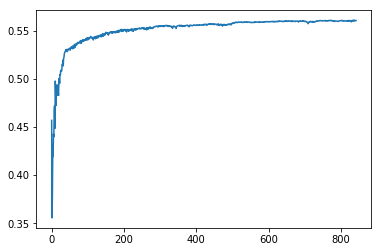

In [103]:
plt.plot(scores);

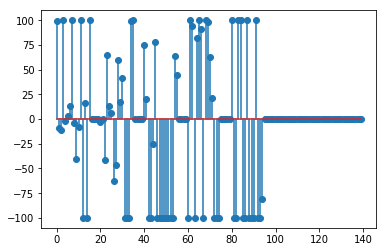

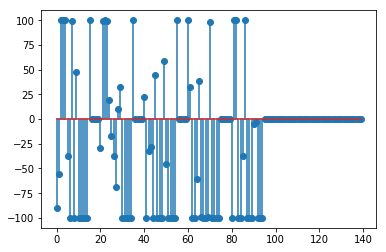

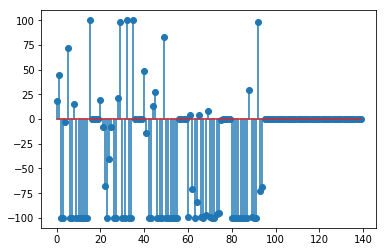

In [94]:
buvwx, buvwy, buvwz = T.reshape((3,-1))
plt.stem(buvwx);
plt.show();
plt.stem(buvwy);
plt.show();
plt.stem(buvwz);
plt.show();

# Draw results

In [95]:
local_params, centroid_m, centroid_f, xdim_m, ydim_m, zdim_m, xdim_f, ydim_f, zdim_f = \
(T, 
  aligner.centroid_m, aligner.centroid_f,
  aligner.xdim_m, aligner.ydim_m, aligner.zdim_m, 
  aligner.xdim_f, aligner.ydim_f, aligner.zdim_f)

Compute NuPx/NvPy/NwPz: 3.40 seconds.
Compute NuNvNw: 1.41 seconds.


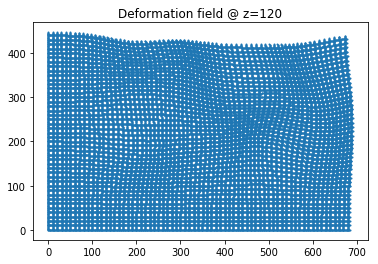

In [96]:
def return_gridline_points(xs, ys, w, h):
    grid_points = np.array([(x,y,120) for x in range(w) for y in ys] + [(x,y,120) for x in xs for y in range(h)])
    return grid_points

grid_points = return_gridline_points(range(0,volume_fixed[1].shape[1],10), 
                                     range(0,volume_fixed[1].shape[0],10), 
                                     volume_fixed[1].shape[1], 
                                     volume_fixed[1].shape[0])

warped_grid_points = transform_points_bspline(buvwx, buvwy, buvwz, 
                                              volume_shape=(xdim_m, ydim_m, zdim_m), interval=100, 
                                              pts=grid_points, c=centroid_m, c_prime=centroid_f)

# plt.figure(figsize=(10, 10));
plt.scatter(warped_grid_points[:,0], warped_grid_points[:,1], s=1)
plt.title('Deformation field @ z=120')
plt.show()

In [97]:
# local_params, centroid_m, centroid_f, xdim_m, ydim_m, zdim_m, xdim_f, ydim_f, zdim_f = \
# ([1,0,0,0,0,1,0,0,0,0,1,0], 
#   aligner.centroid_m, aligner.centroid_f,
#   aligner.xdim_m, aligner.ydim_m, aligner.zdim_m, 
#   aligner.xdim_f, aligner.ydim_f, aligner.zdim_f)

# Read global tx
# global_transformed_moving_structure_vols = \
# DataManager.load_transformed_volume_all_known_structures(stack_m=stack_moving, stack_f=stack_fixed,
#                                     classifier_setting_m=classifier_setting,
#                                     classifier_setting_f=classifier_setting,
#                                     warp_setting=upstream_warp_setting)

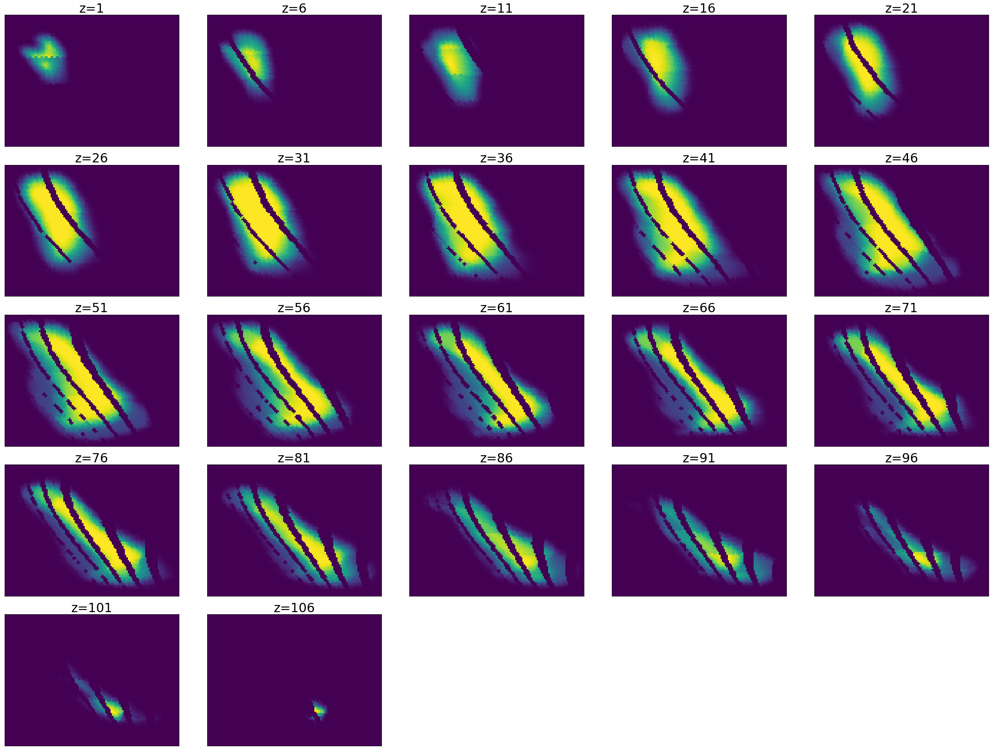

In [98]:
display_volume_sections(vols_m2f[structure_to_label_moving['Sp5C_L']].astype(np.float))

In [ ]:
vols_m2f = {}
vols_m2f_bboxes = {}
vols_m2f_g = {}
vols_m2f_g_bboxes = {}

for ind_m, v in volume_moving.iteritems():

    vol_m2f_g_bbox = bbox_3d(v)
    vol_m2f_g_xmin, vol_m2f_g_xmax, vol_m2f_g_ymin, vol_m2f_g_ymax, vol_m2f_g_zmin, vol_m2f_g_zmax = vol_m2f_g_bbox
    vol_m2f_g = v[vol_m2f_g_ymin:vol_m2f_g_ymax+1, 
                                                        vol_m2f_g_xmin:vol_m2f_g_xmax+1,
                                                        vol_m2f_g_zmin:vol_m2f_g_zmax+1]
    
    vol_m2f, vol_m2f_bbox = \
    transform_volume_bspline((vol_m2f_g, vol_m2f_g_bbox), buvwx, buvwy, buvwz, 
                             volume_shape=(xdim_m, ydim_m, zdim_m), 
                             interval=100, 
                             centroid_m=centroid_m, centroid_f=centroid_f)
    
    vols_m2f[ind_m] = vol_m2f
    vols_m2f_bboxes[ind_m] = vol_m2f_bbox
    
    vols_m2f_g[ind_m] = vol_m2f_g
    vols_m2f_g_bboxes[ind_m] = vol_m2f_g_bbox

In [100]:
# Set colors for different contour level
levels = [0.1, 0.25, 0.5, 0.75, .99]
# levels = [0.5]
level_colors = {level: (int(level*255),0,0) for level in levels}
level_colors2 = {level: (0,int(level*255),0) for level in levels}

0 684 0 447 100 496
rm -rf /shared/CSHL_data_processed/MD635/MD635_thumbnail_alignedTo_MD635-F63-2016.05.19-08.39.03_MD635_2_0188_cropped/MD635-F95-2016.05.19-18.49.58_MD635_2_0284_thumbnail_alignedTo_MD635-F63-2016.05.19-08.39.03_MD635_2_0188_cropped.tif && mkdir -p /shared/CSHL_data_processed/MD635/MD635_thumbnail_alignedTo_MD635-F63-2016.05.19-08.39.03_MD635_2_0188_cropped
aws s3 cp s3://mousebrainatlas-data/CSHL_data_processed/MD635/MD635_thumbnail_alignedTo_MD635-F63-2016.05.19-08.39.03_MD635_2_0188_cropped/MD635-F95-2016.05.19-18.49.58_MD635_2_0284_thumbnail_alignedTo_MD635-F63-2016.05.19-08.39.03_MD635_2_0188_cropped.tif /shared/CSHL_data_processed/MD635/MD635_thumbnail_alignedTo_MD635-F63-2016.05.19-08.39.03_MD635_2_0188_cropped/MD635-F95-2016.05.19-18.49.58_MD635_2_0284_thumbnail_alignedTo_MD635-F63-2016.05.19-08.39.03_MD635_2_0188_cropped.tif
228


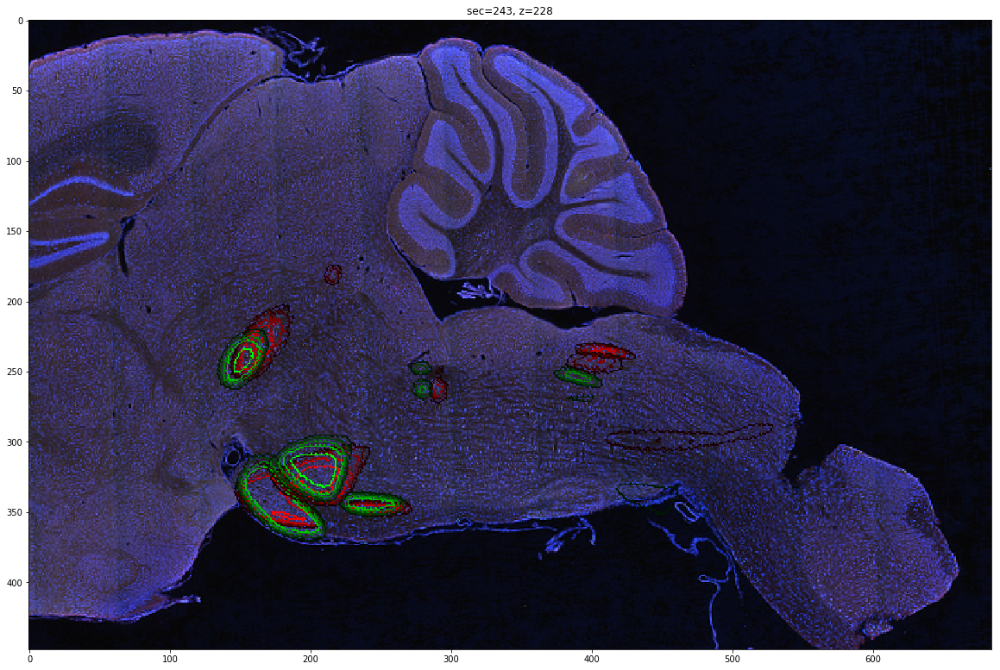

rm -rf /shared/CSHL_data_processed/MD635/MD635_thumbnail_alignedTo_MD635-F63-2016.05.19-08.39.03_MD635_2_0188_cropped/MD635-F98-2016.05.19-19.46.20_MD635_1_0292_thumbnail_alignedTo_MD635-F63-2016.05.19-08.39.03_MD635_2_0188_cropped.tif && mkdir -p /shared/CSHL_data_processed/MD635/MD635_thumbnail_alignedTo_MD635-F63-2016.05.19-08.39.03_MD635_2_0188_cropped
aws s3 cp s3://mousebrainatlas-data/CSHL_data_processed/MD635/MD635_thumbnail_alignedTo_MD635-F63-2016.05.19-08.39.03_MD635_2_0188_cropped/MD635-F98-2016.05.19-19.46.20_MD635_1_0292_thumbnail_alignedTo_MD635-F63-2016.05.19-08.39.03_MD635_2_0188_cropped.tif /shared/CSHL_data_processed/MD635/MD635_thumbnail_alignedTo_MD635-F63-2016.05.19-08.39.03_MD635_2_0188_cropped/MD635-F98-2016.05.19-19.46.20_MD635_1_0292_thumbnail_alignedTo_MD635-F63-2016.05.19-08.39.03_MD635_2_0188_cropped.tif
235


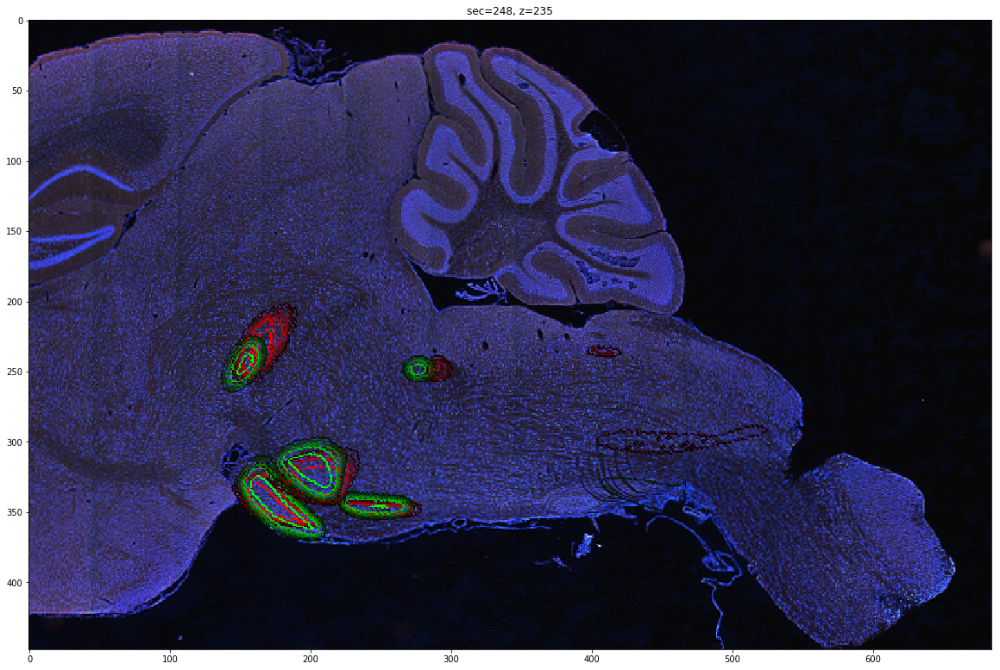

rm -rf /shared/CSHL_data_processed/MD635/MD635_thumbnail_alignedTo_MD635-F63-2016.05.19-08.39.03_MD635_2_0188_cropped/MD635-F100-2016.05.19-20.25.22_MD635_2_0299_thumbnail_alignedTo_MD635-F63-2016.05.19-08.39.03_MD635_2_0188_cropped.tif && mkdir -p /shared/CSHL_data_processed/MD635/MD635_thumbnail_alignedTo_MD635-F63-2016.05.19-08.39.03_MD635_2_0188_cropped
aws s3 cp s3://mousebrainatlas-data/CSHL_data_processed/MD635/MD635_thumbnail_alignedTo_MD635-F63-2016.05.19-08.39.03_MD635_2_0188_cropped/MD635-F100-2016.05.19-20.25.22_MD635_2_0299_thumbnail_alignedTo_MD635-F63-2016.05.19-08.39.03_MD635_2_0188_cropped.tif /shared/CSHL_data_processed/MD635/MD635_thumbnail_alignedTo_MD635-F63-2016.05.19-08.39.03_MD635_2_0188_cropped/MD635-F100-2016.05.19-20.25.22_MD635_2_0299_thumbnail_alignedTo_MD635-F63-2016.05.19-08.39.03_MD635_2_0188_cropped.tif
241


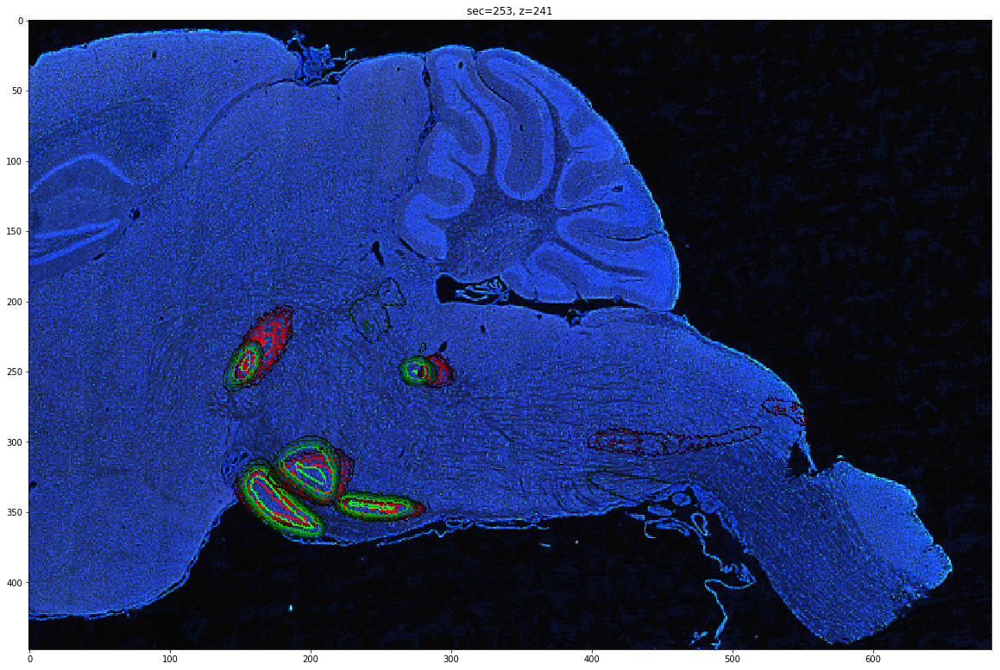

rm -rf /shared/CSHL_data_processed/MD635/MD635_thumbnail_alignedTo_MD635-F63-2016.05.19-08.39.03_MD635_2_0188_cropped/MD635-F103-2016.05.19-21.14.34_MD635_1_0307_thumbnail_alignedTo_MD635-F63-2016.05.19-08.39.03_MD635_2_0188_cropped.tif && mkdir -p /shared/CSHL_data_processed/MD635/MD635_thumbnail_alignedTo_MD635-F63-2016.05.19-08.39.03_MD635_2_0188_cropped
aws s3 cp s3://mousebrainatlas-data/CSHL_data_processed/MD635/MD635_thumbnail_alignedTo_MD635-F63-2016.05.19-08.39.03_MD635_2_0188_cropped/MD635-F103-2016.05.19-21.14.34_MD635_1_0307_thumbnail_alignedTo_MD635-F63-2016.05.19-08.39.03_MD635_2_0188_cropped.tif /shared/CSHL_data_processed/MD635/MD635_thumbnail_alignedTo_MD635-F63-2016.05.19-08.39.03_MD635_2_0188_cropped/MD635-F103-2016.05.19-21.14.34_MD635_1_0307_thumbnail_alignedTo_MD635-F63-2016.05.19-08.39.03_MD635_2_0188_cropped.tif
248


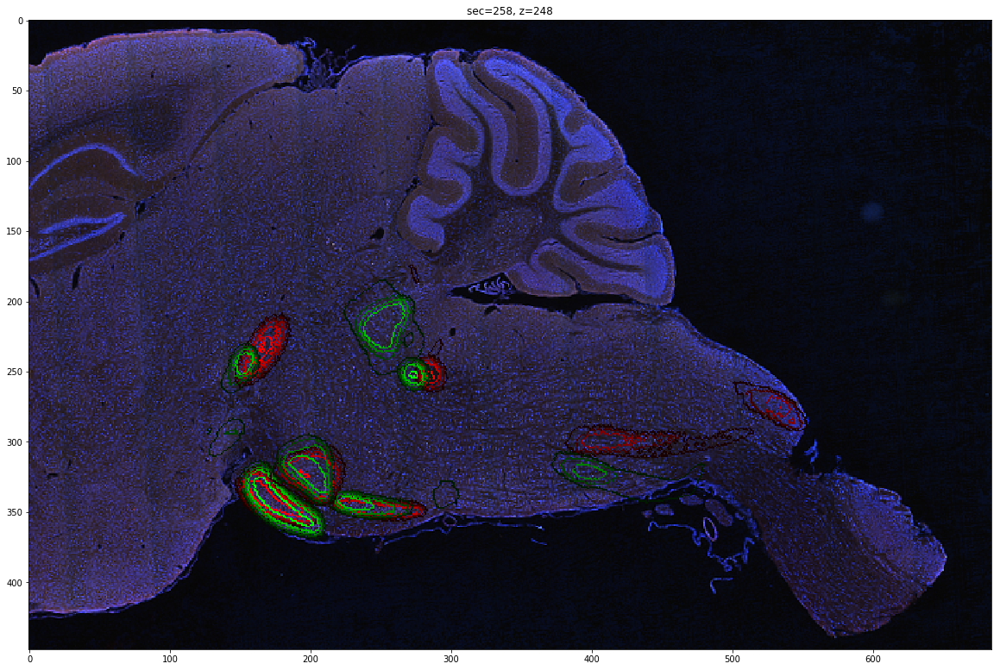

rm -rf /shared/CSHL_data_processed/MD635/MD635_thumbnail_alignedTo_MD635-F63-2016.05.19-08.39.03_MD635_2_0188_cropped/MD635-F105-2016.05.19-21.45.41_MD635_2_0314_thumbnail_alignedTo_MD635-F63-2016.05.19-08.39.03_MD635_2_0188_cropped.tif && mkdir -p /shared/CSHL_data_processed/MD635/MD635_thumbnail_alignedTo_MD635-F63-2016.05.19-08.39.03_MD635_2_0188_cropped
aws s3 cp s3://mousebrainatlas-data/CSHL_data_processed/MD635/MD635_thumbnail_alignedTo_MD635-F63-2016.05.19-08.39.03_MD635_2_0188_cropped/MD635-F105-2016.05.19-21.45.41_MD635_2_0314_thumbnail_alignedTo_MD635-F63-2016.05.19-08.39.03_MD635_2_0188_cropped.tif /shared/CSHL_data_processed/MD635/MD635_thumbnail_alignedTo_MD635-F63-2016.05.19-08.39.03_MD635_2_0188_cropped/MD635-F105-2016.05.19-21.45.41_MD635_2_0314_thumbnail_alignedTo_MD635-F63-2016.05.19-08.39.03_MD635_2_0188_cropped.tif
255


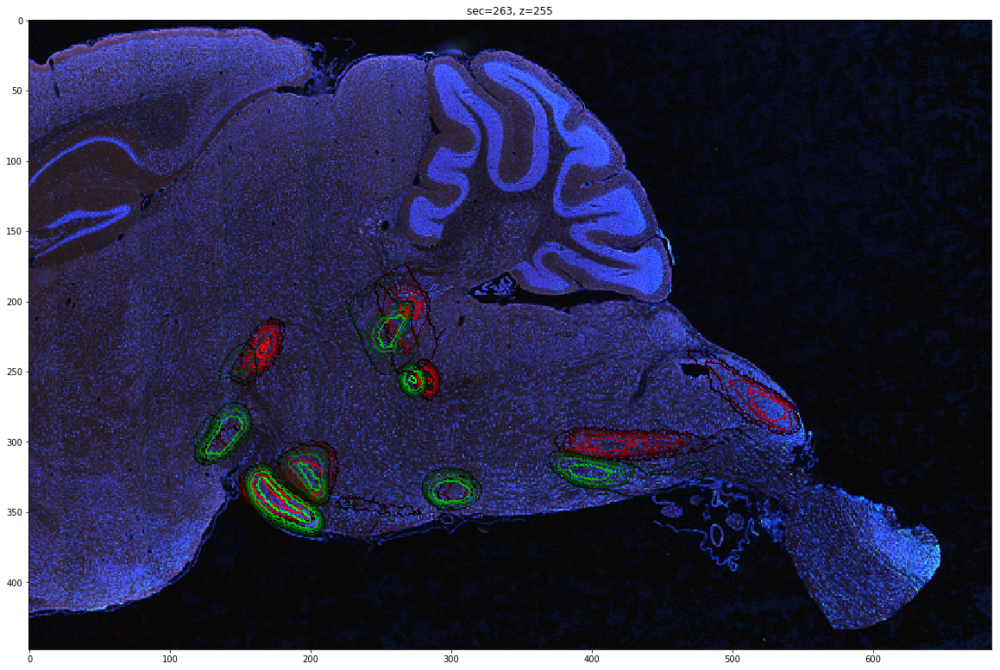

rm -rf /shared/CSHL_data_processed/MD635/MD635_thumbnail_alignedTo_MD635-F63-2016.05.19-08.39.03_MD635_2_0188_cropped/MD635-F108-2016.05.19-22.32.40_MD635_1_0322_thumbnail_alignedTo_MD635-F63-2016.05.19-08.39.03_MD635_2_0188_cropped.tif && mkdir -p /shared/CSHL_data_processed/MD635/MD635_thumbnail_alignedTo_MD635-F63-2016.05.19-08.39.03_MD635_2_0188_cropped
aws s3 cp s3://mousebrainatlas-data/CSHL_data_processed/MD635/MD635_thumbnail_alignedTo_MD635-F63-2016.05.19-08.39.03_MD635_2_0188_cropped/MD635-F108-2016.05.19-22.32.40_MD635_1_0322_thumbnail_alignedTo_MD635-F63-2016.05.19-08.39.03_MD635_2_0188_cropped.tif /shared/CSHL_data_processed/MD635/MD635_thumbnail_alignedTo_MD635-F63-2016.05.19-08.39.03_MD635_2_0188_cropped/MD635-F108-2016.05.19-22.32.40_MD635_1_0322_thumbnail_alignedTo_MD635-F63-2016.05.19-08.39.03_MD635_2_0188_cropped.tif
262


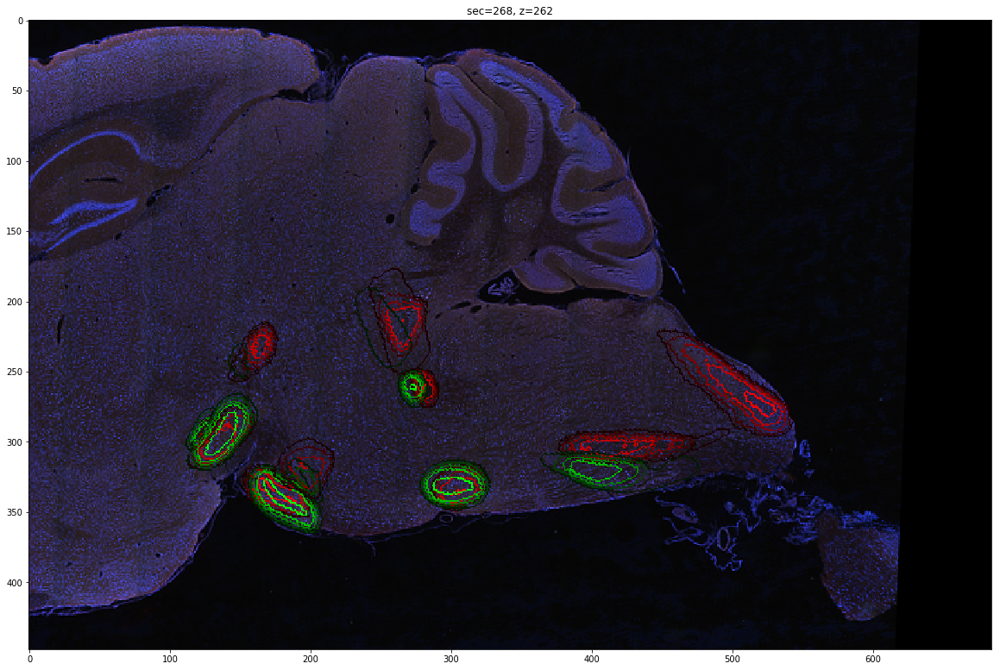

rm -rf /shared/CSHL_data_processed/MD635/MD635_thumbnail_alignedTo_MD635-F63-2016.05.19-08.39.03_MD635_2_0188_cropped/MD635-F110-2016.05.19-23.00.00_MD635_2_0329_thumbnail_alignedTo_MD635-F63-2016.05.19-08.39.03_MD635_2_0188_cropped.tif && mkdir -p /shared/CSHL_data_processed/MD635/MD635_thumbnail_alignedTo_MD635-F63-2016.05.19-08.39.03_MD635_2_0188_cropped
aws s3 cp s3://mousebrainatlas-data/CSHL_data_processed/MD635/MD635_thumbnail_alignedTo_MD635-F63-2016.05.19-08.39.03_MD635_2_0188_cropped/MD635-F110-2016.05.19-23.00.00_MD635_2_0329_thumbnail_alignedTo_MD635-F63-2016.05.19-08.39.03_MD635_2_0188_cropped.tif /shared/CSHL_data_processed/MD635/MD635_thumbnail_alignedTo_MD635-F63-2016.05.19-08.39.03_MD635_2_0188_cropped/MD635-F110-2016.05.19-23.00.00_MD635_2_0329_thumbnail_alignedTo_MD635-F63-2016.05.19-08.39.03_MD635_2_0188_cropped.tif
269


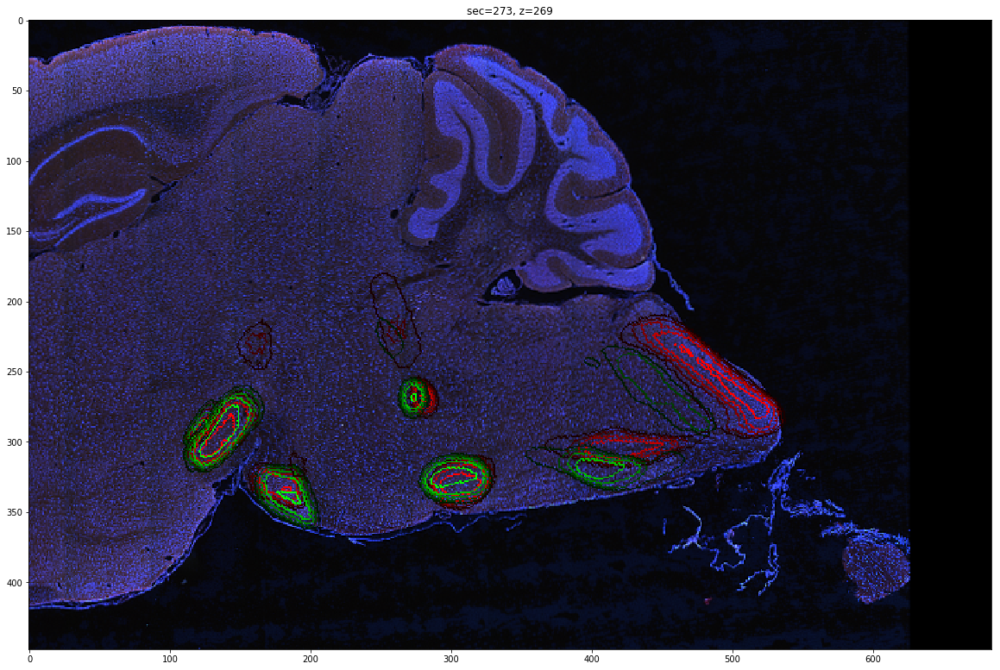

rm -rf /shared/CSHL_data_processed/MD635/MD635_thumbnail_alignedTo_MD635-F63-2016.05.19-08.39.03_MD635_2_0188_cropped/MD635-F113-2016.05.19-23.40.05_MD635_1_0337_thumbnail_alignedTo_MD635-F63-2016.05.19-08.39.03_MD635_2_0188_cropped.tif && mkdir -p /shared/CSHL_data_processed/MD635/MD635_thumbnail_alignedTo_MD635-F63-2016.05.19-08.39.03_MD635_2_0188_cropped
aws s3 cp s3://mousebrainatlas-data/CSHL_data_processed/MD635/MD635_thumbnail_alignedTo_MD635-F63-2016.05.19-08.39.03_MD635_2_0188_cropped/MD635-F113-2016.05.19-23.40.05_MD635_1_0337_thumbnail_alignedTo_MD635-F63-2016.05.19-08.39.03_MD635_2_0188_cropped.tif /shared/CSHL_data_processed/MD635/MD635_thumbnail_alignedTo_MD635-F63-2016.05.19-08.39.03_MD635_2_0188_cropped/MD635-F113-2016.05.19-23.40.05_MD635_1_0337_thumbnail_alignedTo_MD635-F63-2016.05.19-08.39.03_MD635_2_0188_cropped.tif
275


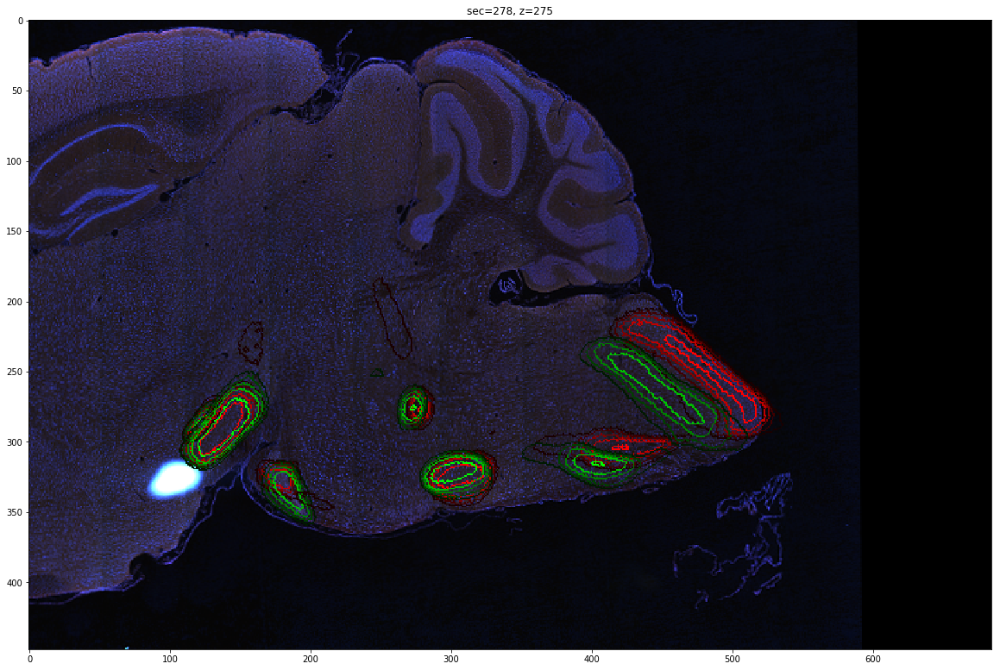

rm -rf /shared/CSHL_data_processed/MD635/MD635_thumbnail_alignedTo_MD635-F63-2016.05.19-08.39.03_MD635_2_0188_cropped/MD635-F114-2016.05.19-23.57.07_MD635_3_0342_thumbnail_alignedTo_MD635-F63-2016.05.19-08.39.03_MD635_2_0188_cropped.tif && mkdir -p /shared/CSHL_data_processed/MD635/MD635_thumbnail_alignedTo_MD635-F63-2016.05.19-08.39.03_MD635_2_0188_cropped
aws s3 cp s3://mousebrainatlas-data/CSHL_data_processed/MD635/MD635_thumbnail_alignedTo_MD635-F63-2016.05.19-08.39.03_MD635_2_0188_cropped/MD635-F114-2016.05.19-23.57.07_MD635_3_0342_thumbnail_alignedTo_MD635-F63-2016.05.19-08.39.03_MD635_2_0188_cropped.tif /shared/CSHL_data_processed/MD635/MD635_thumbnail_alignedTo_MD635-F63-2016.05.19-08.39.03_MD635_2_0188_cropped/MD635-F114-2016.05.19-23.57.07_MD635_3_0342_thumbnail_alignedTo_MD635-F63-2016.05.19-08.39.03_MD635_2_0188_cropped.tif
282


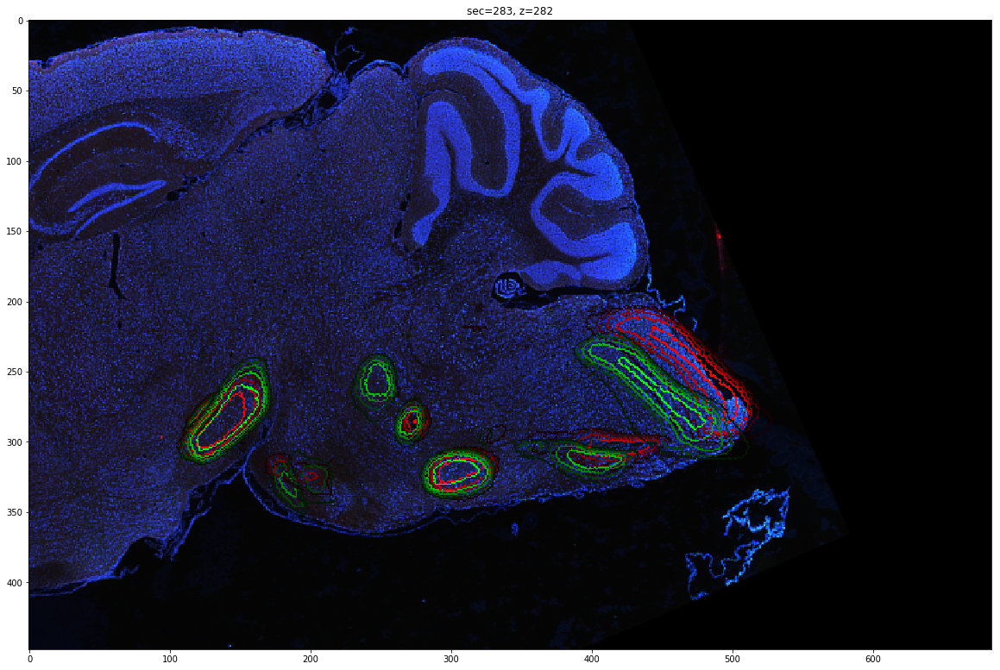

rm -rf /shared/CSHL_data_processed/MD635/MD635_thumbnail_alignedTo_MD635-F63-2016.05.19-08.39.03_MD635_2_0188_cropped/MD635-F116-2016.05.20-00.31.07_MD635_2_0347_thumbnail_alignedTo_MD635-F63-2016.05.19-08.39.03_MD635_2_0188_cropped.tif && mkdir -p /shared/CSHL_data_processed/MD635/MD635_thumbnail_alignedTo_MD635-F63-2016.05.19-08.39.03_MD635_2_0188_cropped
aws s3 cp s3://mousebrainatlas-data/CSHL_data_processed/MD635/MD635_thumbnail_alignedTo_MD635-F63-2016.05.19-08.39.03_MD635_2_0188_cropped/MD635-F116-2016.05.20-00.31.07_MD635_2_0347_thumbnail_alignedTo_MD635-F63-2016.05.19-08.39.03_MD635_2_0188_cropped.tif /shared/CSHL_data_processed/MD635/MD635_thumbnail_alignedTo_MD635-F63-2016.05.19-08.39.03_MD635_2_0188_cropped/MD635-F116-2016.05.20-00.31.07_MD635_2_0347_thumbnail_alignedTo_MD635-F63-2016.05.19-08.39.03_MD635_2_0188_cropped.tif
289


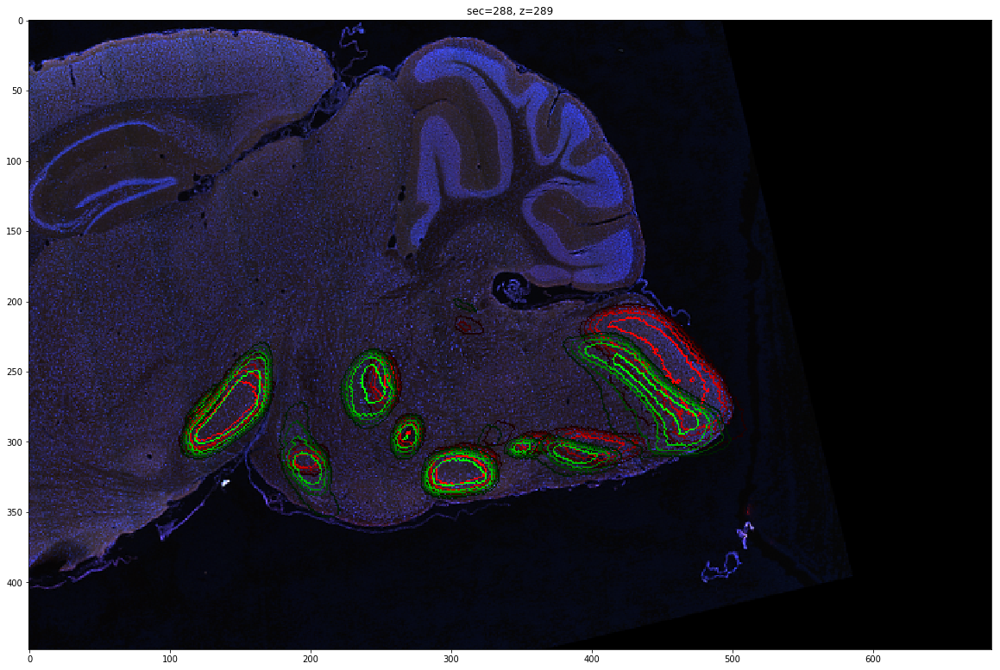

rm -rf /shared/CSHL_data_processed/MD635/MD635_thumbnail_alignedTo_MD635-F63-2016.05.19-08.39.03_MD635_2_0188_cropped/MD635-F118-2016.05.20-01.05.52_MD635_1_0352_thumbnail_alignedTo_MD635-F63-2016.05.19-08.39.03_MD635_2_0188_cropped.tif && mkdir -p /shared/CSHL_data_processed/MD635/MD635_thumbnail_alignedTo_MD635-F63-2016.05.19-08.39.03_MD635_2_0188_cropped
aws s3 cp s3://mousebrainatlas-data/CSHL_data_processed/MD635/MD635_thumbnail_alignedTo_MD635-F63-2016.05.19-08.39.03_MD635_2_0188_cropped/MD635-F118-2016.05.20-01.05.52_MD635_1_0352_thumbnail_alignedTo_MD635-F63-2016.05.19-08.39.03_MD635_2_0188_cropped.tif /shared/CSHL_data_processed/MD635/MD635_thumbnail_alignedTo_MD635-F63-2016.05.19-08.39.03_MD635_2_0188_cropped/MD635-F118-2016.05.20-01.05.52_MD635_1_0352_thumbnail_alignedTo_MD635-F63-2016.05.19-08.39.03_MD635_2_0188_cropped.tif
296


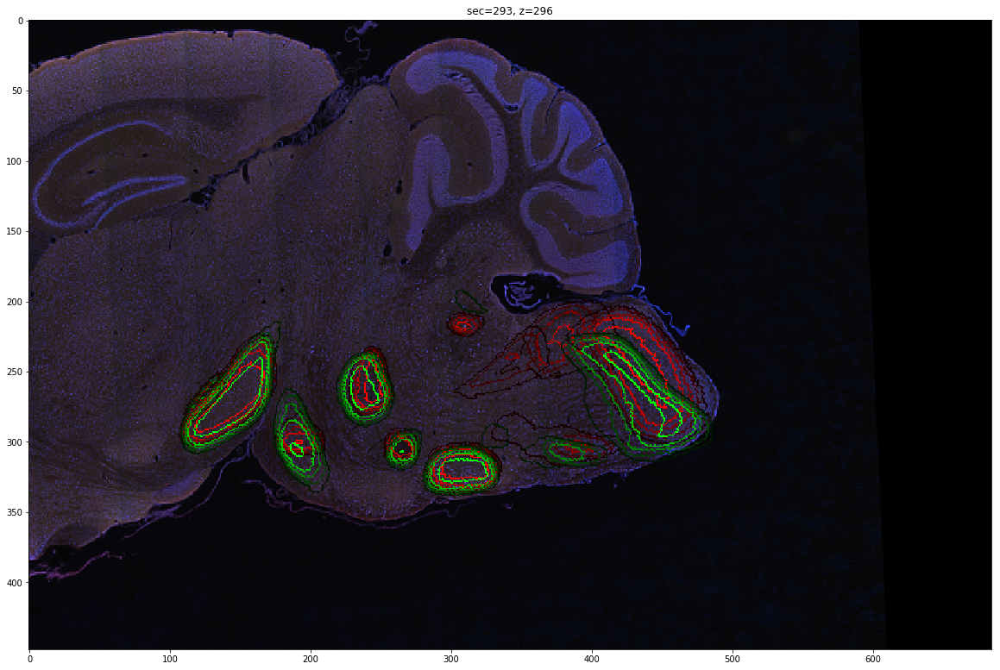

rm -rf /shared/CSHL_data_processed/MD635/MD635_thumbnail_alignedTo_MD635-F63-2016.05.19-08.39.03_MD635_2_0188_cropped/MD635-F119-2016.05.20-01.22.34_MD635_3_0357_thumbnail_alignedTo_MD635-F63-2016.05.19-08.39.03_MD635_2_0188_cropped.tif && mkdir -p /shared/CSHL_data_processed/MD635/MD635_thumbnail_alignedTo_MD635-F63-2016.05.19-08.39.03_MD635_2_0188_cropped
aws s3 cp s3://mousebrainatlas-data/CSHL_data_processed/MD635/MD635_thumbnail_alignedTo_MD635-F63-2016.05.19-08.39.03_MD635_2_0188_cropped/MD635-F119-2016.05.20-01.22.34_MD635_3_0357_thumbnail_alignedTo_MD635-F63-2016.05.19-08.39.03_MD635_2_0188_cropped.tif /shared/CSHL_data_processed/MD635/MD635_thumbnail_alignedTo_MD635-F63-2016.05.19-08.39.03_MD635_2_0188_cropped/MD635-F119-2016.05.20-01.22.34_MD635_3_0357_thumbnail_alignedTo_MD635-F63-2016.05.19-08.39.03_MD635_2_0188_cropped.tif
302


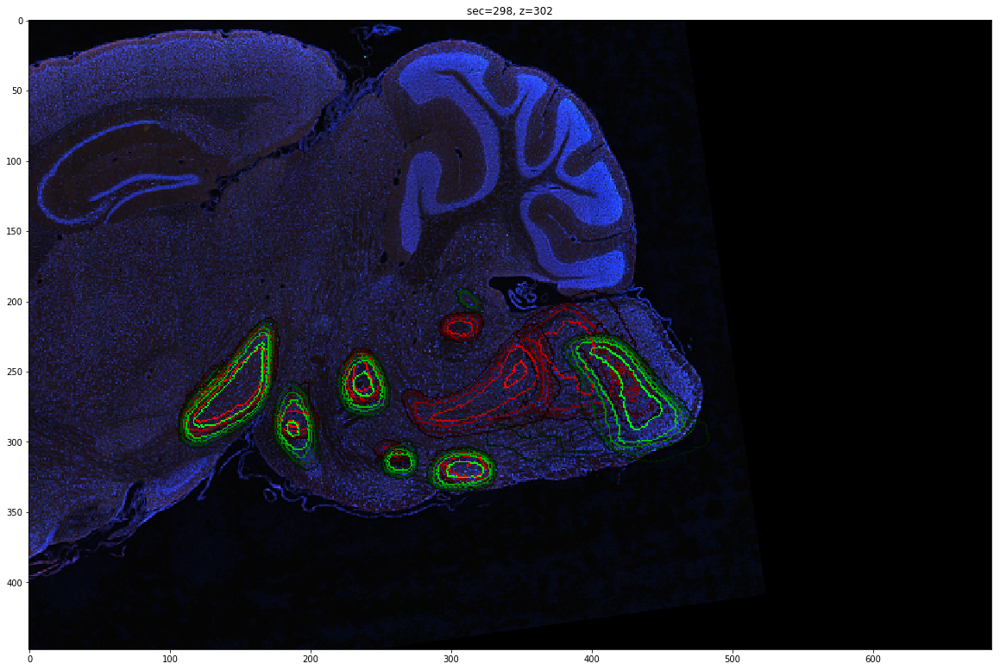

In [101]:
# Generate overlay visualization

# estimate mapping between z and section
# downsample_factor = 32
# xy_pixel_distance_downsampled = XY_PIXEL_DISTANCE_LOSSLESS * downsample_factor
# voxel_z_size = SECTION_THICKNESS / xy_pixel_distance_downsampled

# For getting correct contour location
xmin_vol_f, xmax_vol_f, ymin_vol_f, ymax_vol_f, zmin_vol_f, zmax_vol_f = \
DataManager.load_original_volume_bbox(stack=stack_fixed, vol_type='score', structure='7N', 
                             downscale=32, classifier_setting=classifier_setting)
print xmin_vol_f, xmax_vol_f, ymin_vol_f, ymax_vol_f, zmin_vol_f, zmax_vol_f

# Generate atlas overlay image for every section

zf, zl = vols_m2f_bboxes[structure_to_label_moving['Sp5C_R']][4:]
sec_first = DataManager.convert_z_to_section(stack=stack_fixed, z=zf, downsample=32)
sec_last = DataManager.convert_z_to_section(stack=stack_fixed, z=zl, downsample=32)

for sec in range(sec_first, sec_last+1, 5):
# for sec in [181]:

    if is_invalid(stack=stack_fixed, sec=sec):
        continue

    try:
        img = DataManager.load_image(stack=stack_fixed, section=sec, resol='thumbnail', version='cropped_tif')
#         sc_viz_fp = DataManager.get_scoremap_viz_filepath(stack=stack_fixed, section=sec, 
#                                                            downscale=32,
#                                                            structure=convert_to_original_name('7N_L'), 
#                                                            classifier_id=classifier_setting)
#         download_from_s3(sc_viz_fp)
#         img = imread(sc_viz_fp)
    except:
        sys.stderr.write('Error loading scoremap for section %d\n' % sec)
        continue

#     img = img[::4, ::4]

    viz = img.copy()

    z1, z2 = DataManager.convert_section_to_z(stack=stack_fixed, sec=sec, downsample=32)
    z = int(z1)
    print z
         
    # Find moving volume annotation contours
    
    for ind_m in vols_m2f.keys():
        vol_m2f = vols_m2f[ind_m]
        vol_m2f_bbox = vols_m2f_bboxes[ind_m]
        vol_m2f_g = vols_m2f_g[ind_m]
        vol_m2f_g_bbox = vols_m2f_g_bboxes[ind_m]
        
        if z >= vol_m2f_bbox[4] and z < vol_m2f_bbox[4] + vol_m2f.shape[2]:

            c = 0
            for level in levels:
                cnts = find_contours(vol_m2f[..., z - vol_m2f_bbox[4]], level=level) # rows, cols
                c += len(cnts)
                for cnt in cnts:
                    # r,c to x,y
                    cnt_on_cropped = cnt[:,::-1] + (xmin_vol_f, ymin_vol_f) + (vol_m2f_bbox[0], vol_m2f_bbox[2])
                    cv2.polylines(viz, [cnt_on_cropped.astype(np.int)], True, level_colors[level], 1)
            
        if z >= vol_m2f_g_bbox[4] and z < vol_m2f_g_bbox[4] + vol_m2f_g.shape[2]:
                    
            for level in levels:
                cnts = find_contours(vol_m2f_g[..., z - vol_m2f_g_bbox[4]], level=level) # rows, cols
                c += len(cnts)
                for cnt in cnts:
                    # r,c to x,y
                    cnt_on_cropped = cnt[:,::-1] + (xmin_vol_f, ymin_vol_f) + (vol_m2f_g_bbox[0], vol_m2f_g_bbox[2])
                    cv2.polylines(viz, [cnt_on_cropped.astype(np.int)], True, level_colors2[level], 1)

    if c > 0:    
        plt.figure(figsize=(20, 20));
        plt.title("sec=%d, z=%d" % (sec, z));
        plt.imshow(viz);
        plt.show();